# Table des matières 

* [Chapitre 1 : Les données ](#chapter1)
    * [Section 1.1 : Import des bibliothèques ](#section_1_1)
    * [Section 1.2 : Série de valeurs ](#section_1_2)
    * [Section 1.3 : Définition générale de la crypto ](#section_1_3)
    * [Section 1.4 : Dernière news à propos de la crypto ](#section_1_4)
* [Chapitre 2 : Data Analysis ](#chapter2)
    * [Section 2.1 : Bandes de bollinger ](#section_2_1)
    * [Section 2.2 : Moving Average fast slow (cross point) ](#section_2_1)
* [Chapitre 3 : Trading prediction using momentum strategy ](#chapter3)
    * [Section 3.1 : Règles de décision ](#section_3_1)

## Les données <a class="anchor" id="chapter1"></a>

### Import des bibliothèques <a class="anchor" id="section_1_1"></a>

In [1]:
# import librairies

import pandas as pd
import yfinance as yf
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_row',None)
pd.set_option('display.max_columns',None)

In [2]:
cours = 'BTC-EUR'

actif = yf.Ticker(cours)

hist = actif.history(period="max",interval='1d')

In [3]:
hist.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2014-09-17,359.546204,361.468506,351.586884,355.957367,16389166,0,0
2014-09-18,355.588409,355.505402,319.789459,328.539368,26691849,0,0
2014-09-19,328.278503,330.936707,298.921021,307.761139,29560103,0,0
2014-09-20,307.665253,329.978180,303.931244,318.758972,28736826,0,0
2014-09-21,318.120514,321.504517,306.502197,310.632446,20702625,0,0


#### Définition générale de la crypto <a class="anchor" id="section_1_3"></a>

In [4]:
for key in actif.info.keys(): 
    print(f"'{key}',")

'companyOfficers',
'name',
'startDate',
'description',
'maxAge',
'exchange',
'shortName',
'exchangeTimezoneName',
'exchangeTimezoneShortName',
'isEsgPopulated',
'gmtOffSetMilliseconds',
'quoteType',
'symbol',
'messageBoardId',
'market',
'previousClose',
'regularMarketOpen',
'twoHundredDayAverage',
'trailingAnnualDividendYield',
'payoutRatio',
'volume24Hr',
'regularMarketDayHigh',
'navPrice',
'averageDailyVolume10Day',
'totalAssets',
'regularMarketPreviousClose',
'fiftyDayAverage',
'trailingAnnualDividendRate',
'open',
'toCurrency',
'averageVolume10days',
'expireDate',
'yield',
'algorithm',
'dividendRate',
'exDividendDate',
'beta',
'circulatingSupply',
'regularMarketDayLow',
'priceHint',
'currency',
'regularMarketVolume',
'lastMarket',
'maxSupply',
'openInterest',
'marketCap',
'volumeAllCurrencies',
'strikePrice',
'averageVolume',
'priceToSalesTrailing12Months',
'dayLow',
'ask',
'ytdReturn',
'askSize',
'volume',
'fiftyTwoWeekHigh',
'forwardPE',
'fromCurrency',
'fiveYearAvgDividendYield'

In [5]:
actif.info

{'companyOfficers': [],
 'name': 'Bitcoin',
 'startDate': 1367107200,
 'description': 'Bitcoin (BTC) is a cryptocurrency . Users are able to generate BTC through the process of mining. Bitcoin has a current supply of 19,101,481. The last known price of Bitcoin is 22,433.38135481 USD and is down -1.68 over the last 24 hours. It is currently trading on 9633 active market(s) with $24,498,273,852.86 traded over the last 24 hours. More information can be found at https://bitcoin.org/.',
 'maxAge': 1,
 'exchange': 'CCC',
 'shortName': 'Bitcoin EUR',
 'exchangeTimezoneName': 'UTC',
 'exchangeTimezoneShortName': 'UTC',
 'isEsgPopulated': False,
 'gmtOffSetMilliseconds': '0',
 'quoteType': 'CRYPTOCURRENCY',
 'symbol': 'BTC-EUR',
 'messageBoardId': 'finmb_BTC_CCC',
 'market': 'ccc_market',
 'previousClose': 22063.945,
 'regularMarketOpen': 22063.945,
 'twoHundredDayAverage': 31969.926,
 'trailingAnnualDividendYield': None,
 'payoutRatio': None,
 'volume24Hr': 25369686016,
 'regularMarketDayHigh'

#### Dernière news à propos de la crypto <a class="anchor" id="section_1_4"></a>

In [6]:
actif.news

[{'uuid': '45c2b392-3f23-3ffa-9f91-b5cbf759c4b0',
  'title': 'When Should You Buy Alphabet Inc. (NASDAQ:GOOGL)?',
  'publisher': 'Simply Wall St.',
  'link': 'https://finance.yahoo.com/news/buy-alphabet-inc-nasdaq-googl-131641070.html',
  'providerPublishTime': 1658668601,
  'type': 'STORY',
  'thumbnail': {'resolutions': [{'url': 'https://s.yimg.com/uu/api/res/1.2/XB6YPxl3wEaKh_BhXQA6lw--~B/aD00MzI7dz0xMTk0O2FwcGlkPXl0YWNoeW9u/https://s.yimg.com/uu/api/res/1.2/qFxOq7rHmi5HDVnxqXn6Rg--~B/aD00MzI7dz0xMTk0O2FwcGlkPXl0YWNoeW9u/https://media.zenfs.com/en/simply_wall_st__316/24a8be9e4dd93a7a5c866dec7c65e1eb',
     'width': 1194,
     'height': 432,
     'tag': 'original'},
    {'url': 'https://s.yimg.com/uu/api/res/1.2/JHhubAK1NkuVOsviCBkvNw--~B/Zmk9ZmlsbDtoPTE0MDtweW9mZj0wO3c9MTQwO2FwcGlkPXl0YWNoeW9u/https://s.yimg.com/uu/api/res/1.2/qFxOq7rHmi5HDVnxqXn6Rg--~B/aD00MzI7dz0xMTk0O2FwcGlkPXl0YWNoeW9u/https://media.zenfs.com/en/simply_wall_st__316/24a8be9e4dd93a7a5c866dec7c65e1eb',
     'width'

 - Phénomène continue  
 - Phénomène discret 


#### Interpretation du discret vers le continue (interpretation arrondi)

> - Théorie de l'échantillonage : phénomène continue -> qu'on échantillonne discret 
> - Théorie de l'interpolation : phénomène discret -> phénomène continue 

## Data Analysis <a class="anchor" id="chapter2"></a>

### Close distribution

In [7]:
import numpy as np

In [8]:
hist['Close'].describe()

count     2868.000000
mean     10841.747477
std      14265.521434
min        151.152512
25%        581.274902
50%       5691.071533
75%       9973.935303
max      58305.039062
Name: Close, dtype: float64

In [9]:
indic =(hist['Close']-min(hist['Close']))/(max(hist['Close'])-min(hist['Close']))*100

hist.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
2014-09-17,359.546204,361.468506,351.586884,355.957367,16389166,0,0
2014-09-18,355.588409,355.505402,319.789459,328.539368,26691849,0,0
2014-09-19,328.278503,330.936707,298.921021,307.761139,29560103,0,0
2014-09-20,307.665253,329.978180,303.931244,318.758972,28736826,0,0
2014-09-21,318.120514,321.504517,306.502197,310.632446,20702625,0,0


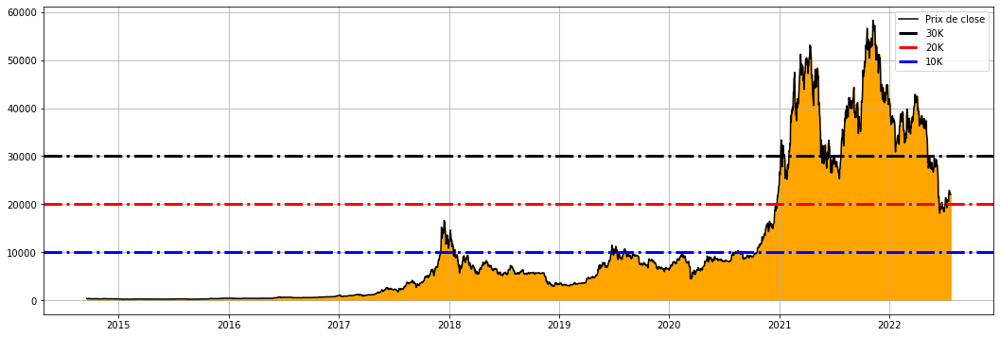

In [10]:
plt.figure(figsize=(18,6))
plt.plot(hist['Close'], c='black',label='Prix de close')
plt.fill_between(hist.index,0,hist['Close'],alpha=1,color='orange')

plt.axhline(y=30000,color='black',linestyle='dashdot',label='30K',lw=3)
plt.axhline(y=20000,color='red',linestyle='dashdot',label='20K',lw=3)
plt.axhline(y=10000,color='blue',linestyle='dashdot',label='10K',lw=3)


plt.legend()
plt.grid()

In [11]:
today = str(pd.to_datetime('now'))[:10]
print(today)

2022-07-24


In [12]:
start = str(pd.to_datetime('now') - pd.Timedelta(90, unit='d'))[:10]
print(start)

2022-04-25


In [13]:
# Focus sur les 3 derniers mois 
last_hist = hist[start:]

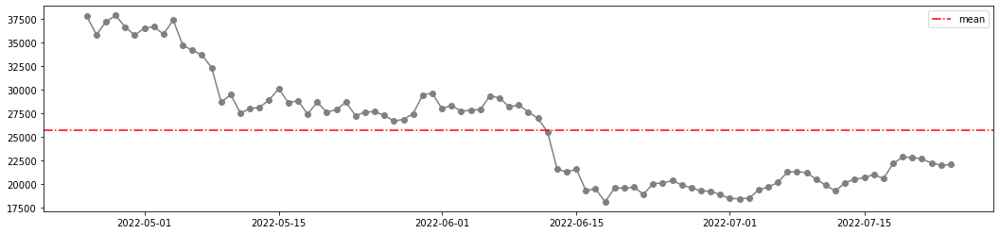

In [14]:
plt.figure(figsize=(18,4))
plt.plot(last_hist['Close'],marker='o',color='gray')
plt.axhline(y=np.mean(last_hist['Close']),color='red',linestyle='dashdot',label='mean')
plt.legend()

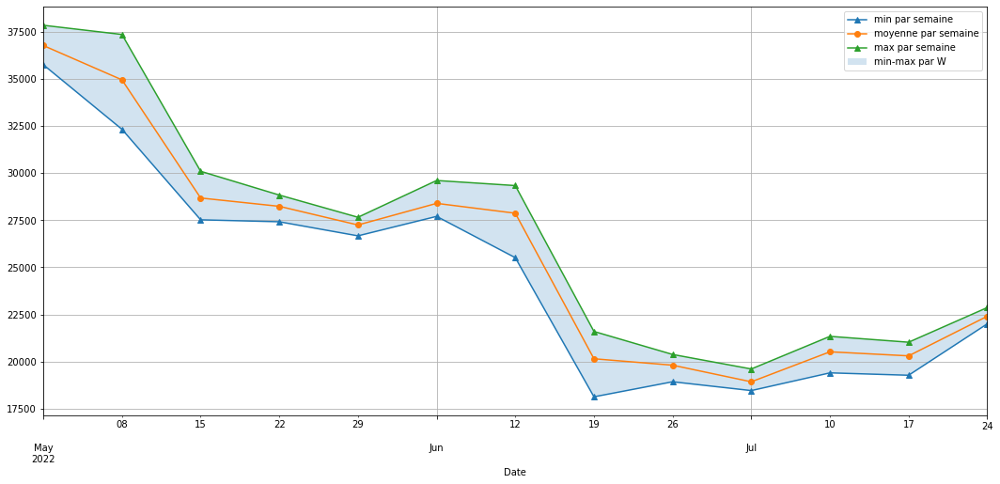

In [15]:
temporality = 'W'

m = last_hist['Close'].resample(temporality).agg(['mean', 'std', 'min', 'max'])

plt.figure(figsize=(18,8))
m['min'].plot(label='min par semaine',marker='^')
m['mean'].plot(label='moyenne par semaine',marker='o')
m['max'].plot(label='max par semaine',marker='^')
plt.fill_between(m.index, m['max'], m['min'], alpha=0.2, label='min-max par '+ temporality)
 
plt.grid()    
plt.legend()
plt.show()

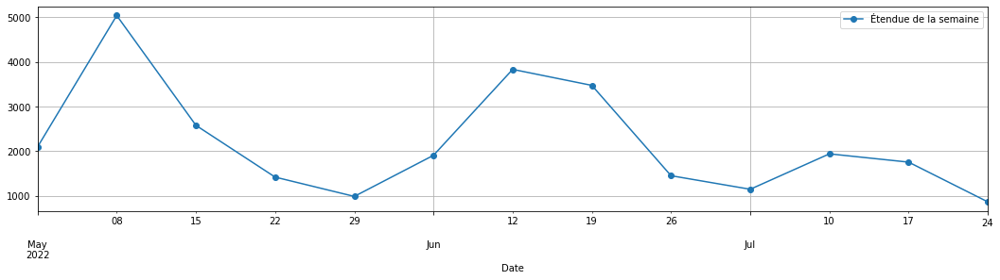

In [16]:
m = last_hist['Close'].resample(temporality).agg(['mean', 'std', 'min', 'max'])

diff = (m['max']-m['min'])

plt.figure(figsize=(18,4))
diff.plot(label='Étendue de la semaine',marker='o')
plt.grid()
plt.legend()
plt.show()


In [17]:
last_hist.loc['2022-06-20']

Open            1.959353e+04
High            1.986745e+04
Low             1.876299e+04
Close           1.958145e+04
Volume          2.929532e+10
Dividends       0.000000e+00
Stock Splits    0.000000e+00
Name: 2022-06-20 00:00:00, dtype: float64

In [18]:
last_hist['Close'].describe()

count       91.000000
mean     25714.116393
std       5761.440129
min      18118.945312
25%      20272.748047
50%      26958.935547
75%      28685.927734
max      37866.671875
Name: Close, dtype: float64

In [19]:
histo = last_hist.copy()

In [20]:
histo.reset_index(inplace=True)

In [21]:
histo['week']=histo['Date'].apply(lambda x : ((x.week)-15)+1)

In [22]:
histo.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits,week
0,2022-04-25,36516.425781,37814.761719,35703.957031,37765.523438,33086569081,0,0,3
1,2022-04-26,37756.296875,38091.425781,35609.539062,35814.597656,32480596939,0,0,3
2,2022-04-27,35817.265625,37346.585938,35713.902344,37180.769531,29354356982,0,0,3
3,2022-04-28,37181.058594,38350.785156,37042.054688,37866.671875,32278022256,0,0,3
4,2022-04-29,37861.710938,37881.097656,36255.777344,36618.867188,29290482147,0,0,3


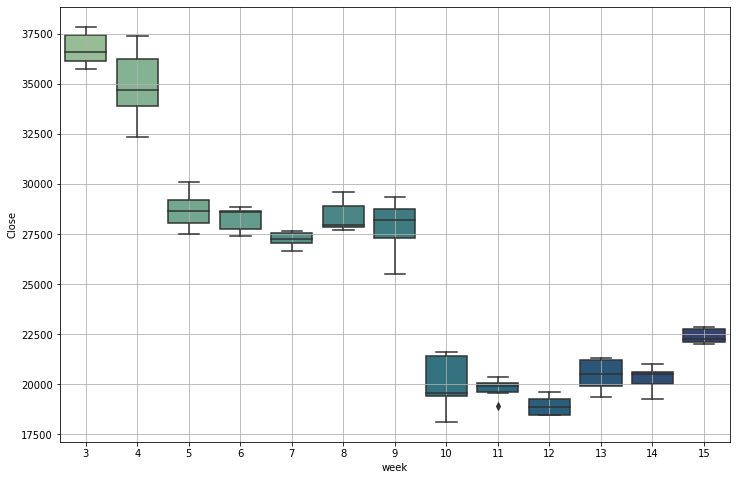

In [23]:
plt.figure(figsize=(12,8))
sns.boxplot(data=histo,x='week',y='Close',palette='crest')
plt.grid()

### Bande de bollinger <a class="anchor" id="section_2_1"></a>

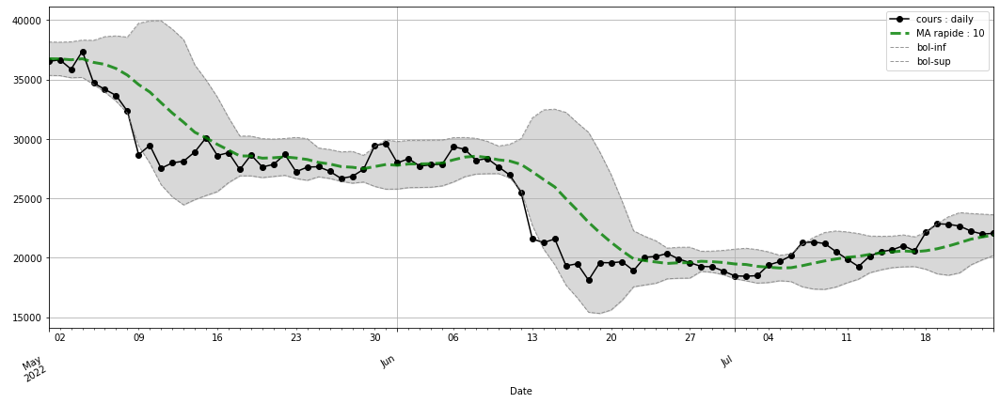

In [24]:
cours = hist.copy()

k1 = 10

start = '2022-05'

cours.loc[:,f"MA{k1}"] = cours['Close'].rolling(window=k1).mean()

cours.loc[:,f"MA{k1}-bol-inf"] = cours['Close'].rolling(window=k1).mean()-2*cours['Close'].rolling(window=k1).std()

cours.loc[:,f"MA{k1}-bol-sup"] = cours['Close'].rolling(window=k1).mean()+2*cours['Close'].rolling(window=k1).std()

plt.figure(figsize=(18,7))

cours.loc[start:, 'Close'].plot(color='black',marker='o',label = 'cours : daily')
cours.loc[start:,f"MA{k1}"].plot(label=f'MA rapide : {k1}', lw=3, ls='--', alpha=0.8, color='green')
cours.loc[start:,f"MA{k1}-bol-inf"].plot( lw=1, ls='--', alpha=0.8,color='gray',label='bol-inf')
cours.loc[start:,f"MA{k1}-bol-sup"].plot( lw=1, ls='--', alpha=0.8,color='gray',label='bol-sup')

plt.fill_between(cours[start:].index,cours.loc[start:,f"MA{k1}-bol-inf"],cours.loc[start:,f"MA{k1}-bol-sup"],color='gray',alpha=0.3)

plt.gcf().autofmt_xdate()
plt.grid()
plt.legend()
plt.show()

### Moving average fast and slow (cross point) <a class="anchor" id="section_2_2"></a>

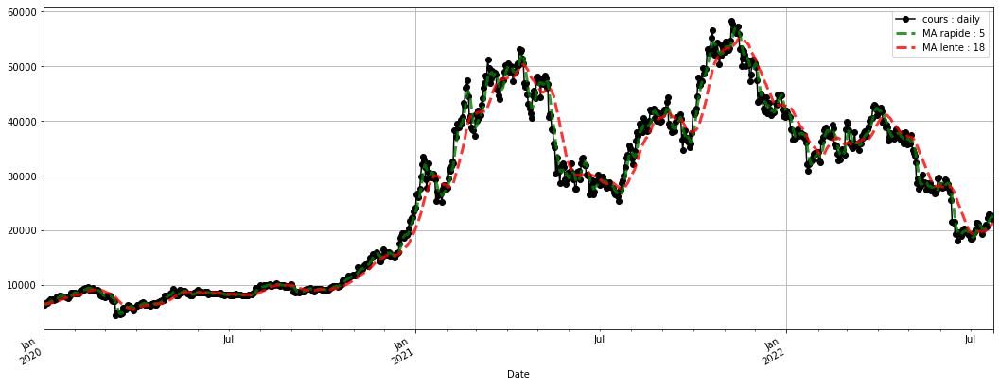

In [25]:
cours = hist.copy()

k1 = 5

k2 = 18

start = '2020'

cours.loc[:,f"MA{k1}"] = cours['Close'].rolling(window=k1).mean()

cours.loc[:,f"MA{k2}"] = cours['Close'].rolling(window=k2).mean()

plt.figure(figsize=(18,7))

cours.loc[start:, 'Close'].plot(color='black',marker='o',label = 'cours : daily')
cours.loc[start:,f"MA{k1}"].plot(label=f'MA rapide : {k1}', lw=3, ls='--', alpha=0.8, color='green')
cours.loc[start:, f"MA{k2}"].plot(label=f'MA lente : {k2}', lw=3, ls='--', alpha=0.8,color='red')

plt.gcf().autofmt_xdate()
plt.grid()
plt.legend()
plt.show()

In [27]:
cours.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,MA5,MA18
Date,,,,,,,,,
2014-09-17,359.546204,361.468506,351.586884,355.957367,16389166,0,0,NaN,NaN
2014-09-18,355.588409,355.505402,319.789459,328.539368,26691849,0,0,NaN,NaN
2014-09-19,328.278503,330.936707,298.921021,307.761139,29560103,0,0,NaN,NaN
2014-09-20,307.665253,329.978180,303.931244,318.758972,28736826,0,0,NaN,NaN
2014-09-21,318.120514,321.504517,306.502197,310.632446,20702625,0,0,324.329858,NaN


## Trading prediction using momentum strategy <a class="anchor" id="chapter3"></a>

### Règles de décision <a class="anchor" id="section_3_1"></a>

On détermine la nature de l'écart entre MAR et MAL 

**Suivre le comportement de la rapide (MAR)**

Si MAR < MAL à J-1 et intersection à J ou inverse  alors Achat 

Si MAR > MAL à J-1 et intersection à J ou inverse  alors Vente

**Hypothèse :** je fais durer mon ordre aussi longtemps que ma window rapide 

In [29]:
import numpy as np 

ma_btc = cours.copy()

ecart = ma_btc["MA5"]-ma_btc["MA18"]

sign = lambda x: (x > 0) - (x < 0)

### Traduction 

**"ecart négatif"-> MAL > MAR** / sign = -1

**"ecart positif"-> MAL < MAR** / sign = 1 

**"ecart null" -> MAL = MAR**  /  sign = 0




In [30]:
norm_delta = lambda x: np.abs(x[8]-x[7])/x[8]

In [31]:
ma_btc.apply(norm_delta,axis=1)

Date
2014-09-17         NaN
2014-09-18         NaN
2014-09-19         NaN
2014-09-20         NaN
2014-09-21         NaN
2014-09-22         NaN
2014-09-23         NaN
2014-09-24         NaN
2014-09-25         NaN
2014-09-26         NaN
2014-09-27         NaN
2014-09-28         NaN
2014-09-29         NaN
2014-09-30         NaN
2014-10-01         NaN
2014-10-02         NaN
2014-10-03         NaN
2014-10-04    0.065636
2014-10-05    0.081542
2014-10-06    0.098511
2014-10-07    0.111816
2014-10-08    0.111774
2014-10-09    0.091140
2014-10-10    0.066116
2014-10-11    0.039128
2014-10-12    0.009875
2014-10-13    0.013770
2014-10-14    0.034435
2014-10-15    0.050774
2014-10-16    0.058729
2014-10-17    0.058636
2014-10-18    0.058491
2014-10-19    0.050208
2014-10-20    0.043550
2014-10-21    0.043800
2014-10-22    0.037374
2014-10-23    0.016089
2014-10-24    0.003491
2014-10-25    0.022071
2014-10-26    0.038914
2014-10-27    0.054195
2014-10-28    0.054951
2014-10-29    0.062811
2014-1

In [32]:
# En tirant l'ancienne serie vers le bas à J on obtient la valeur de J+1 
ecart['2021-07-28':].shift(-1)[:3]

Date
2021-07-28    3769.854427
2021-07-29    4458.037174
2021-07-30    4741.884093
dtype: float64

In [33]:
# Si on tire vers le haut on obtient à J la valeur de J-1 
ecart['2021-07-28':].shift(1)[:3]

Date
2021-07-28            NaN
2021-07-29    3134.477821
2021-07-30    3769.854427
dtype: float64

In [34]:
# État initale 
ecart['2021-07-28':][:3]

Date
2021-07-28    3134.477821
2021-07-29    3769.854427
2021-07-30    4458.037174
dtype: float64

In [35]:
ma_btc.loc[:,"signe_ecart_J"] = ecart.apply(sign)

In [36]:
ma_btc.loc[:,"signe_ecart_J1"] = ecart.shift(-1).apply(sign)

In [37]:
ma_btc.loc[:,"signe_ecart_J_1"] = ecart.shift(1).apply(sign)

In [38]:
ma_btc.head()

,Open,High,Low,Close,Volume,Dividends,Stock Splits,MA5,MA18,signe_ecart_J,signe_ecart_J1,signe_ecart_J_1
Date,,,,,,,,,,,,
2014-09-17,359.546204,361.468506,351.586884,355.957367,16389166,0,0,NaN,NaN,0,0,0
2014-09-18,355.588409,355.505402,319.789459,328.539368,26691849,0,0,NaN,NaN,0,0,0
2014-09-19,328.278503,330.936707,298.921021,307.761139,29560103,0,0,NaN,NaN,0,0,0
2014-09-20,307.665253,329.978180,303.931244,318.758972,28736826,0,0,NaN,NaN,0,0,0
2014-09-21,318.120514,321.504517,306.502197,310.632446,20702625,0,0,324.329858,NaN,0,0,0


### Traduction 

**"ecart négatif"-> MAL > MAR** / sign = -1

**"ecart positif"-> MAL < MAR** / sign = 1 

**"ecart null" -> MAL = MAR**  /  sign = 0


In [39]:
ma_btc.loc[:,"Achat"]= np.where(np.logical_and(ma_btc["signe_ecart_J"] == 1, ma_btc["signe_ecart_J_1"] == -1),1,0)

ma_btc.loc[:,"Vendre"]= np.where(np.logical_and(ma_btc["signe_ecart_J"] == -1, ma_btc["signe_ecart_J_1"] == 1),-1,0)

In [40]:
#df_return = ma_btc[np.logical_or(ma_btc.loc[:,"Achat"]!=0,ma_btc.loc[:,"Vendre"]!=0)]['2022']

In [41]:
achat = ma_btc[ma_btc["Achat"]!=0][['Achat','Open','High','Low','Close']].reset_index()

In [42]:
achat

,Date,Achat,Open,High,Low,Close
0,2014-10-13,1,299.011780,311.916779,290.882355,306.929260
1,2014-11-09,1,277.365906,291.717621,276.465637,291.544159
2,2014-12-01,1,304.180939,308.236511,302.739929,304.174683
3,2015-01-25,1,220.712051,228.991837,217.642334,227.713165
4,2015-02-14,1,206.912064,228.242126,206.912064,226.057297
5,2015-04-06,1,237.148453,238.453415,231.853363,233.688843
6,2015-04-25,1,212.571243,213.790222,208.068588,208.117294
7,2015-05-04,1,214.852951,217.300735,213.263382,214.423615
8,2015-05-22,1,211.867294,219.022903,210.646118,218.200638
9,2015-06-15,1,207.985382,211.015884,207.948334,210.079834


In [43]:
vente = ma_btc[ma_btc["Vendre"]!=0][['Vendre','Open','High','Low','Close']]

Liens utile pour les dates : 

https://www.naukri.com/learning/articles/working-with-date-and-time-in-pandas/#s1

In [44]:
# Filter les dates intéressantes (on peut pas vendre ce qu'on a pas acheter)

reset_vente = vente.reset_index()

reset_vente = reset_vente[reset_vente['Date']>achat['Date'][0]].reset_index()

reset_vente.drop('index',axis=1,inplace =True)

In [45]:
reset_vente

,Date,Vendre,Open,High,Low,Close
0,2014-10-24,-1,283.493561,287.270355,279.204193,282.829529
1,2014-11-21,-1,285.344452,285.253479,274.367737,283.216003
2,2014-12-09,-1,293.889069,295.056458,278.208710,284.345673
3,2015-02-02,-1,200.310425,213.539368,196.938797,210.115540
4,2015-03-19,-1,235.899338,248.536484,229.157608,244.635300
5,2015-04-11,-1,222.614609,225.935669,220.878143,223.120163
6,2015-04-26,-1,208.135696,208.626587,197.530792,201.960419
7,2015-05-16,-1,207.531219,207.577515,205.479874,206.229156
8,2015-06-01,-1,210.143295,212.405350,202.633469,204.125992
9,2015-07-22,-1,252.086884,255.113922,251.080719,253.796555


In [46]:
res = achat.join(reset_vente,lsuffix = '_achat',rsuffix='_vente')

In [47]:
res

,Date_achat,Achat,Open_achat,High_achat,Low_achat,Close_achat,Date_vente,Vendre,Open_vente,High_vente,Low_vente,Close_vente
0,2014-10-13,1,299.011780,311.916779,290.882355,306.929260,2014-10-24,-1.0,283.493561,287.270355,279.204193,282.829529
1,2014-11-09,1,277.365906,291.717621,276.465637,291.544159,2014-11-21,-1.0,285.344452,285.253479,274.367737,283.216003
2,2014-12-01,1,304.180939,308.236511,302.739929,304.174683,2014-12-09,-1.0,293.889069,295.056458,278.208710,284.345673
3,2015-01-25,1,220.712051,228.991837,217.642334,227.713165,2015-02-02,-1.0,200.310425,213.539368,196.938797,210.115540
4,2015-02-14,1,206.912064,228.242126,206.912064,226.057297,2015-03-19,-1.0,235.899338,248.536484,229.157608,244.635300
5,2015-04-06,1,237.148453,238.453415,231.853363,233.688843,2015-04-11,-1.0,222.614609,225.935669,220.878143,223.120163
6,2015-04-25,1,212.571243,213.790222,208.068588,208.117294,2015-04-26,-1.0,208.135696,208.626587,197.530792,201.960419
7,2015-05-04,1,214.852951,217.300735,213.263382,214.423615,2015-05-16,-1.0,207.531219,207.577515,205.479874,206.229156
8,2015-05-22,1,211.867294,219.022903,210.646118,218.200638,2015-06-01,-1.0,210.143295,212.405350,202.633469,204.125992
9,2015-06-15,1,207.985382,211.015884,207.948334,210.079834,2015-07-22,-1.0,252.086884,255.113922,251.080719,253.796555


## Close explication 
> **"Closing price"** generally refers to the last price at which a stock trades during a regular trading session. For many U.S. markets, regular trading sessions run from 9:30 a.m. to 4:00 p.m. Eastern Time.

In [48]:
res['rendement']=res['Close_vente']-res['Close_achat']

## Rendement de la stratégie

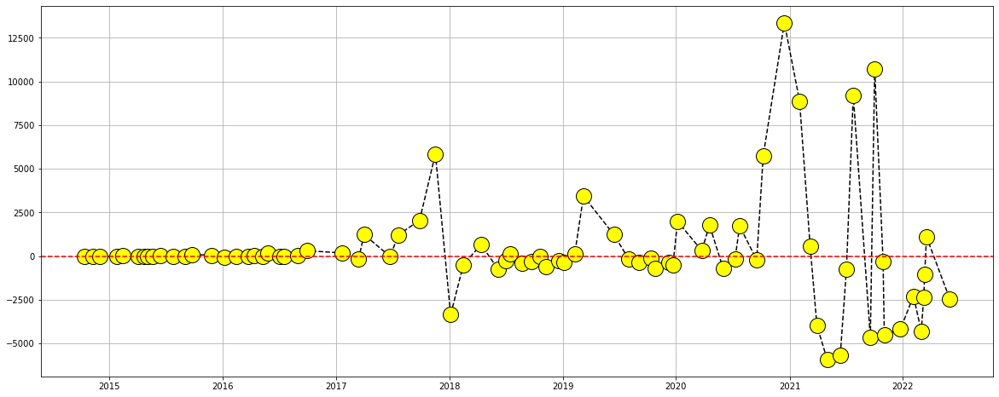

In [49]:
plt.figure(figsize = (20,8))
plt.plot(res['Date_achat'],res['rendement'],marker='o',color='black',linestyle='--',markerfacecolor='yellow',markersize=18)
plt.axhline(y=0,color='red',linestyle='--')

plt.grid()

In [50]:
np.sum(res['rendement'])

19441.389129638672

In [51]:
res['rendement'].describe()

count       79.000000
mean       246.093533
std       3096.498433
min      -5921.875000
25%       -386.506714
50%        -14.074646
75%        179.361969
max      13367.453125
Name: rendement, dtype: float64

### TOP 10 loosing order

In [52]:
res.sort_values(by='rendement')[['Date_achat','Date_vente','rendement']][:10]

,Date_achat,Date_vente,rendement
64,2021-05-02,2021-05-13,-5921.875000
65,2021-06-13,2021-06-21,-5695.441406
68,2021-09-18,2021-09-20,-4637.921875
71,2021-11-02,2021-11-18,-4517.242188
74,2022-03-01,2022-03-08,-4296.941406
72,2021-12-24,2021-12-31,-4173.292969
63,2021-03-30,2021-04-19,-3980.253906
31,2018-01-05,2018-01-11,-3357.310547
78,2022-06-01,2022-06-12,-2465.712891
75,2022-03-09,2022-03-11,-2366.882812


### TOP 10 Winning order

In [53]:
res.sort_values(by='rendement',ascending=False)[['Date_achat','Date_vente','rendement']][:10]

,Date_achat,Date_vente,rendement
60,2020-12-15,2021-01-20,13367.453125
69,2021-10-02,2021-10-28,10740.242188
67,2021-07-25,2021-09-09,9206.707031
61,2021-02-02,2021-02-26,8884.388672
30,2017-11-17,2017-12-23,5860.145020
59,2020-10-08,2020-12-10,5764.372070
44,2019-03-09,2019-06-05,3440.515137
29,2017-09-27,2017-11-13,2048.845459
52,2020-01-06,2020-02-21,1990.757812
54,2020-04-18,2020-05-23,1774.785645


### Momentum Analysis for each period (make a boucle)

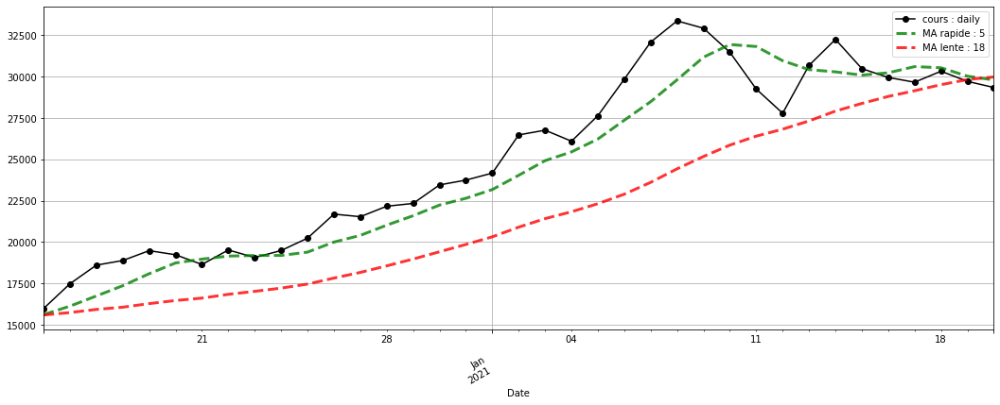

In [54]:
k1 = 5

k2 = 18


debut = '2020-12-15'

fin = '2021-01-20'

ma_btc.loc[:,f"MA{k1}"] = ma_btc['Close'].rolling(window=k1).mean()

ma_btc.loc[:,f"MA{k2}"] = ma_btc['Close'].rolling(window=k2).mean()

plt.figure(figsize=(18,7))

ma_btc.loc[debut:fin, 'Close'].plot(color='black',marker='o',label = 'cours : daily')
ma_btc.loc[debut:fin,f"MA{k1}"].plot(label=f'MA rapide : {k1}', lw=3, ls='--', alpha=0.8, color='green')
ma_btc.loc[debut:fin, f"MA{k2}"].plot(label=f'MA lente : {k2}', lw=3, ls='--', alpha=0.8,color='red')

plt.gcf().autofmt_xdate()
plt.grid()
plt.legend()
plt.show()

In [55]:
ma_btc

,Open,High,Low,Close,Volume,Dividends,Stock Splits,MA5,MA18,signe_ecart_J,signe_ecart_J1,signe_ecart_J_1,Achat,Vendre
Date,,,,,,,,,,,,,,
2014-09-17,359.546204,361.468506,351.586884,355.957367,16389166,0,0,NaN,NaN,0,0,0,0,0
2014-09-18,355.588409,355.505402,319.789459,328.539368,26691849,0,0,NaN,NaN,0,0,0,0,0
2014-09-19,328.278503,330.936707,298.921021,307.761139,29560103,0,0,NaN,NaN,0,0,0,0,0
2014-09-20,307.665253,329.978180,303.931244,318.758972,28736826,0,0,NaN,NaN,0,0,0,0,0
2014-09-21,318.120514,321.504517,306.502197,310.632446,20702625,0,0,324.329858,NaN,0,0,0,0,0
2014-09-22,310.849762,316.469116,309.170898,312.958771,18776342,0,0,315.730139,NaN,0,0,0,0,0
2014-09-23,312.912079,343.704376,307.343872,339.189758,35102351,0,0,317.860217,NaN,0,0,0,0,0
2014-09-24,339.158630,339.307556,327.882263,331.250000,23972840,0,0,322.557990,NaN,0,0,0,0,0
2014-09-25,331.211639,331.444672,321.226959,322.676605,21022658,0,0,323.341516,NaN,0,0,0,0,0


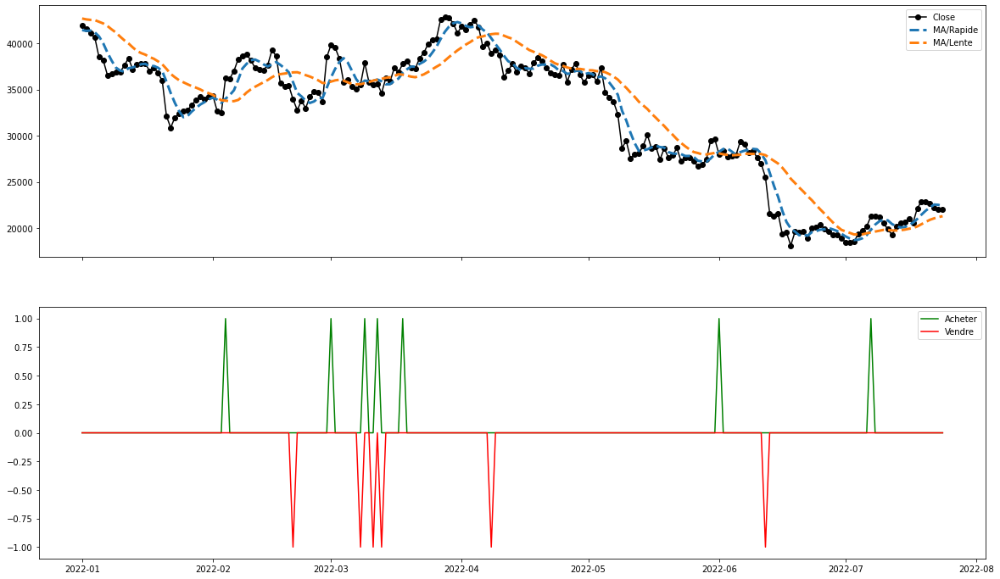

In [56]:
start ='2022'
end='2022'

fig, ax = plt.subplots(2, figsize=(20,12), sharex=True)
# plt.figure(figsize=(12, 8))
# plt.subplot(211)

data = ma_btc.copy()

ax[0].plot(data['Close'][start:end],marker='o',color='black')
ax[0].plot(data['MA5'][start:end],ls='--',lw=3)
ax[0].plot(data['MA18'][start:end],ls='--',lw=3)
ax[0].legend(['Close', 'MA/Rapide', 'MA/Lente'])

ax[1].plot(data['Achat'][start:end], c='g')
ax[1].plot(data['Vendre'][start:end], c='r')

ax[1].legend(['Acheter', 'Vendre'])

## Boucler sur des windows pour trouver les plus rentables

In [57]:
fast = [i for i in range(3,10,1)]

slow = list(np.array(fast)*5)

In [58]:
fast

[3, 4, 5, 6, 7, 8, 9]

In [59]:
slow

[15, 20, 25, 30, 35, 40, 45]

In [4]:
import numpy as np

In [7]:
def trade_profit(pair,period):
    fast = [i for i in range(3,10,1)]
    slow = list(np.array(fast)*5)
    
    # Store every buy sell price operation of windows 
    windows = {}
    # Store every MA data with buy sell operation
    history = {}

    for i in range(len(fast)) : 
        for j in range(len(slow)) : 
            f = fast[i]
            s = slow[j]

            # Calcul du DataFrame res pour la window (fast,slow)
            # On ajoute le resultat du df 
            cours = pair
            actif = yf.Ticker(cours)
            hist = actif.history(period=period,interval='1d')

            hist.loc[:,f"MA{f}"] = hist['Close'].rolling(window=f).mean()
            hist.loc[:,f"MA{s}"] = hist['Close'].rolling(window=s).mean()

            ecart = hist[f"MA{f}"]-hist[f"MA{s}"]
            sign = lambda x: (x > 0) - (x < 0)

            # On détermine les écart entre fast and slow moving average
            hist.loc[:,"signe_ecart_J"] = ecart.apply(sign)
            hist.loc[:,"signe_ecart_J1"] = ecart.shift(-1).apply(sign)
            hist.loc[:,"signe_ecart_J_1"] = ecart.shift(1).apply(sign)

            # On récupère achat et vente par rapport à notre règle de décision 
            hist.loc[:,"Achat"]= np.where(np.logical_and(hist["signe_ecart_J"] == 1, hist["signe_ecart_J_1"] == -1),1,0)
            hist.loc[:,"Vendre"]= np.where(np.logical_and(hist["signe_ecart_J"] == -1, hist["signe_ecart_J_1"] == 1),-1,0)

            achat = hist[hist["Achat"]!=0][['Achat','Open','High','Low','Close']].reset_index()

            vente = hist[hist["Vendre"]!=0][['Vendre','Open','High','Low','Close']].reset_index()

            # On garde les dates pertinentes (on peut pas vendre ce qu'on a pas acheté) 
            reset_vente = vente[vente['Date']>achat['Date'][0]].reset_index()
            reset_vente.drop('index',axis=1,inplace =True)

            # On joint les achats avec les ventes pour déterminer le rendement de chq mvt
            res = achat.join(reset_vente,lsuffix = '_achat',rsuffix='_vente')

            res['rendement'] = res['Close_vente']-res['Close_achat']
            res['rendement%']= (res['Close_vente']/res['Close_achat'])-1

            windows[f'[{str(f)},{str(s)}]']= res

            history[f'[{str(f)},{str(s)}]']= hist
        
    return windows,history 


In [8]:
windows, history = trade_profit('ETH-EUR','1y')

In [9]:
title =[]
values =[]
values2 = []
victory = []
defeat = []

for j in windows.keys():
    title.append(j)
    values.append(windows[j]['rendement'].sum())
    values2.append(windows[j]['rendement%'].sum())
    victory.append((windows[j]['rendement']>=0).sum())
    defeat.append((windows[j]['rendement']<0).sum())

In [12]:
window_opt = pd.DataFrame({'windows':title,
                           'rendement':values,
                           'rendement%':values2,
                           'victory': victory,
                           'defeat': defeat,
                           'p_prob': list(np.array(victory)/(np.array(defeat)+np.array(victory)))         
                })

In [13]:
# À  ne pas confondre avec windows opt 
window_opt

NameError: name 'windows_opt' is not defined

In [81]:
devise = ['SOL','ETH','BTC','SHIB']

On boucle le plot du rendement à partir

### Resultat globale rendement : 
    
- Puissance des victoires
- Proportion de victoire

In [113]:
window_opt = window_opt.sort_values(by='rendement',ascending=False).reset_index()

In [114]:
window_opt

,index,windows,rendement,rendement%,victory,defeat,p_prob
0,44,"[9,25]",1182.949219,-0.005813,2,3,0.400000
1,46,"[9,35]",1164.945312,0.005440,2,2,0.500000
2,3,"[3,30]",200.357422,-0.041848,2,6,0.250000
3,32,"[7,35]",-94.136719,-0.025767,1,3,0.250000
4,4,"[3,35]",-447.242188,-0.023029,2,4,0.333333
5,45,"[9,30]",-892.511719,-0.069297,1,4,0.200000
6,42,"[9,15]",-988.712891,-0.018405,4,8,0.333333
7,37,"[8,25]",-1126.515625,-0.066383,2,4,0.333333
8,31,"[7,30]",-1315.029297,-0.086702,1,4,0.200000
9,39,"[8,35]",-1607.093750,-0.068416,1,3,0.250000


### Visualize each strategy profit trade distribution

In [67]:
windows.keys()

dict_keys(['[3,15]', '[3,20]', '[3,25]', '[3,30]', '[3,35]', '[3,40]', '[3,45]', '[4,15]', '[4,20]', '[4,25]', '[4,30]', '[4,35]', '[4,40]', '[4,45]', '[5,15]', '[5,20]', '[5,25]', '[5,30]', '[5,35]', '[5,40]', '[5,45]', '[6,15]', '[6,20]', '[6,25]', '[6,30]', '[6,35]', '[6,40]', '[6,45]', '[7,15]', '[7,20]', '[7,25]', '[7,30]', '[7,35]', '[7,40]', '[7,45]', '[8,15]', '[8,20]', '[8,25]', '[8,30]', '[8,35]', '[8,40]', '[8,45]', '[9,15]', '[9,20]', '[9,25]', '[9,30]', '[9,35]', '[9,40]', '[9,45]'])

In [68]:
history.keys()

dict_keys(['[3,15]', '[3,20]', '[3,25]', '[3,30]', '[3,35]', '[3,40]', '[3,45]', '[4,15]', '[4,20]', '[4,25]', '[4,30]', '[4,35]', '[4,40]', '[4,45]', '[5,15]', '[5,20]', '[5,25]', '[5,30]', '[5,35]', '[5,40]', '[5,45]', '[6,15]', '[6,20]', '[6,25]', '[6,30]', '[6,35]', '[6,40]', '[6,45]', '[7,15]', '[7,20]', '[7,25]', '[7,30]', '[7,35]', '[7,40]', '[7,45]', '[8,15]', '[8,20]', '[8,25]', '[8,30]', '[8,35]', '[8,40]', '[8,45]', '[9,15]', '[9,20]', '[9,25]', '[9,30]', '[9,35]', '[9,40]', '[9,45]'])

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[3,15]
Durant la période avec une MA lente à 15 jours
    et une MA rapide à 3 jours on enregistre :
    


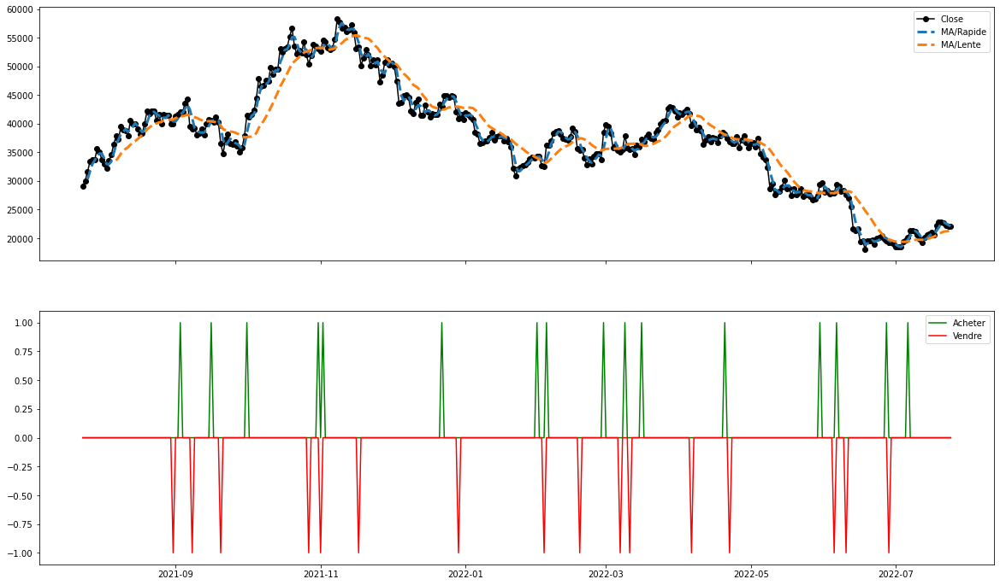

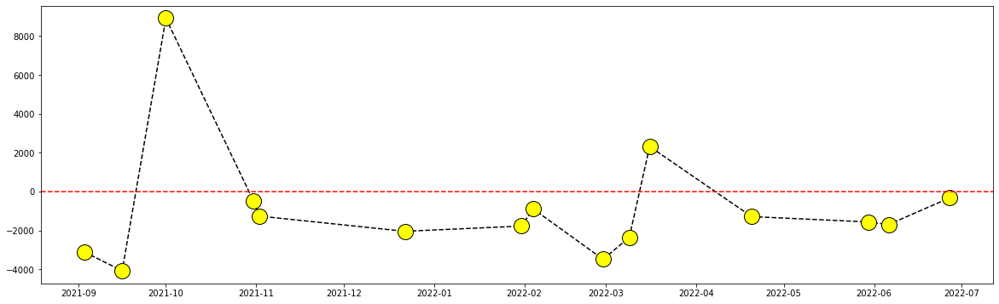

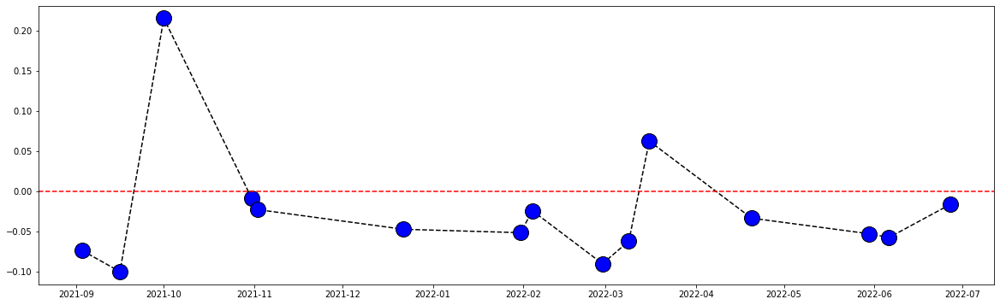

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[3,20]
Durant la période avec une MA lente à 20 jours
    et une MA rapide à 3 jours on enregistre :
    


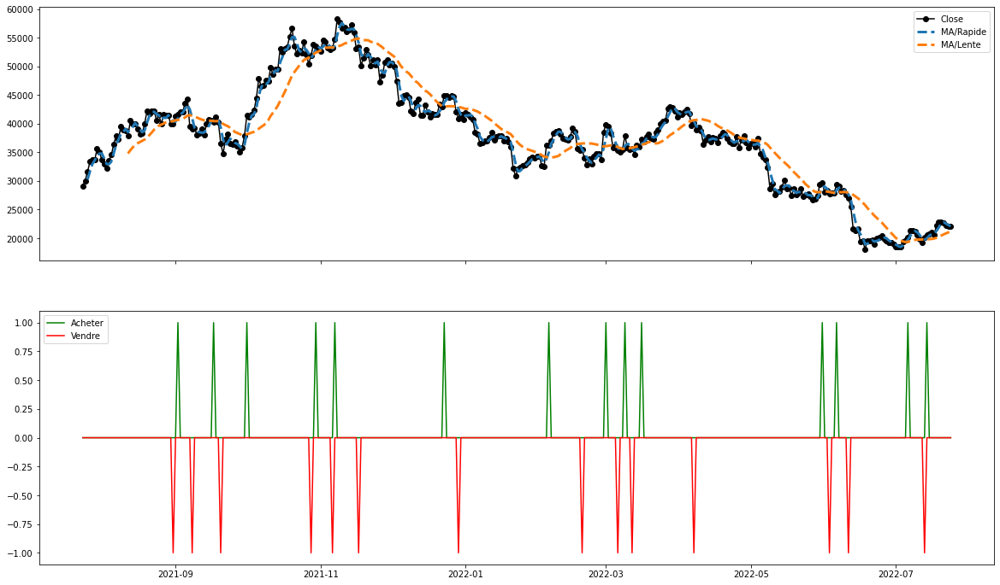

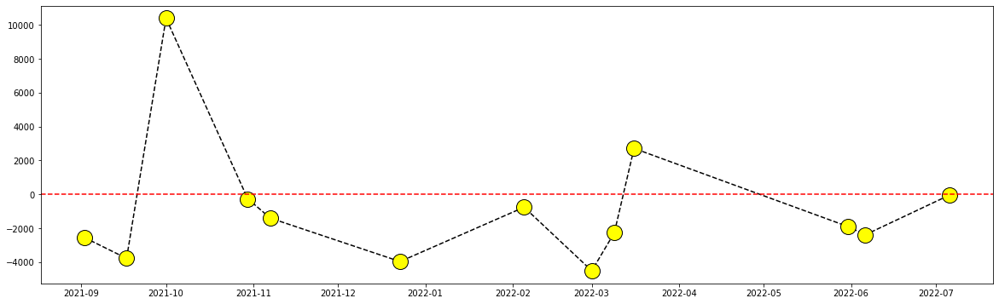

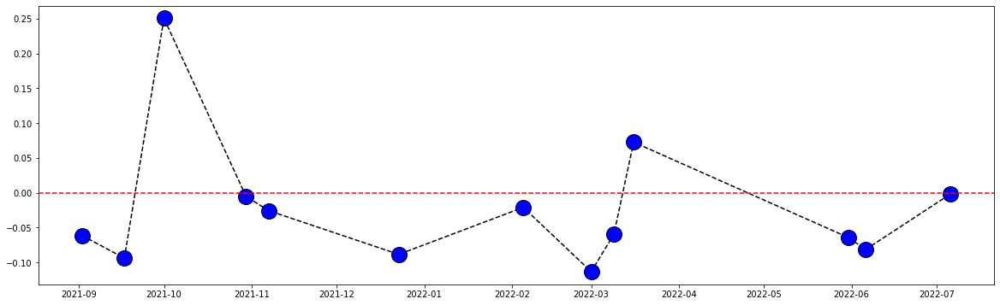

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[3,25]
Durant la période avec une MA lente à 25 jours
    et une MA rapide à 3 jours on enregistre :
    


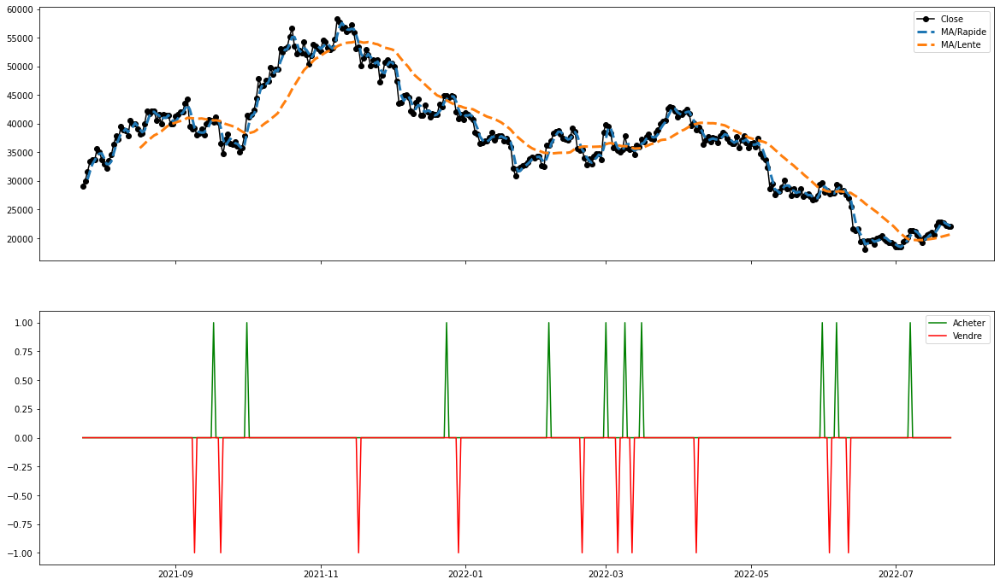

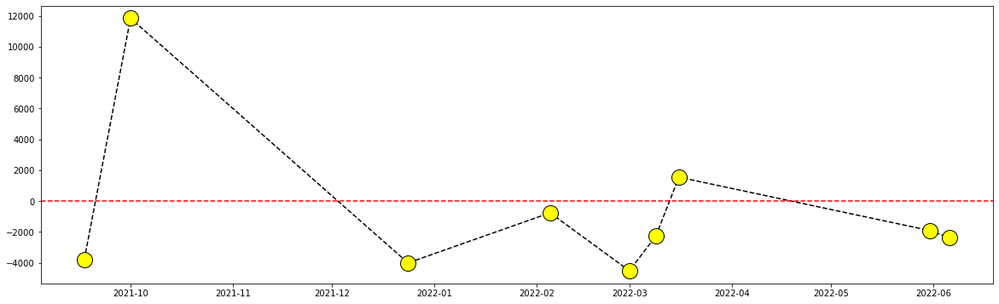

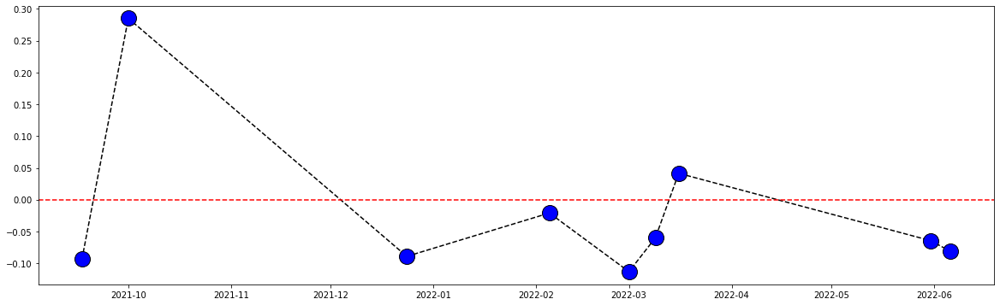

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[3,30]
Durant la période avec une MA lente à 30 jours
    et une MA rapide à 3 jours on enregistre :
    


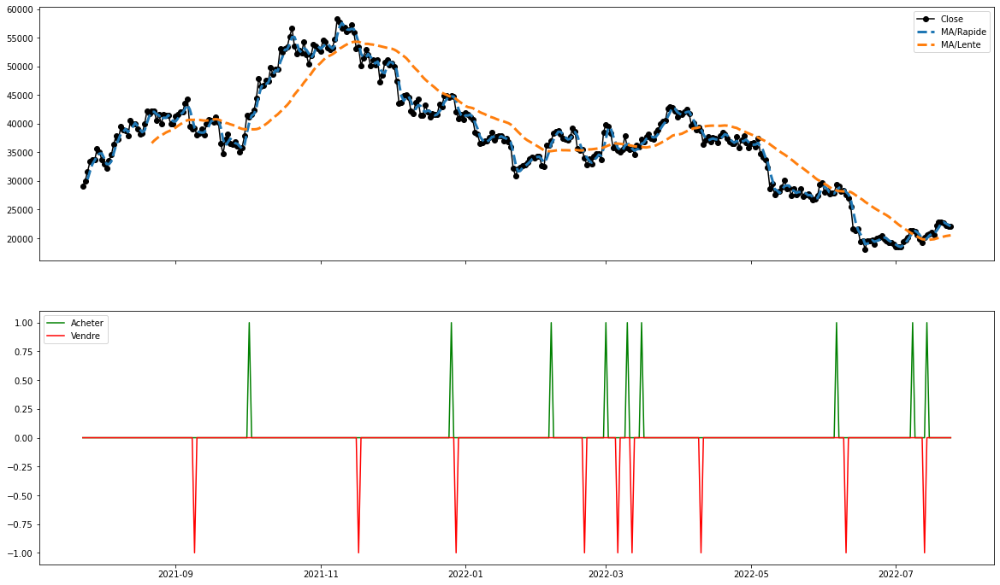

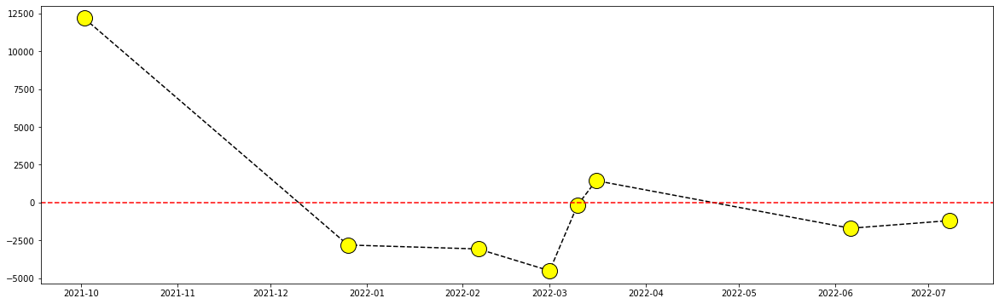

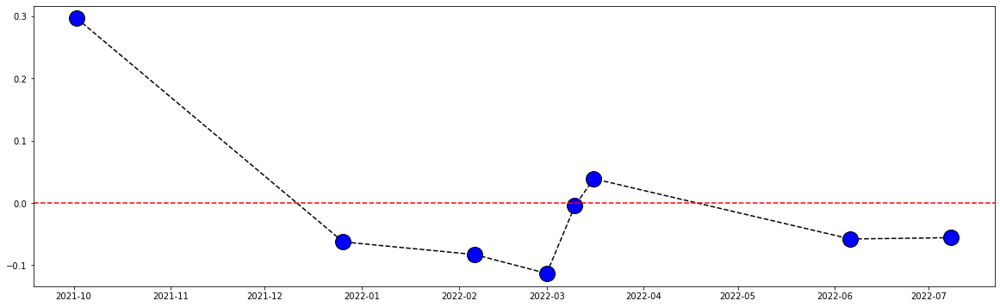

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[3,35]
Durant la période avec une MA lente à 35 jours
    et une MA rapide à 3 jours on enregistre :
    


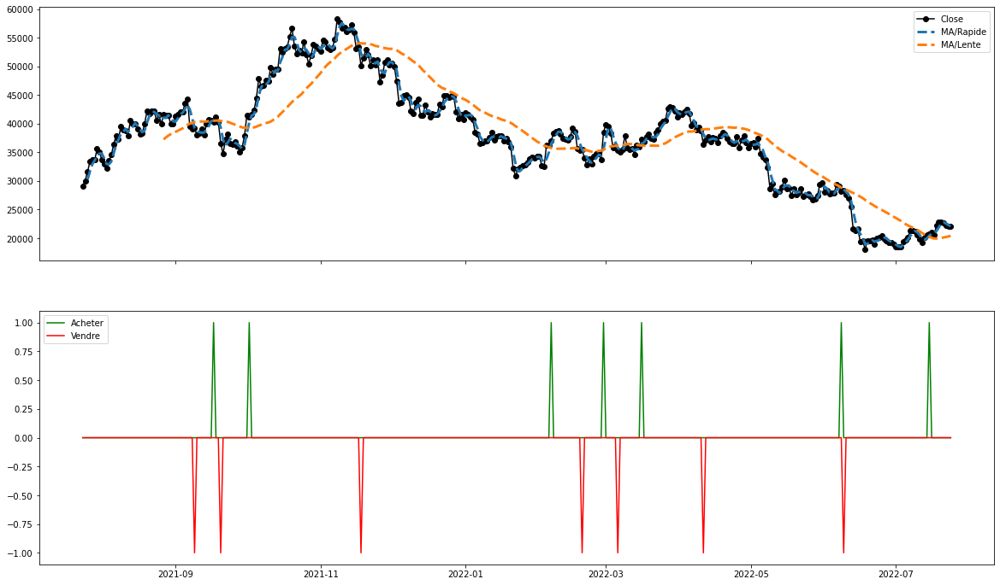

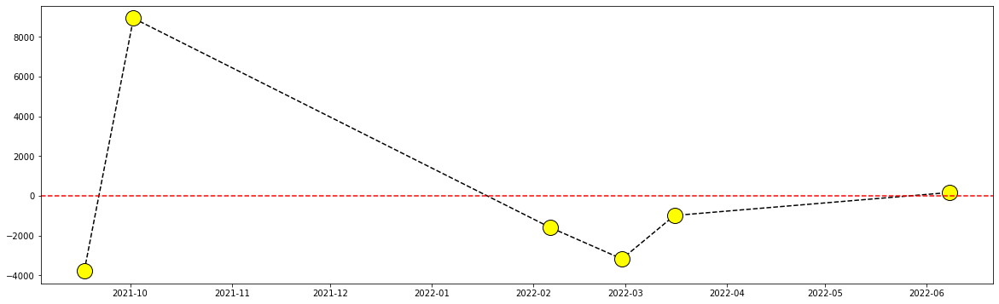

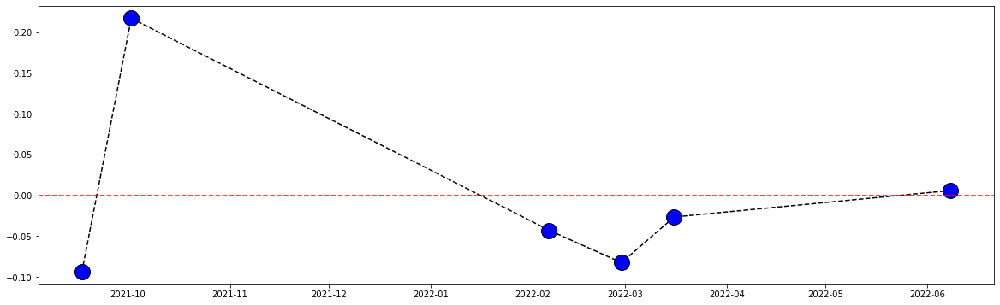

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[3,40]
Durant la période avec une MA lente à 40 jours
    et une MA rapide à 3 jours on enregistre :
    


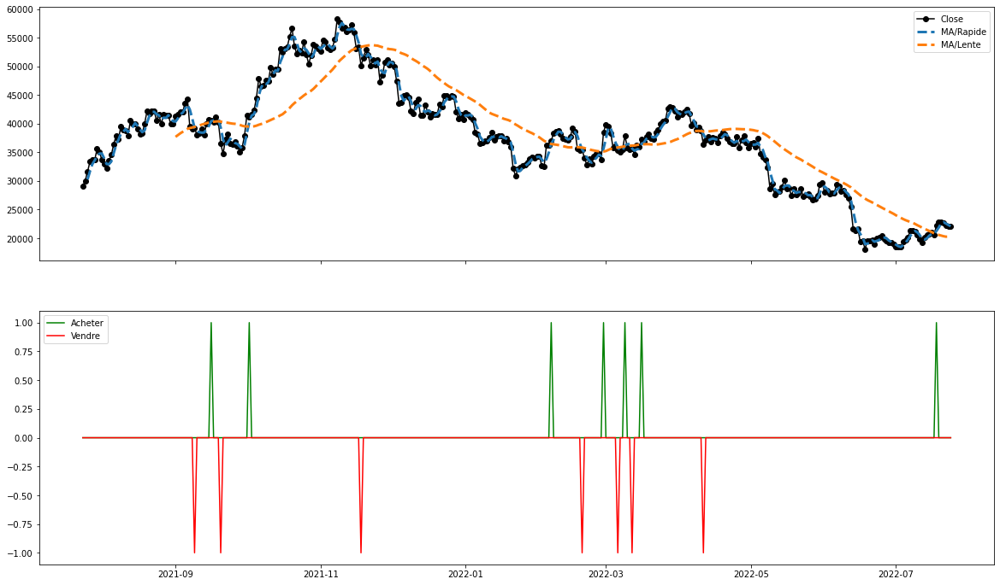

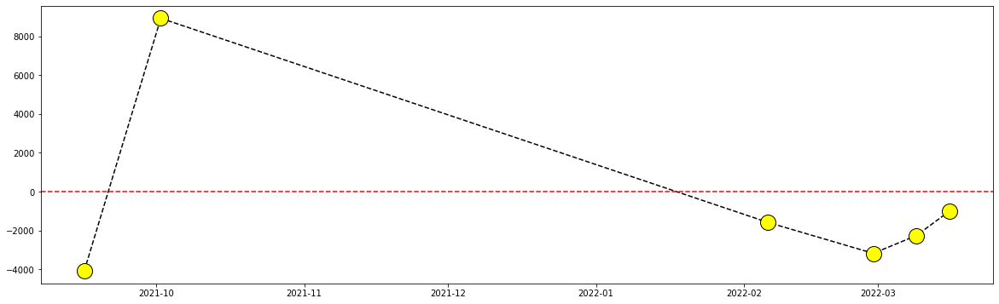

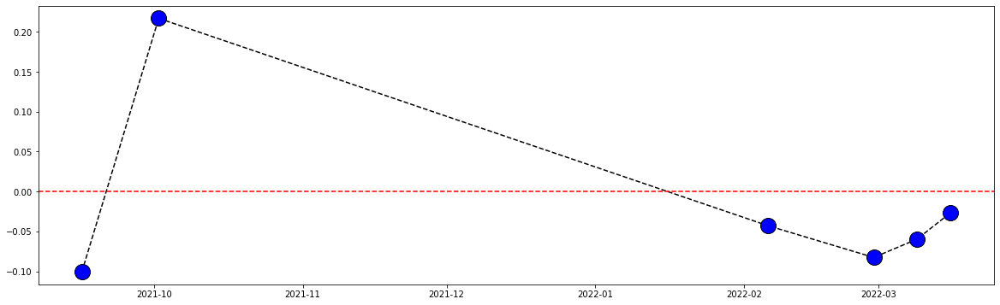

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[3,45]
Durant la période avec une MA lente à 45 jours
    et une MA rapide à 3 jours on enregistre :
    


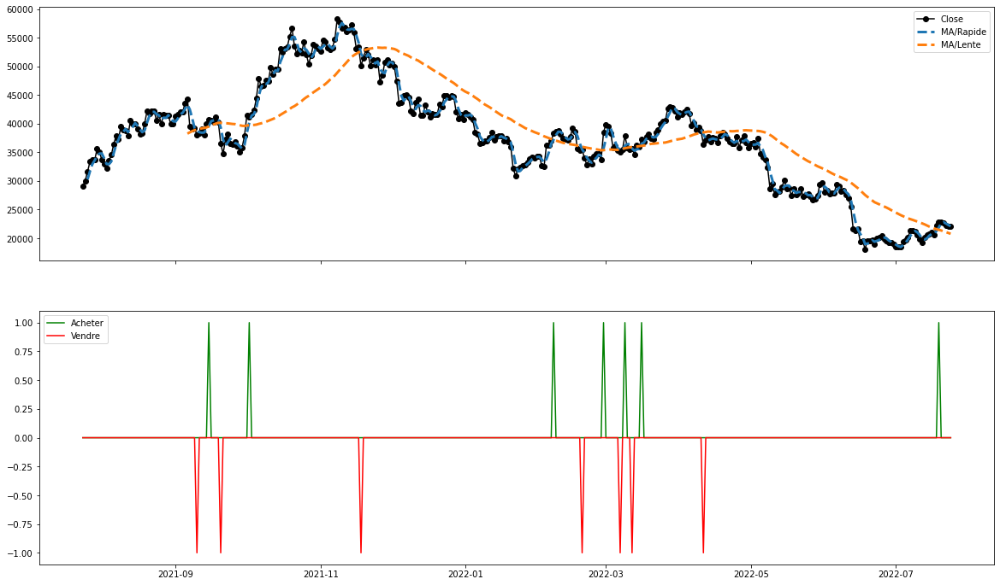

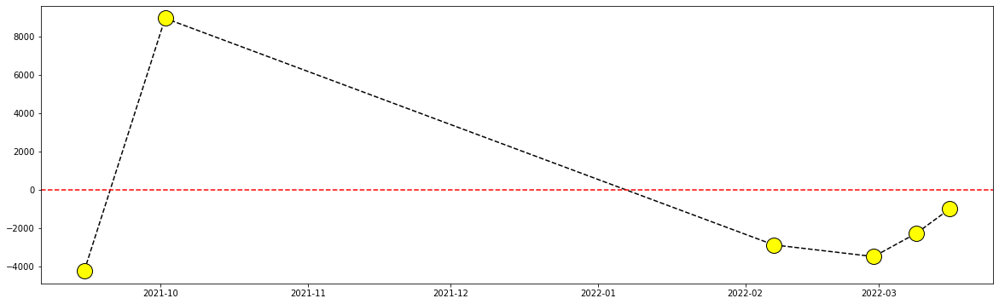

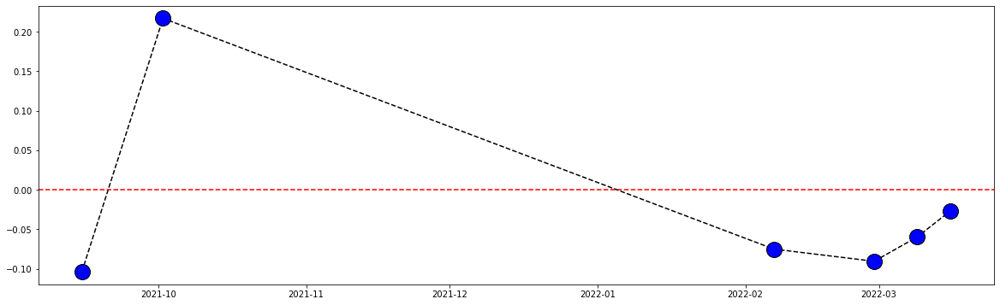

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[4,15]
Durant la période avec une MA lente à 15 jours
    et une MA rapide à 4 jours on enregistre :
    


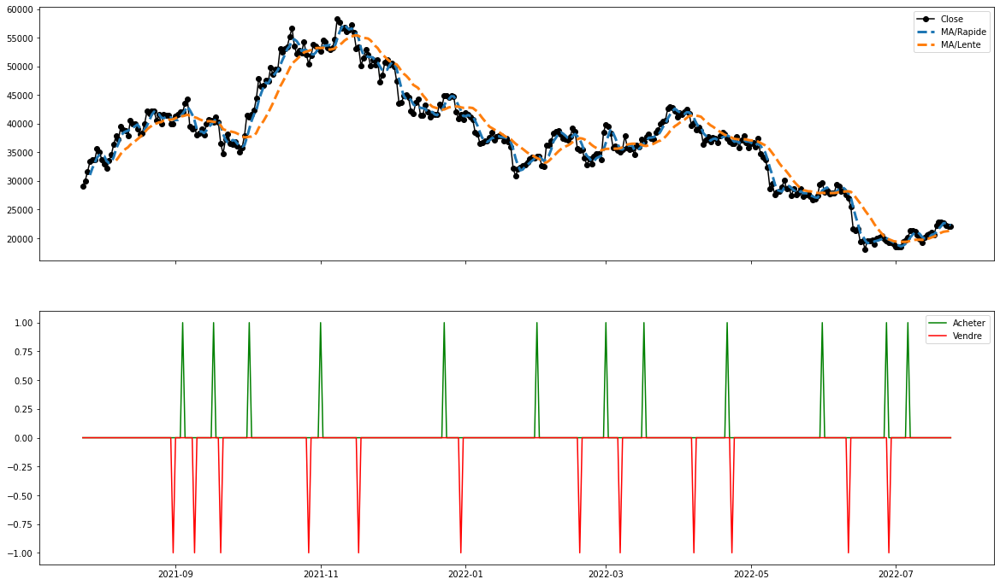

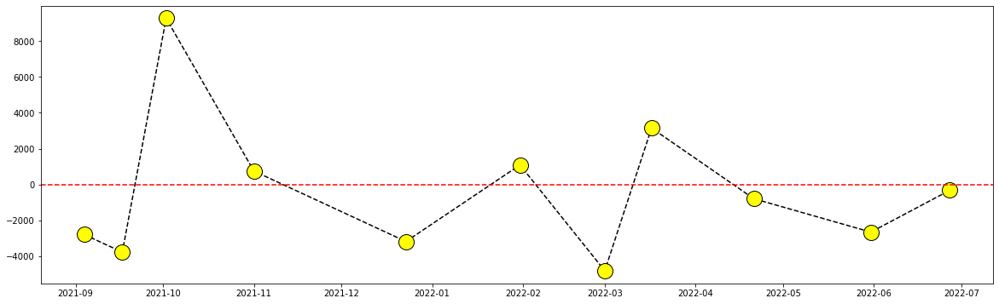

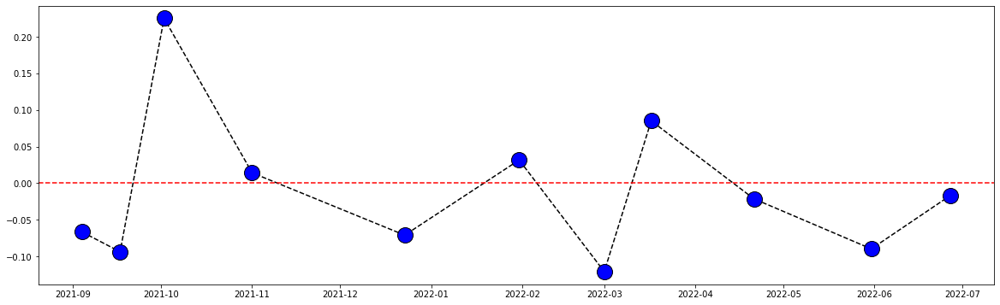

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[4,20]
Durant la période avec une MA lente à 20 jours
    et une MA rapide à 4 jours on enregistre :
    


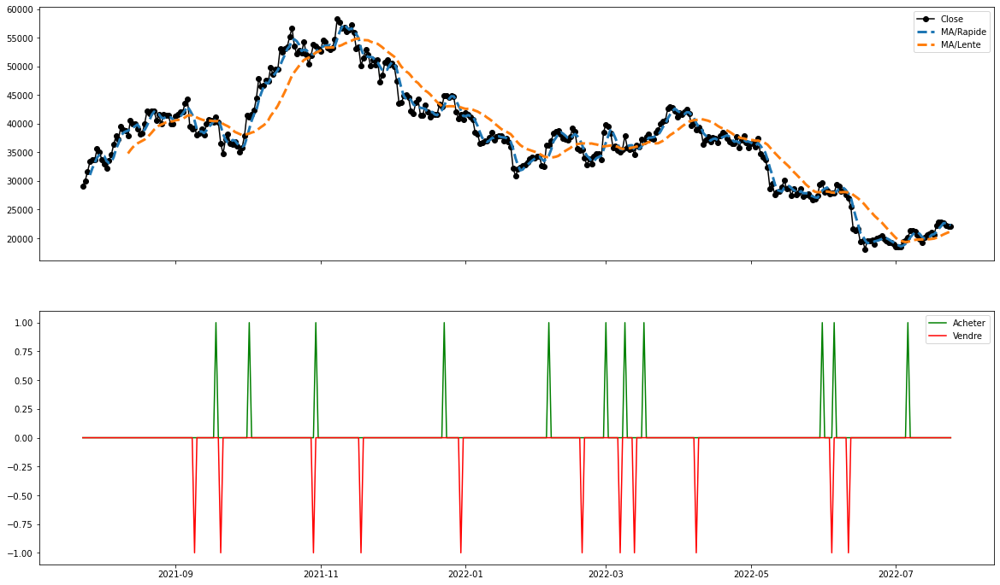

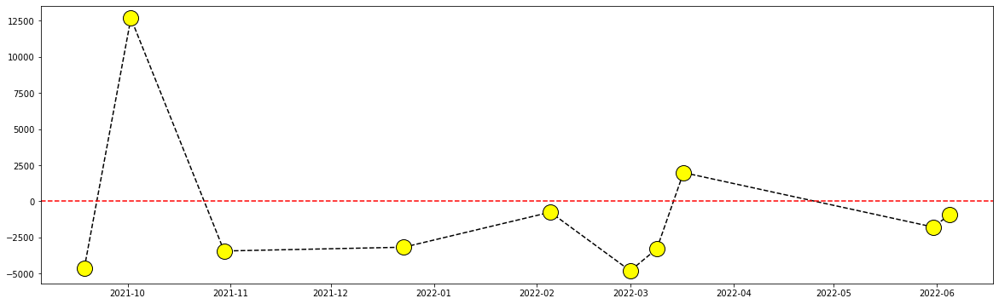

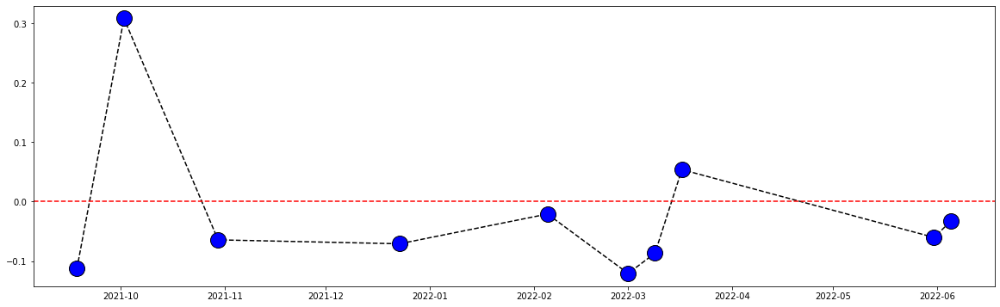

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[4,25]
Durant la période avec une MA lente à 25 jours
    et une MA rapide à 4 jours on enregistre :
    


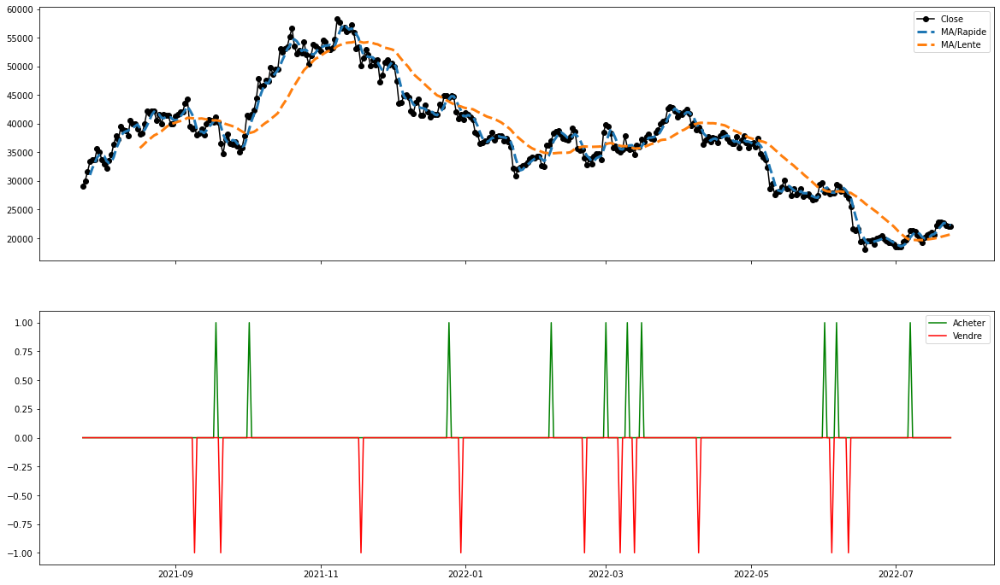

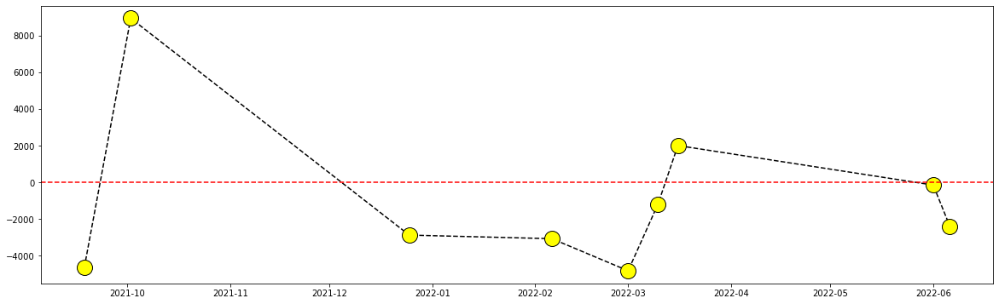

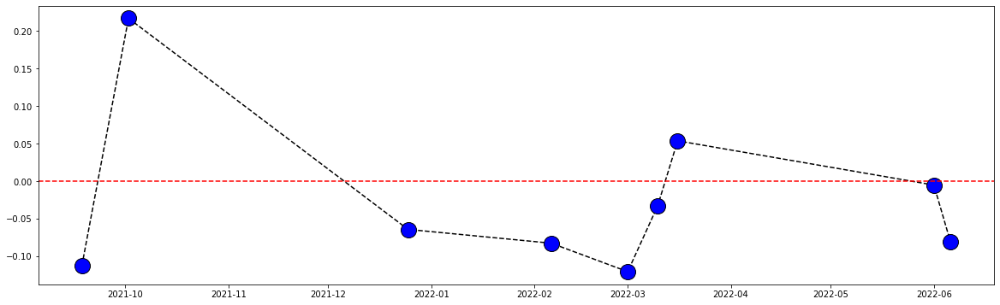

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[4,30]
Durant la période avec une MA lente à 30 jours
    et une MA rapide à 4 jours on enregistre :
    


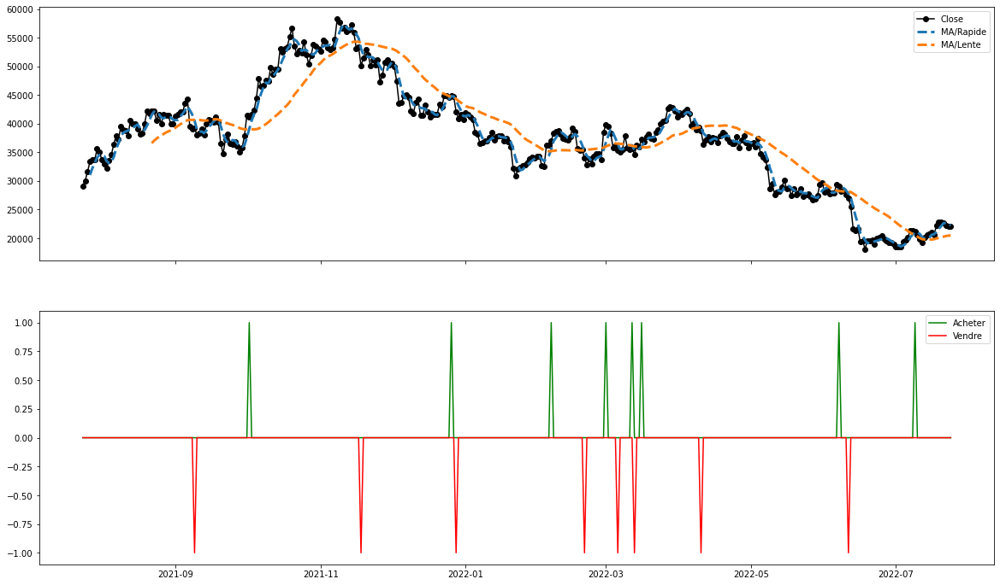

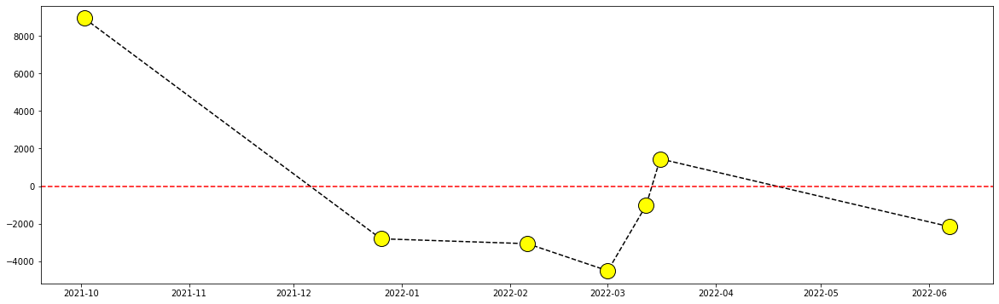

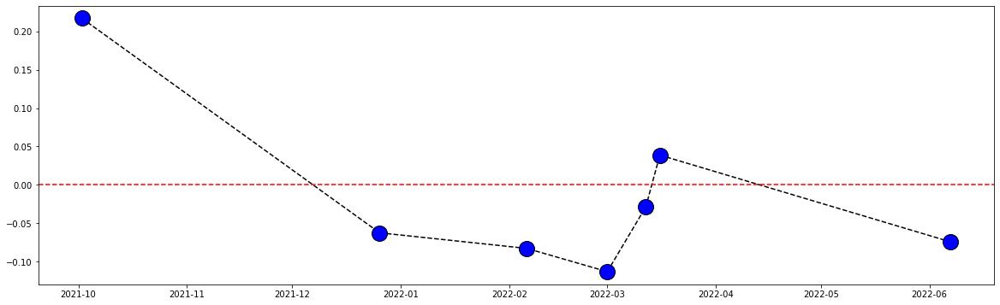

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[4,35]
Durant la période avec une MA lente à 35 jours
    et une MA rapide à 4 jours on enregistre :
    


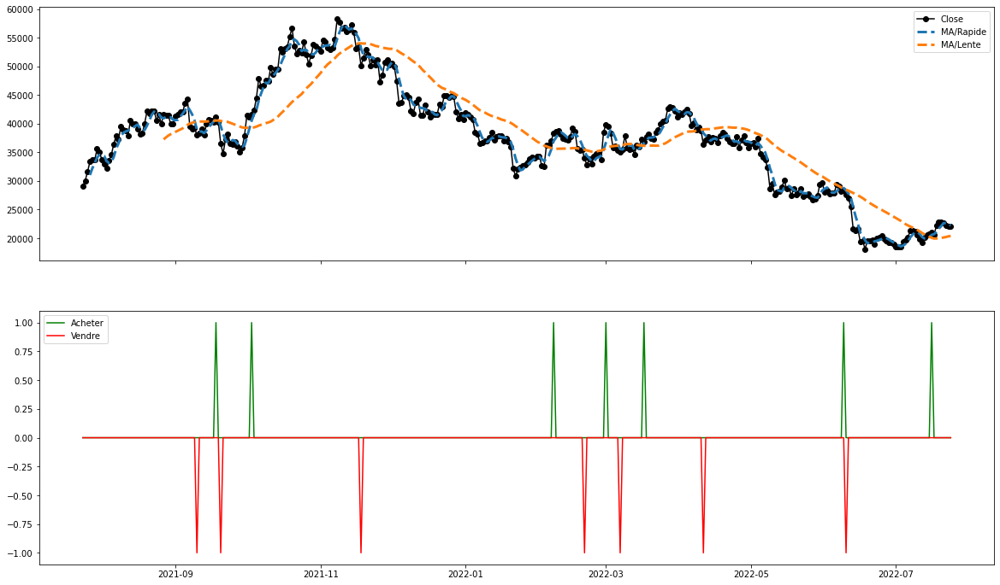

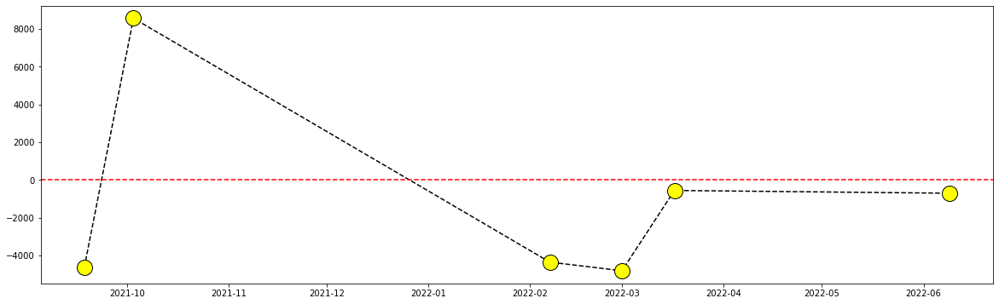

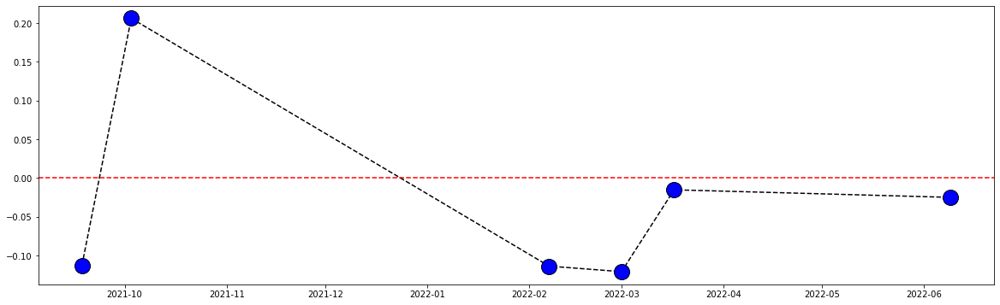

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[4,40]
Durant la période avec une MA lente à 40 jours
    et une MA rapide à 4 jours on enregistre :
    


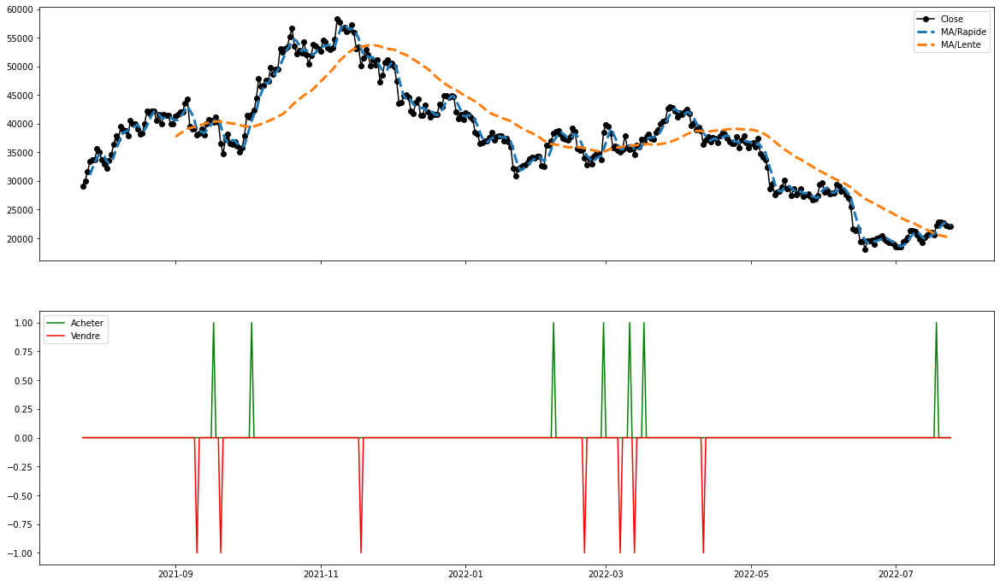

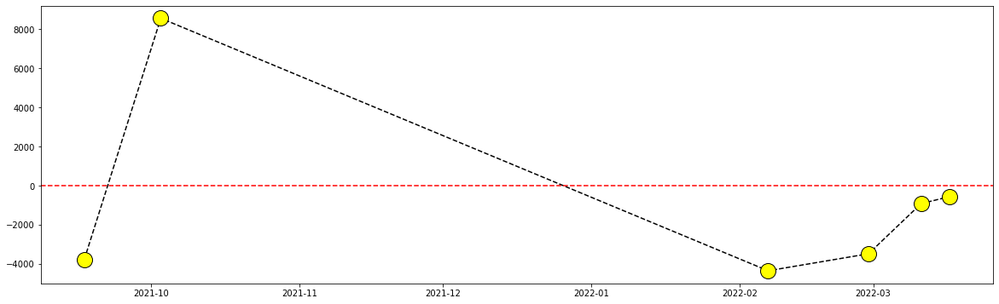

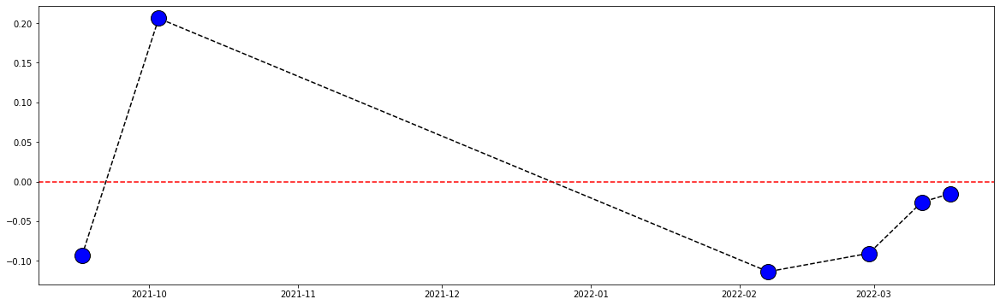

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[4,45]
Durant la période avec une MA lente à 45 jours
    et une MA rapide à 4 jours on enregistre :
    


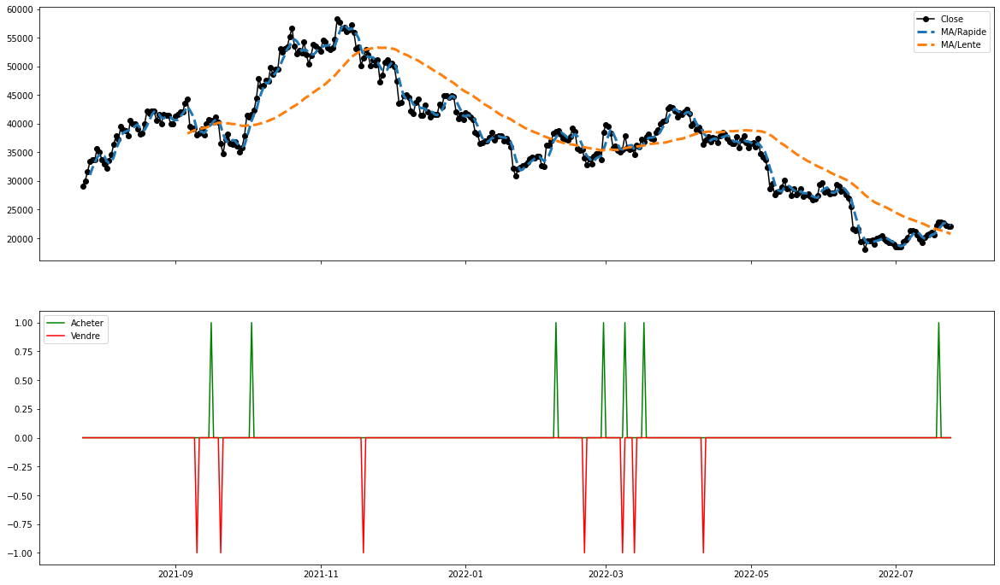

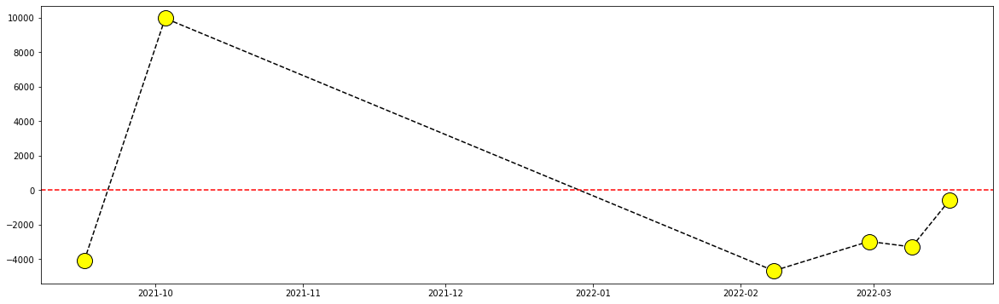

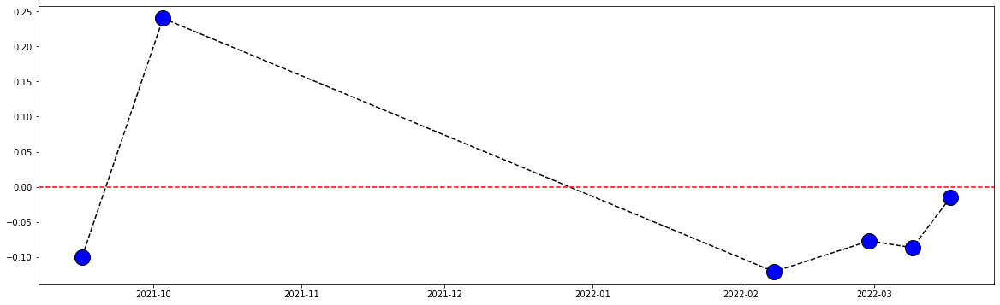

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[5,15]
Durant la période avec une MA lente à 15 jours
    et une MA rapide à 5 jours on enregistre :
    


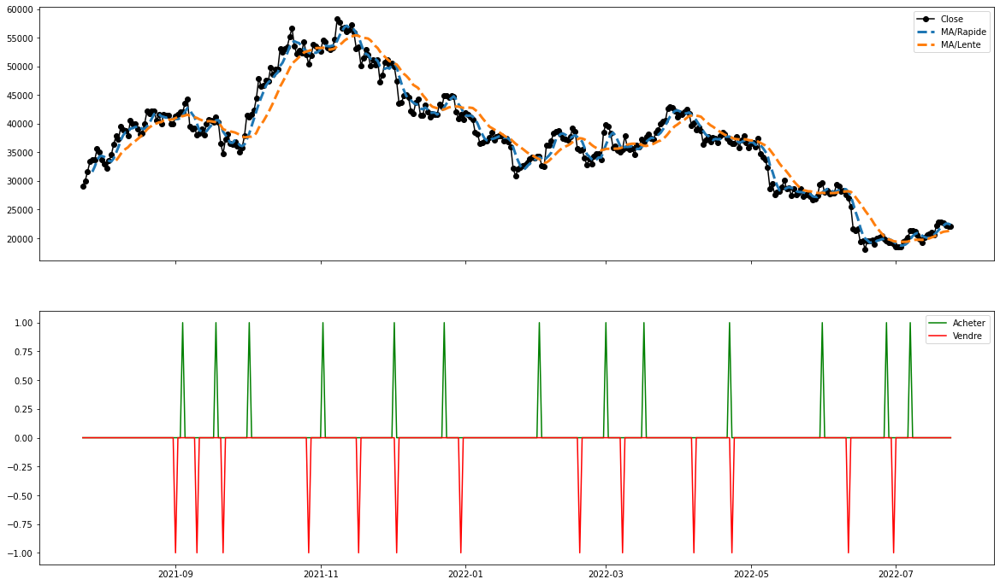

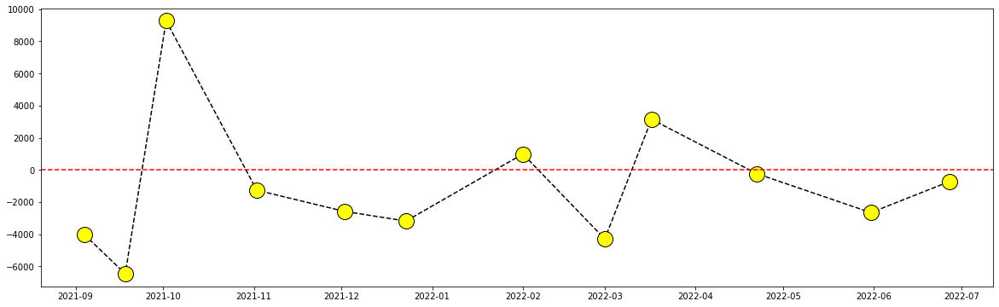

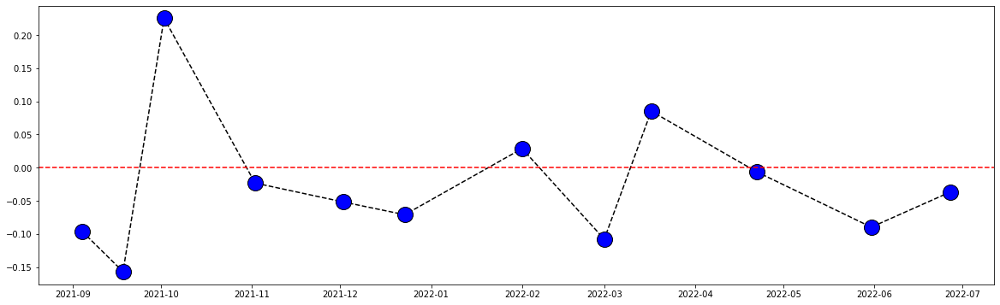

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[5,20]
Durant la période avec une MA lente à 20 jours
    et une MA rapide à 5 jours on enregistre :
    


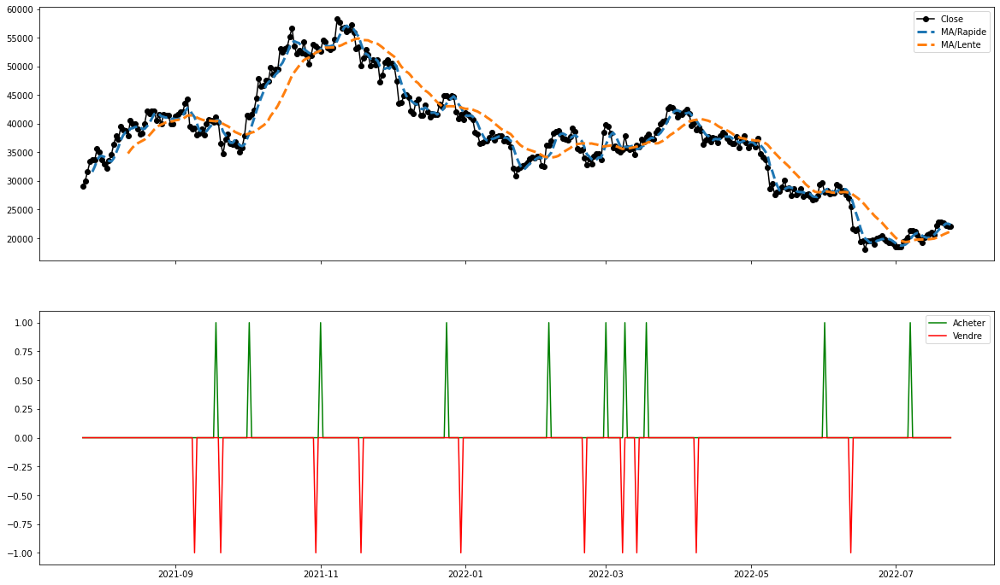

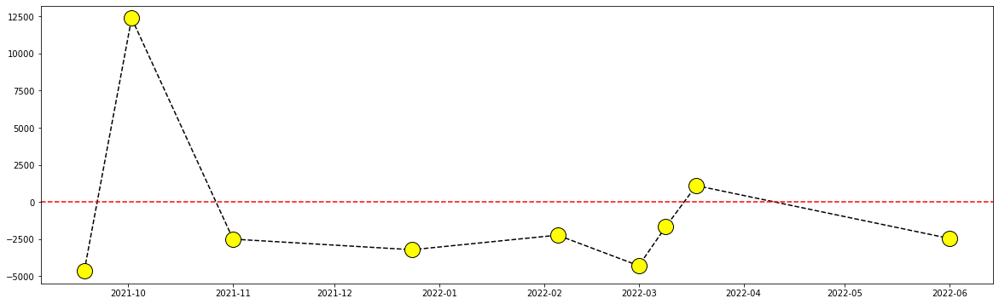

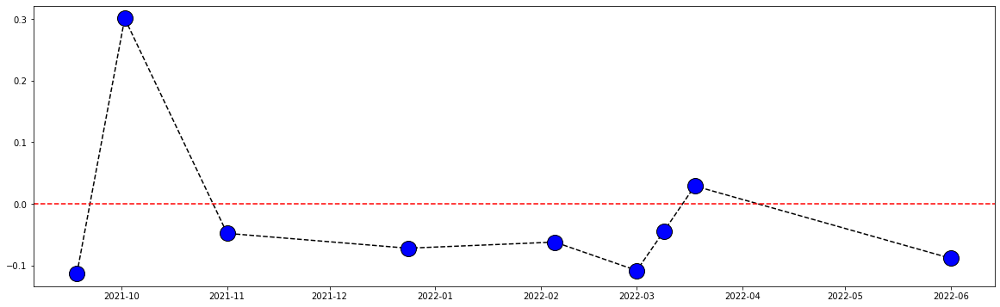

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[5,25]
Durant la période avec une MA lente à 25 jours
    et une MA rapide à 5 jours on enregistre :
    


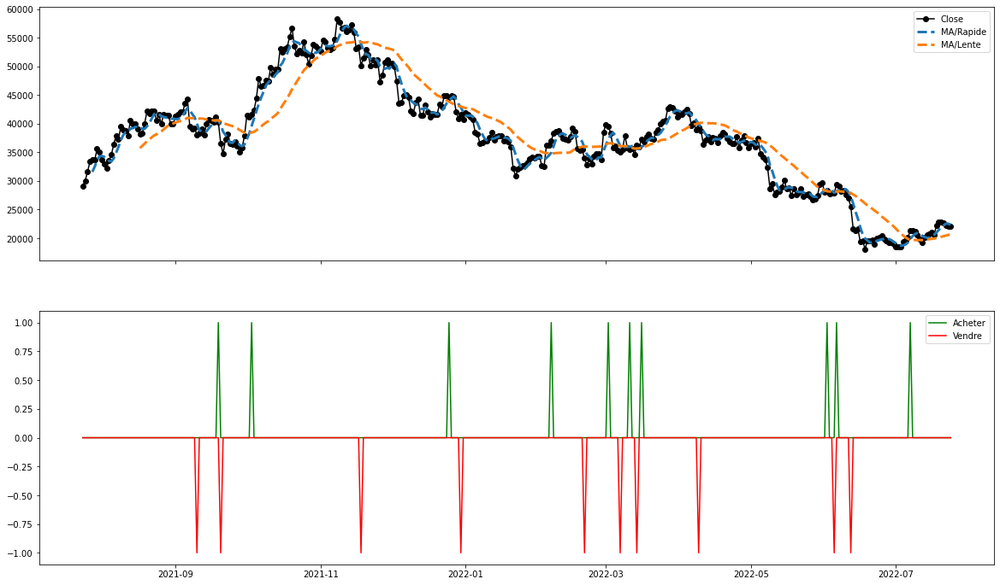

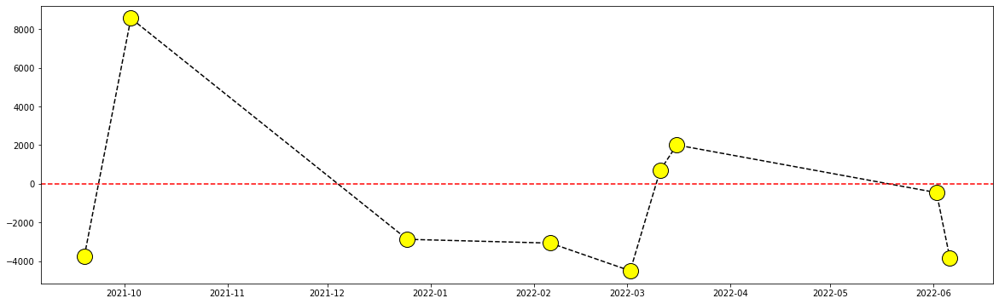

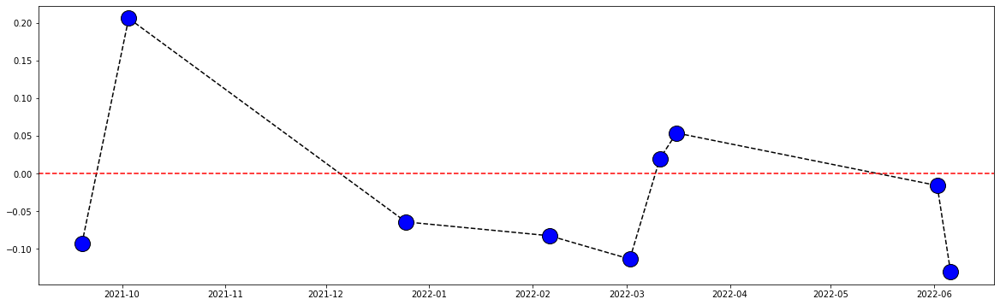

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[5,30]
Durant la période avec une MA lente à 30 jours
    et une MA rapide à 5 jours on enregistre :
    


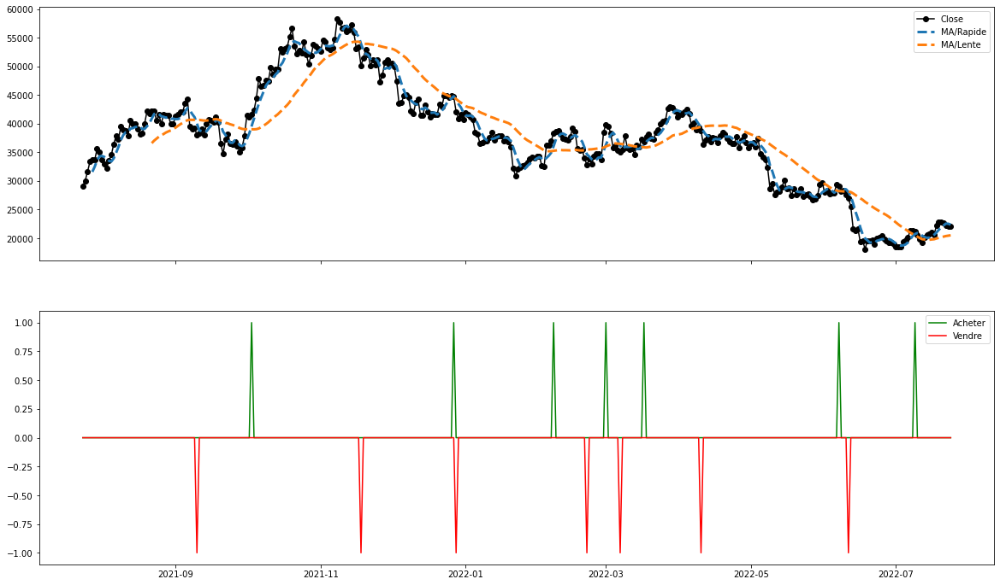

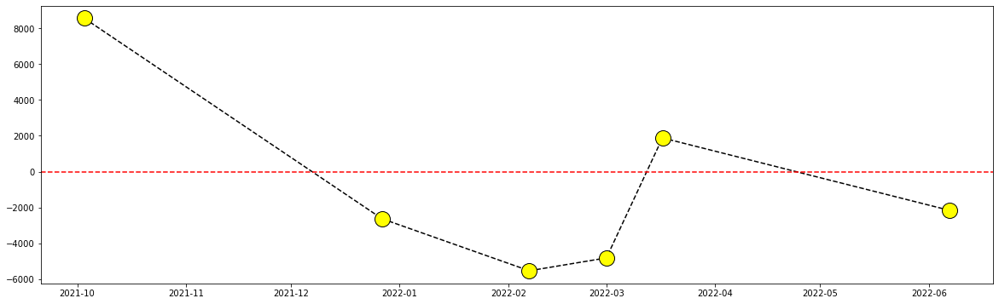

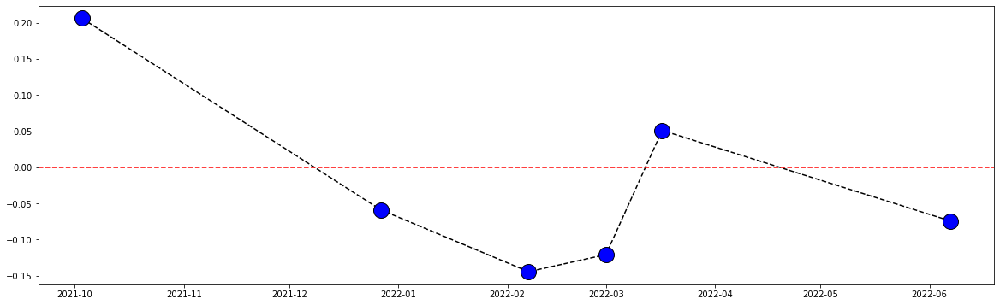

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[5,35]
Durant la période avec une MA lente à 35 jours
    et une MA rapide à 5 jours on enregistre :
    


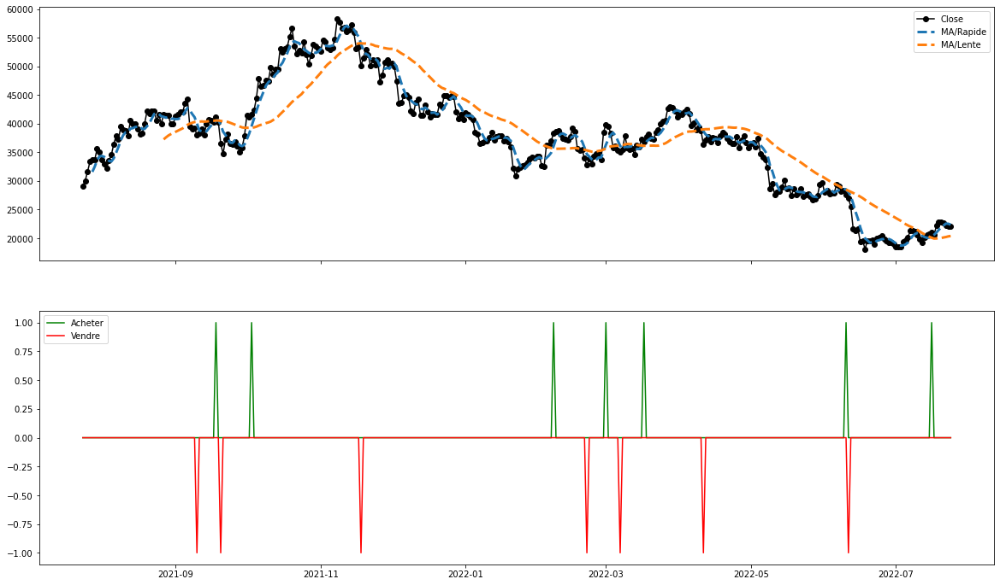

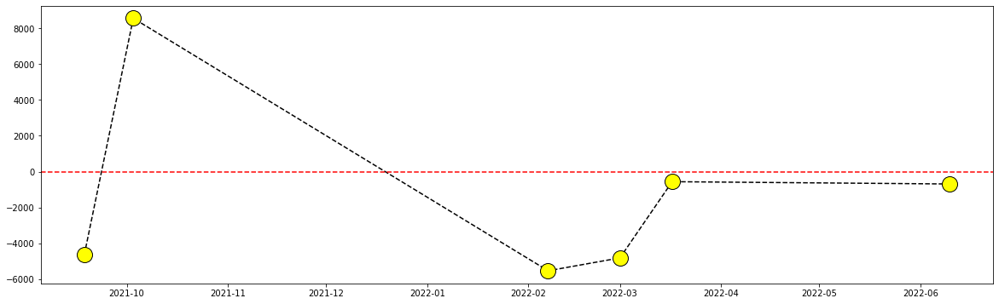

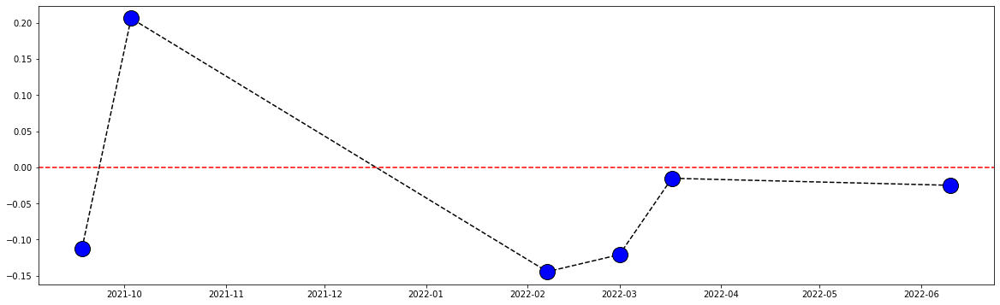

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[5,40]
Durant la période avec une MA lente à 40 jours
    et une MA rapide à 5 jours on enregistre :
    


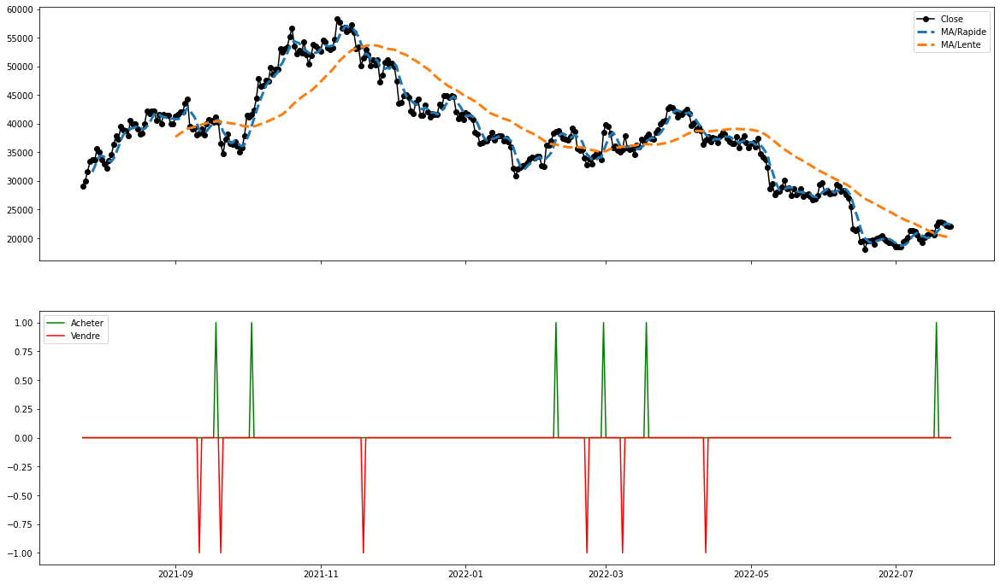

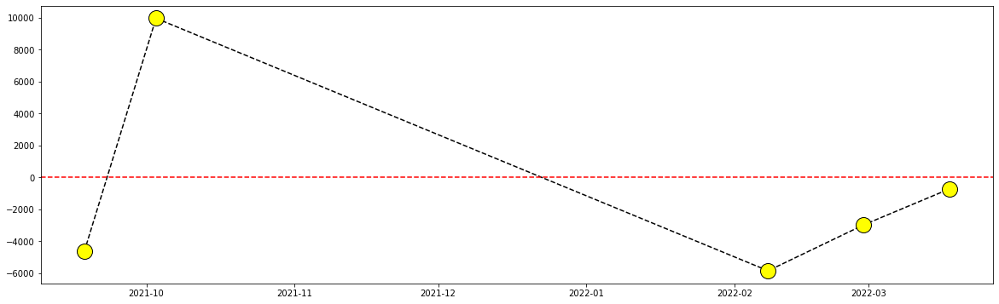

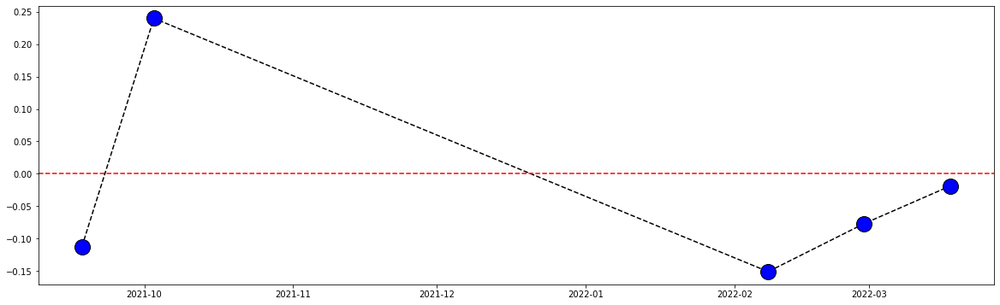

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[5,45]
Durant la période avec une MA lente à 45 jours
    et une MA rapide à 5 jours on enregistre :
    


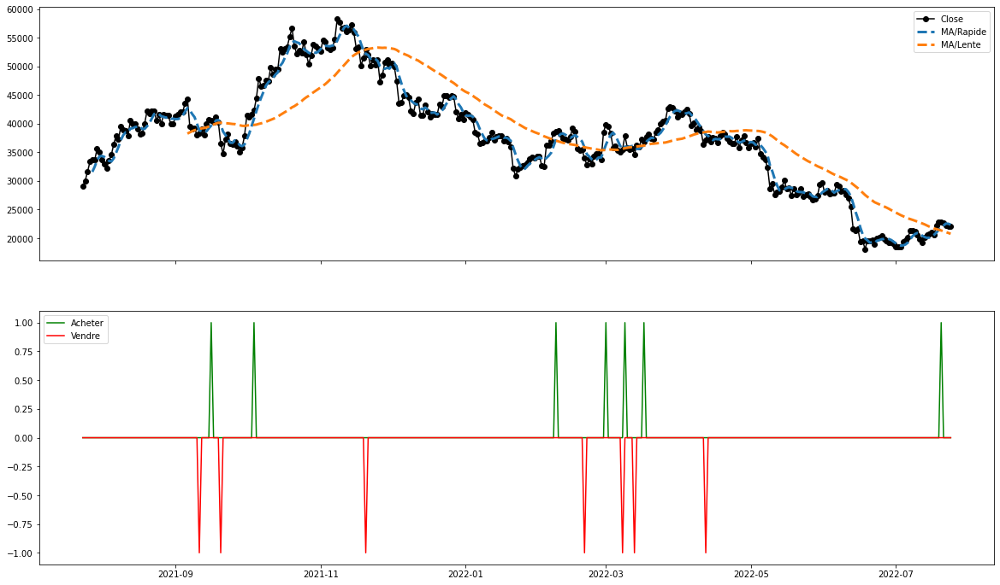

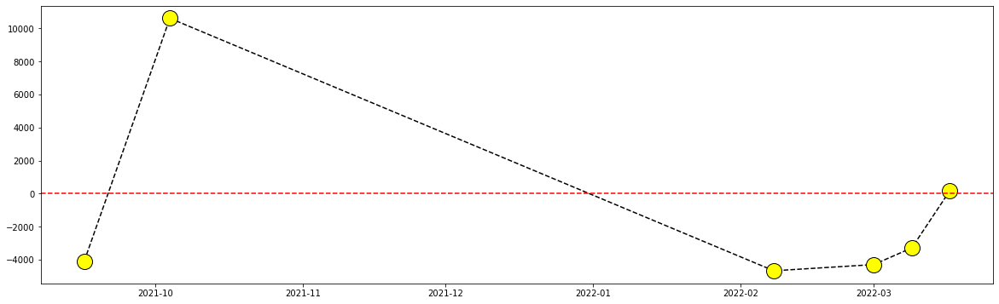

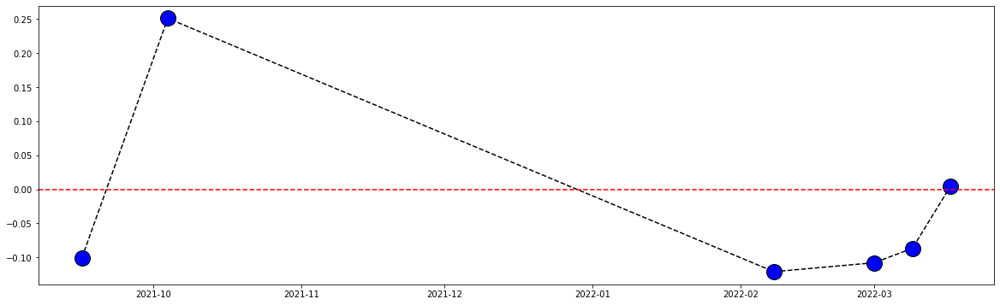

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[6,15]
Durant la période avec une MA lente à 15 jours
    et une MA rapide à 6 jours on enregistre :
    


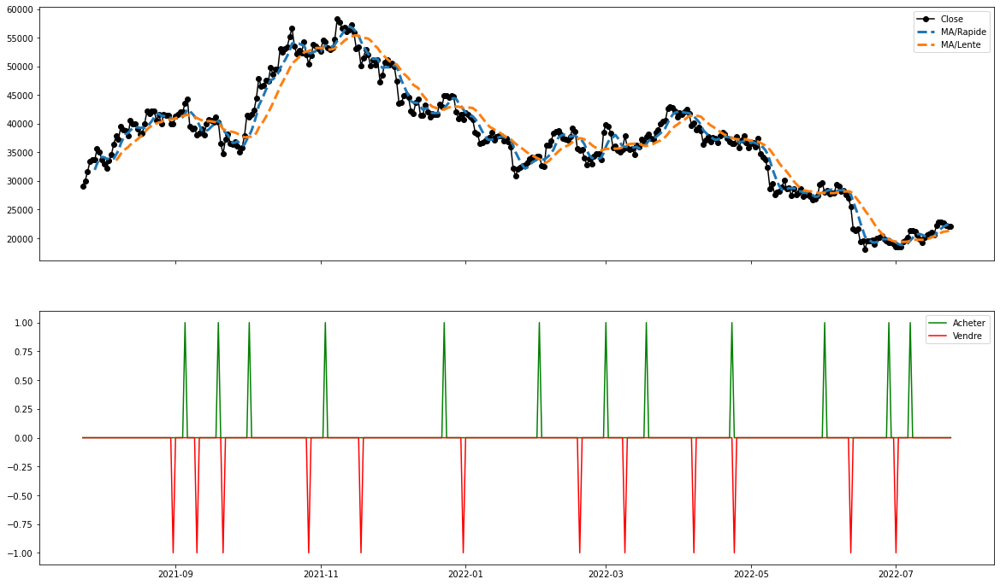

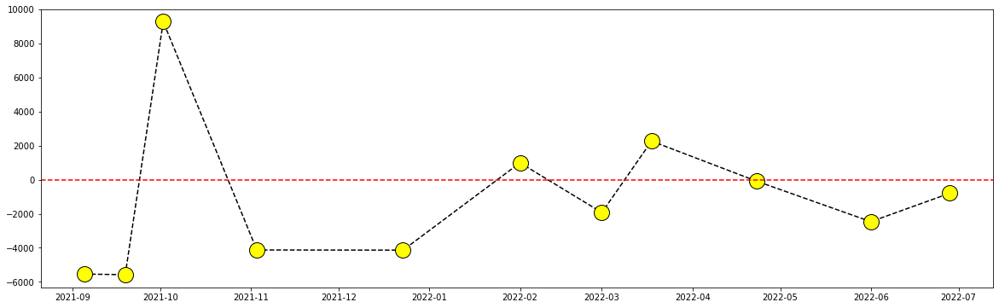

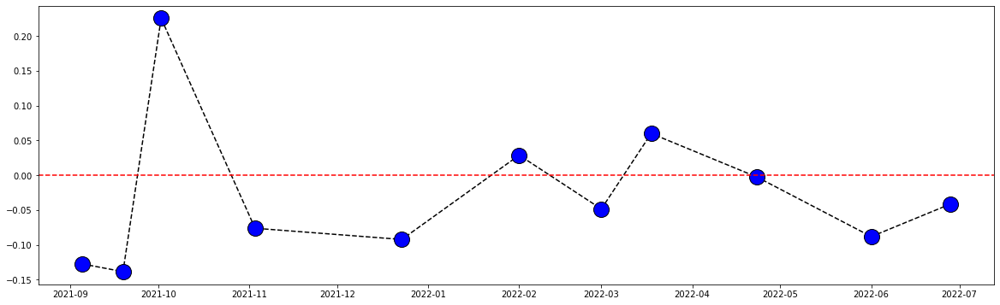

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[6,20]
Durant la période avec une MA lente à 20 jours
    et une MA rapide à 6 jours on enregistre :
    


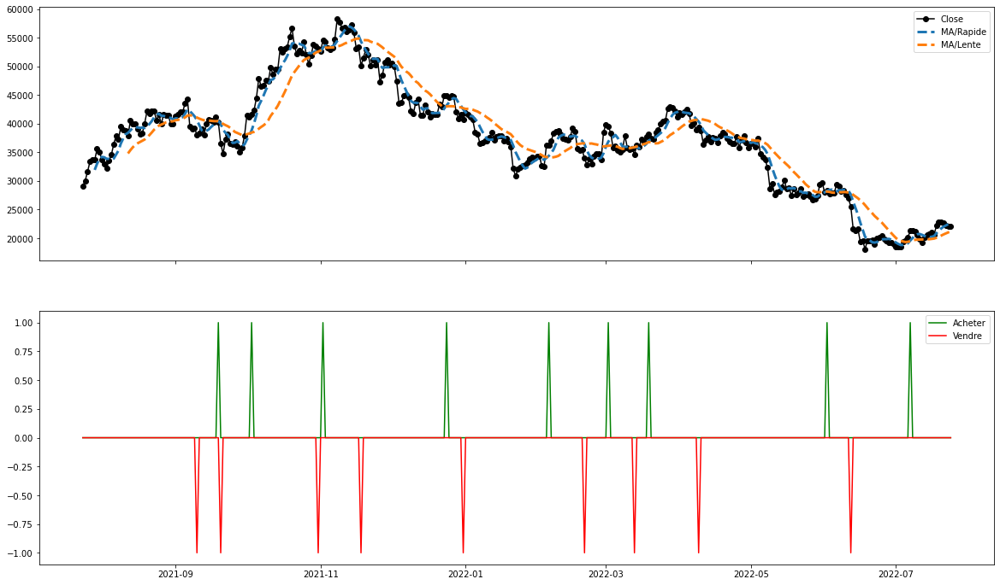

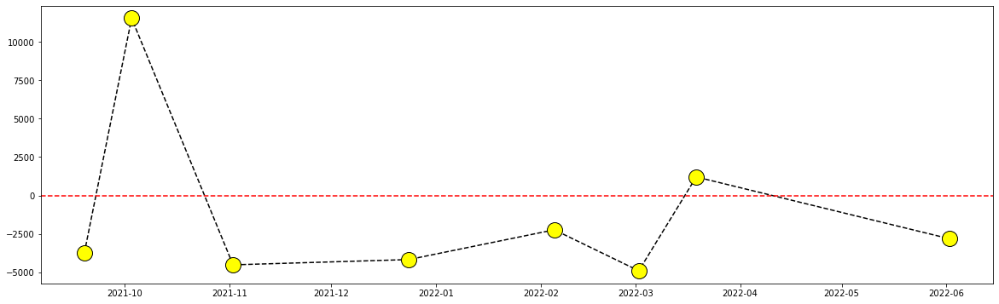

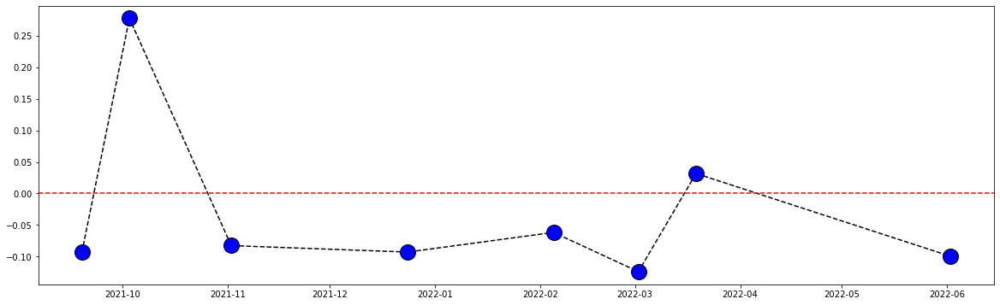

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[6,25]
Durant la période avec une MA lente à 25 jours
    et une MA rapide à 6 jours on enregistre :
    


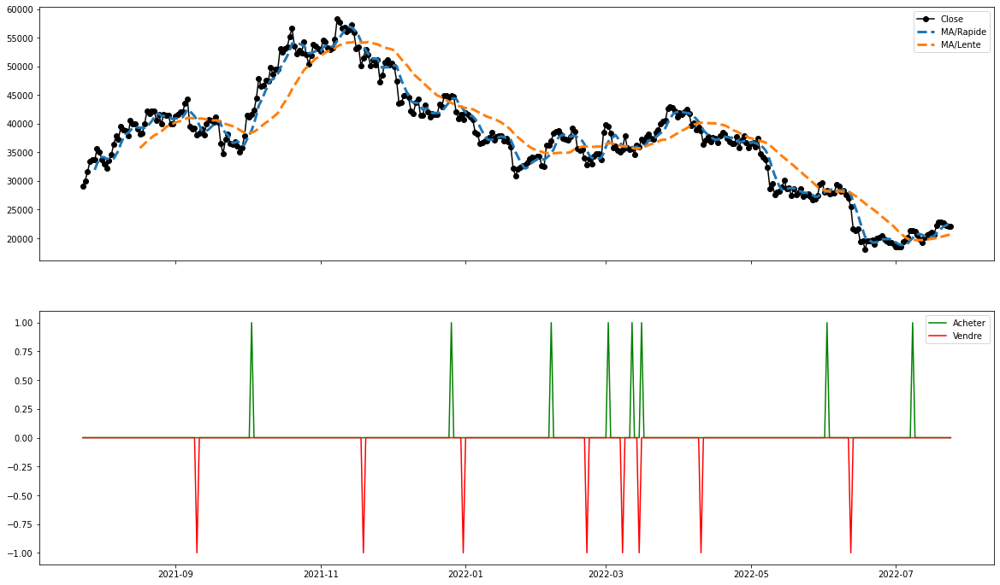

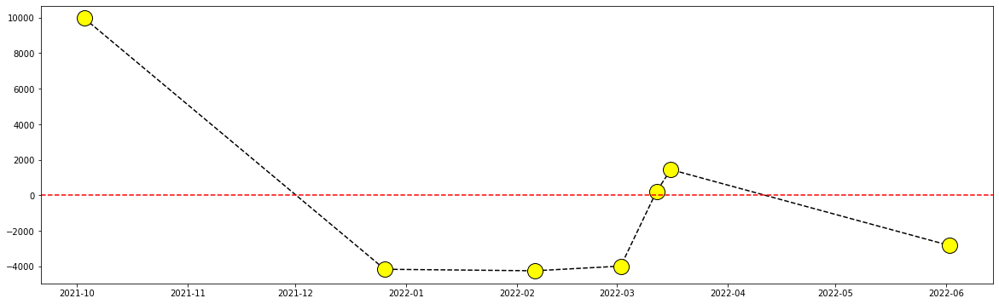

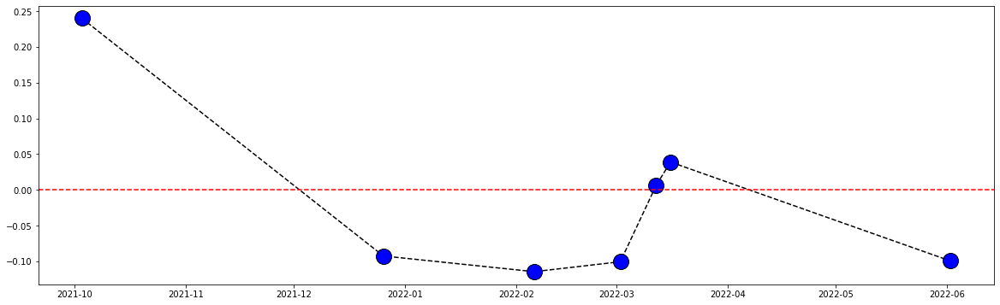

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[6,30]
Durant la période avec une MA lente à 30 jours
    et une MA rapide à 6 jours on enregistre :
    


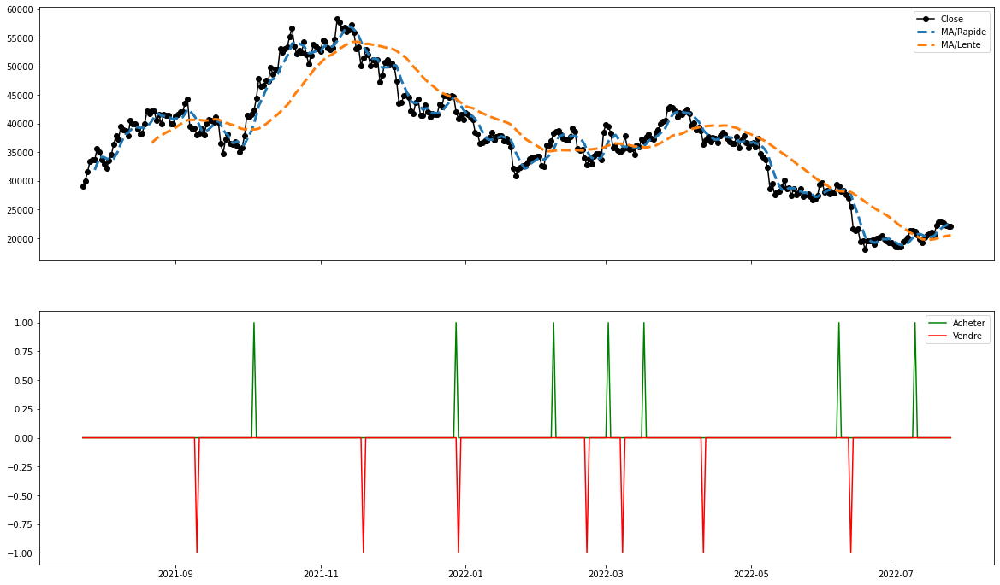

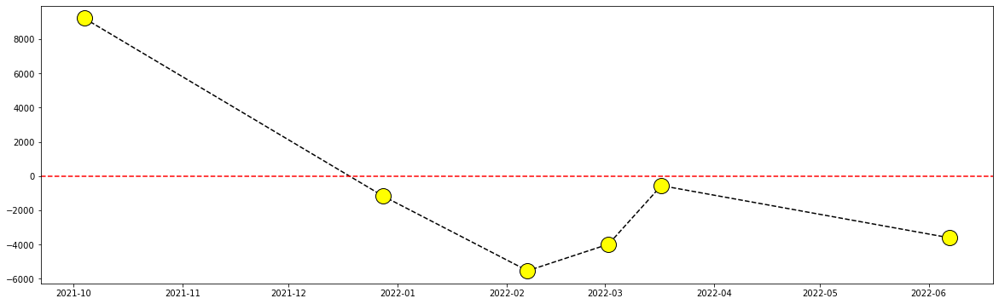

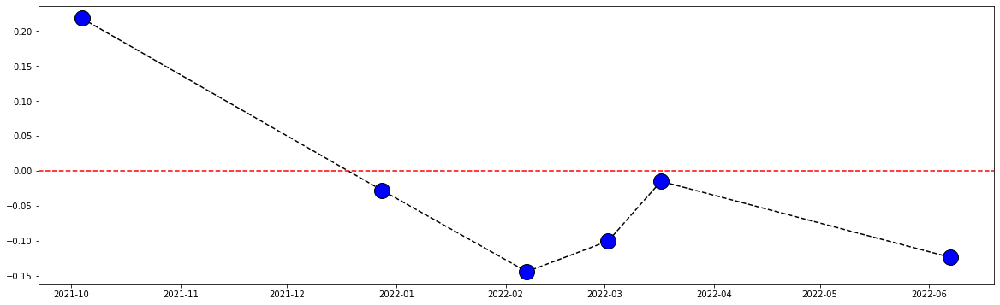

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[6,35]
Durant la période avec une MA lente à 35 jours
    et une MA rapide à 6 jours on enregistre :
    


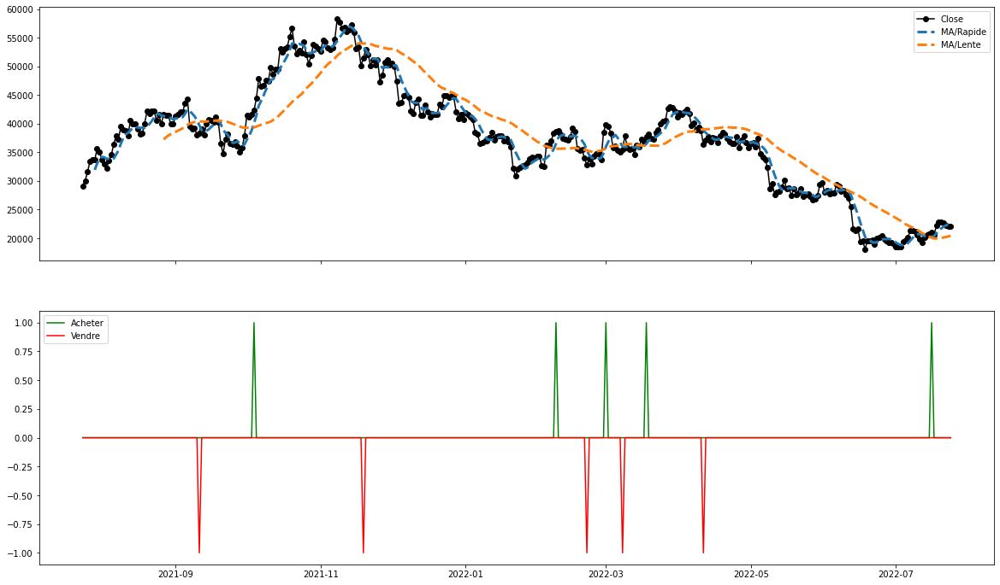

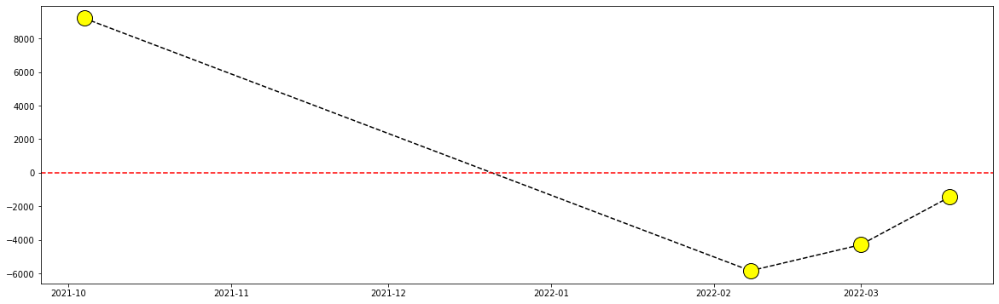

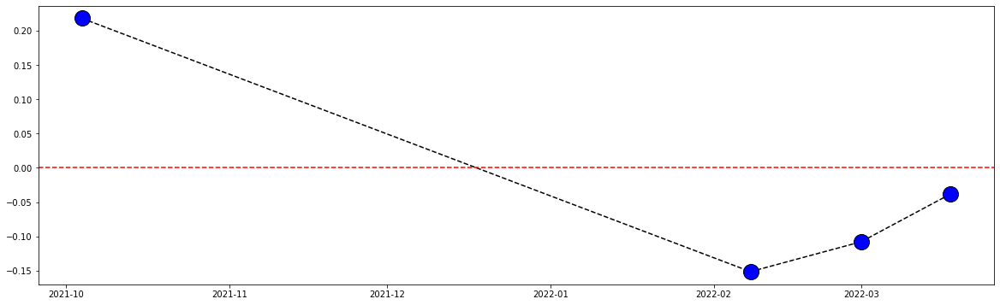

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[6,40]
Durant la période avec une MA lente à 40 jours
    et une MA rapide à 6 jours on enregistre :
    


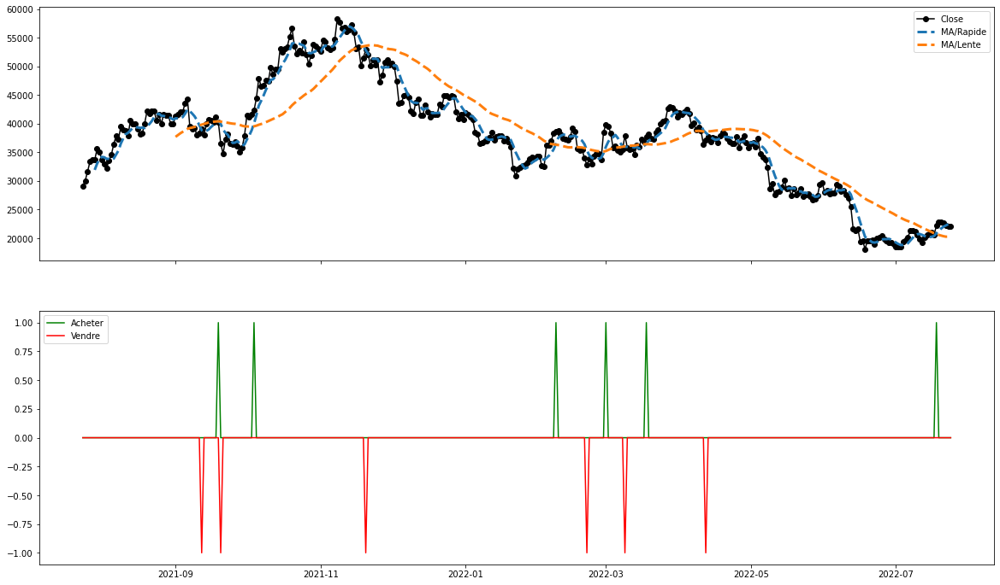

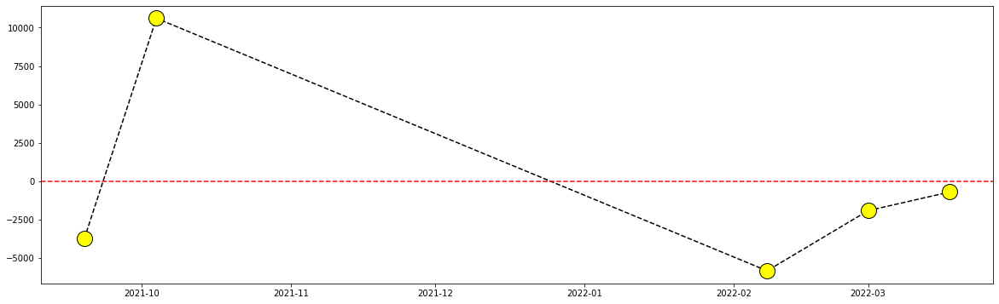

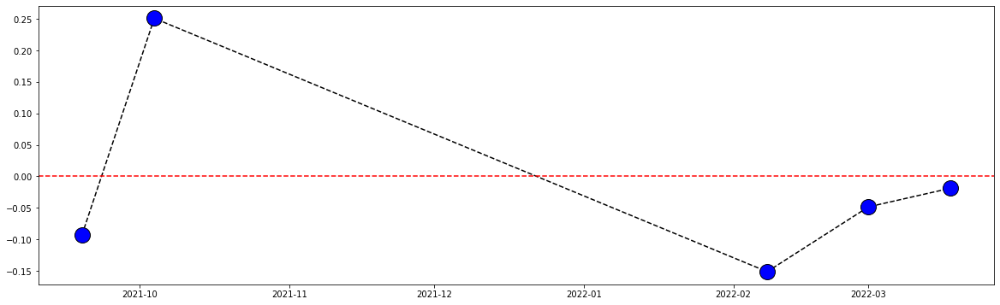

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[6,45]
Durant la période avec une MA lente à 45 jours
    et une MA rapide à 6 jours on enregistre :
    


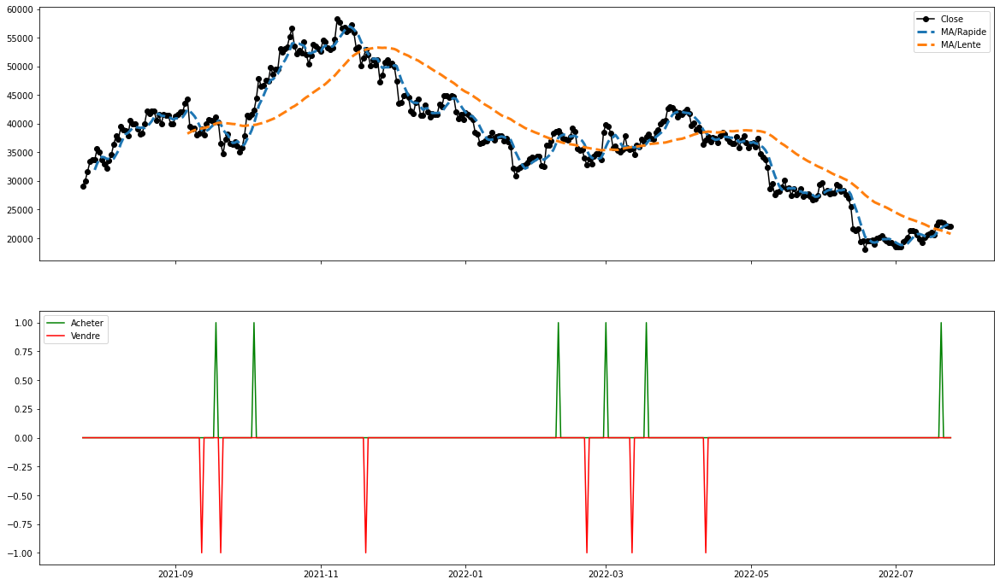

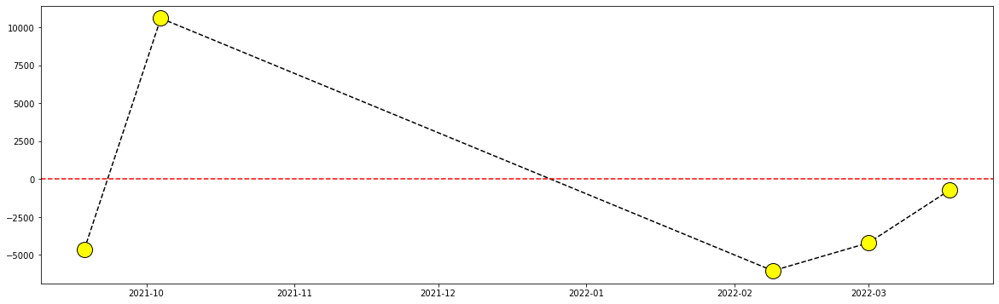

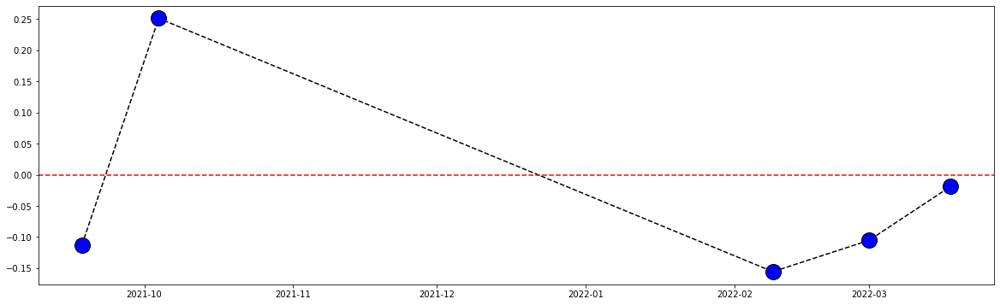

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[7,15]
Durant la période avec une MA lente à 15 jours
    et une MA rapide à 7 jours on enregistre :
    


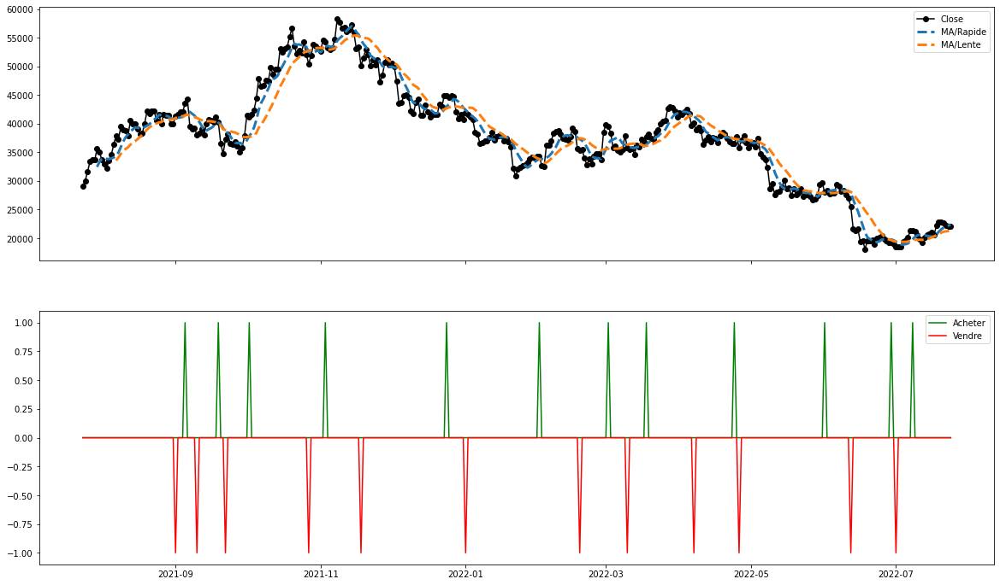

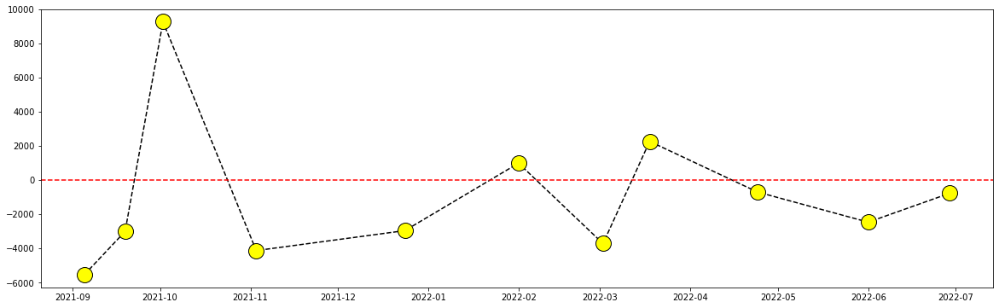

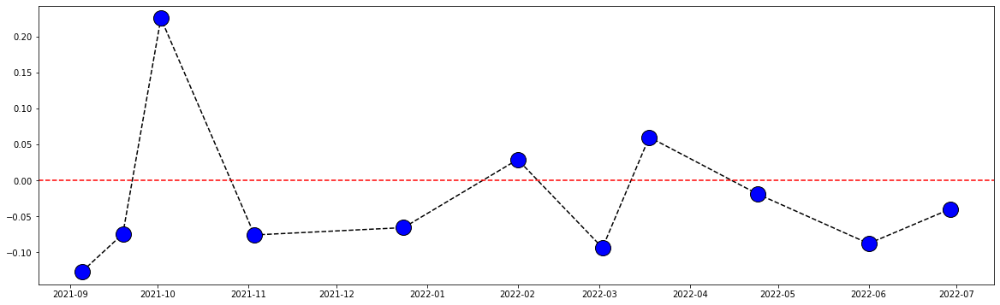

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[7,20]
Durant la période avec une MA lente à 20 jours
    et une MA rapide à 7 jours on enregistre :
    


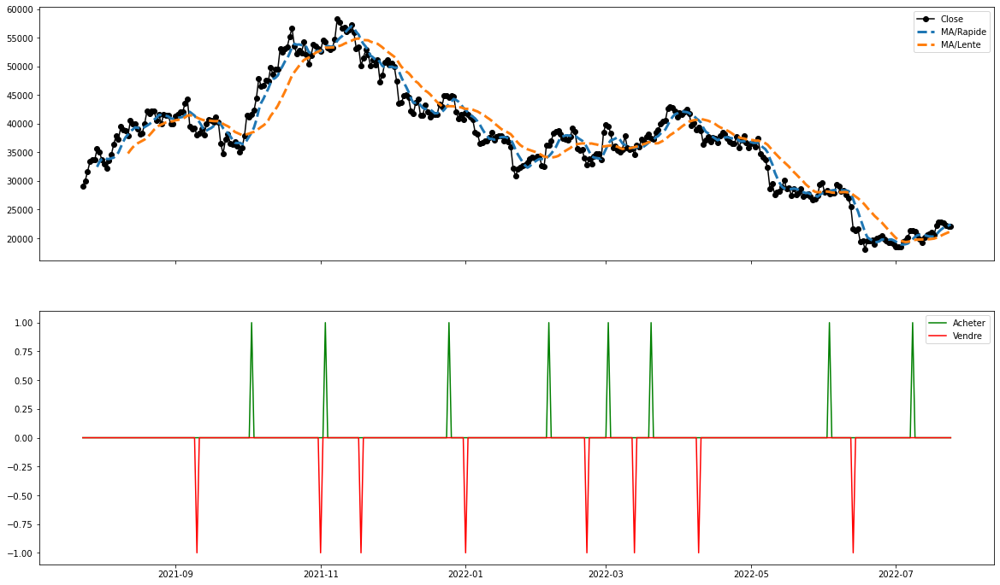

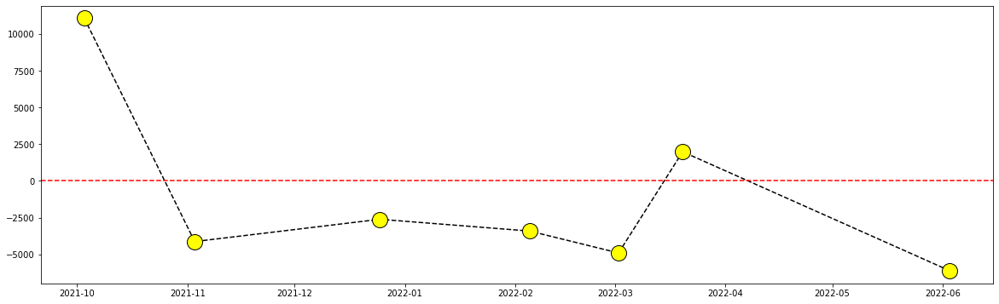

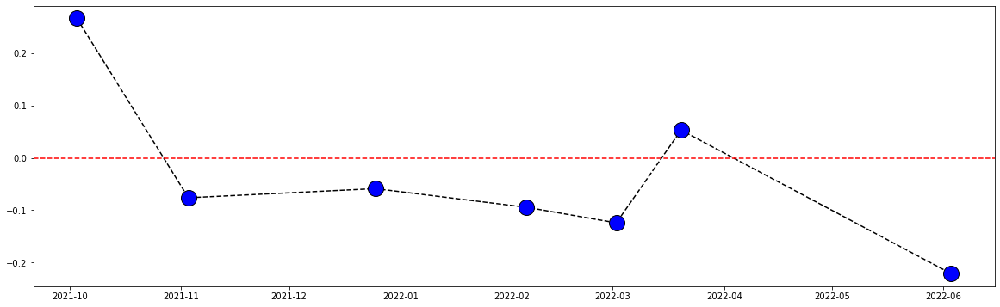

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[7,25]
Durant la période avec une MA lente à 25 jours
    et une MA rapide à 7 jours on enregistre :
    


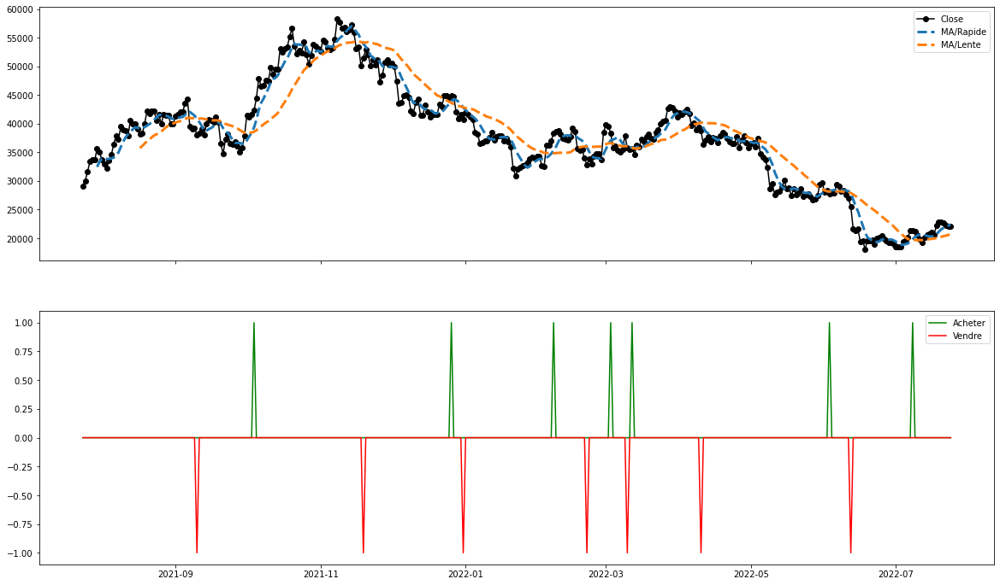

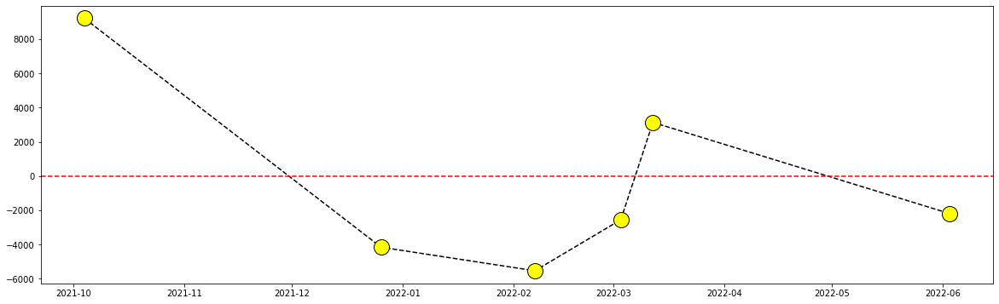

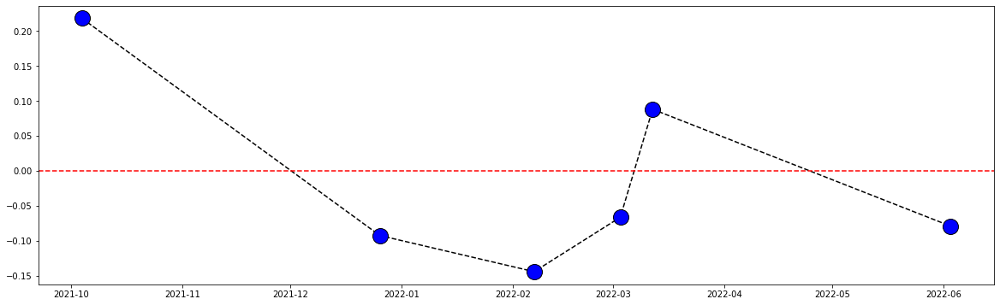

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[7,30]
Durant la période avec une MA lente à 30 jours
    et une MA rapide à 7 jours on enregistre :
    


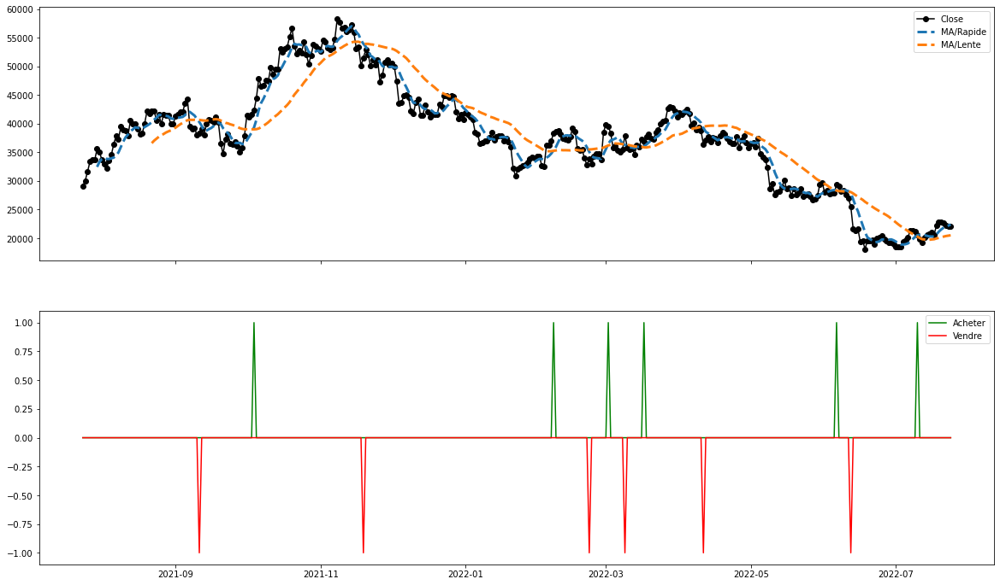

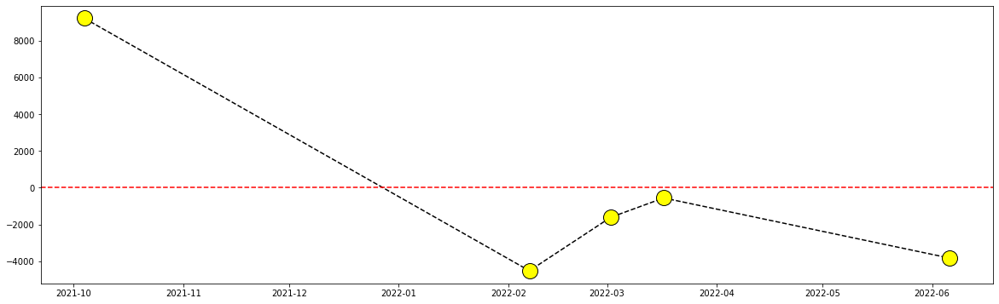

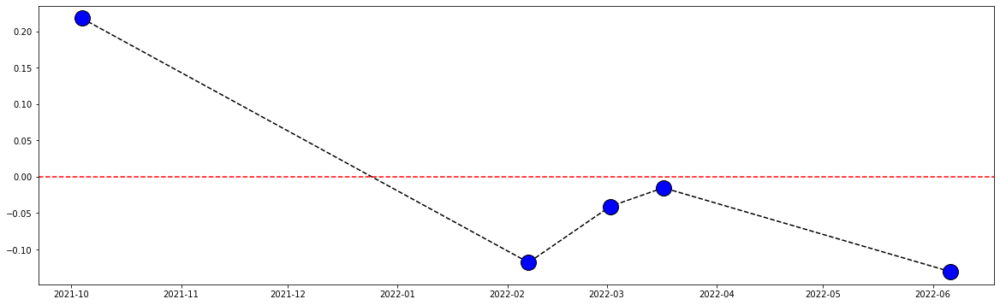

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[7,35]
Durant la période avec une MA lente à 35 jours
    et une MA rapide à 7 jours on enregistre :
    


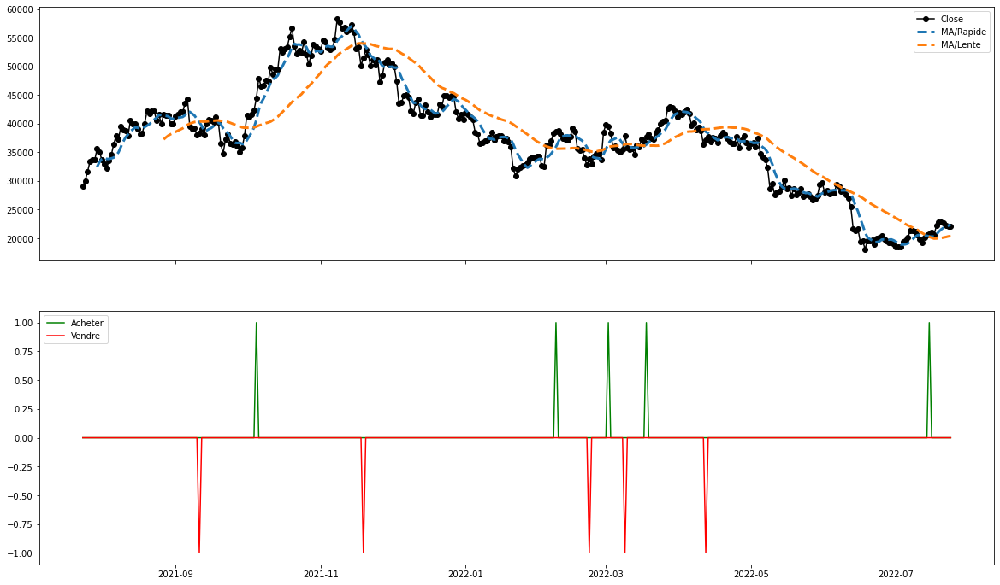

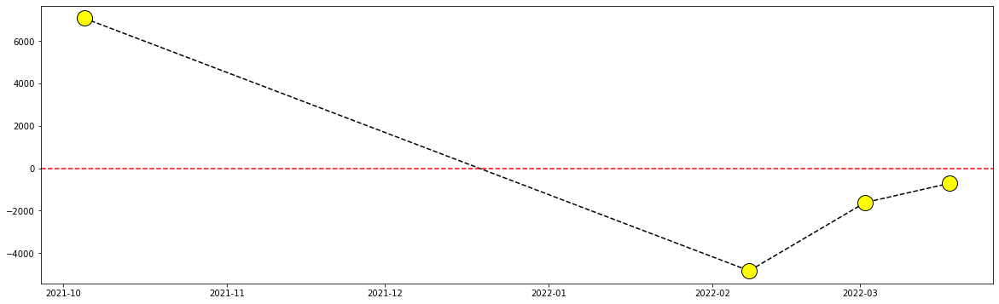

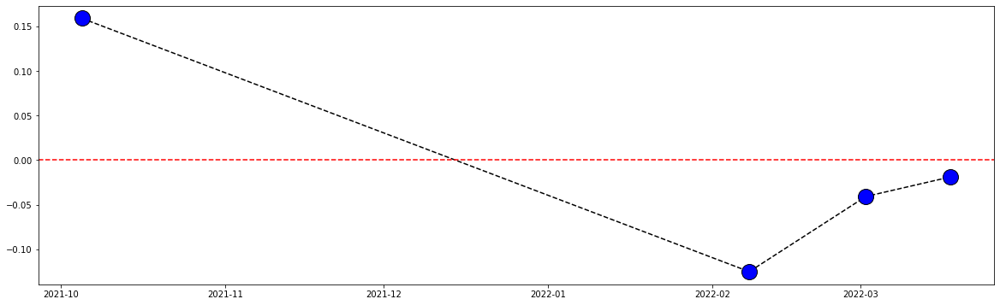

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[7,40]
Durant la période avec une MA lente à 40 jours
    et une MA rapide à 7 jours on enregistre :
    


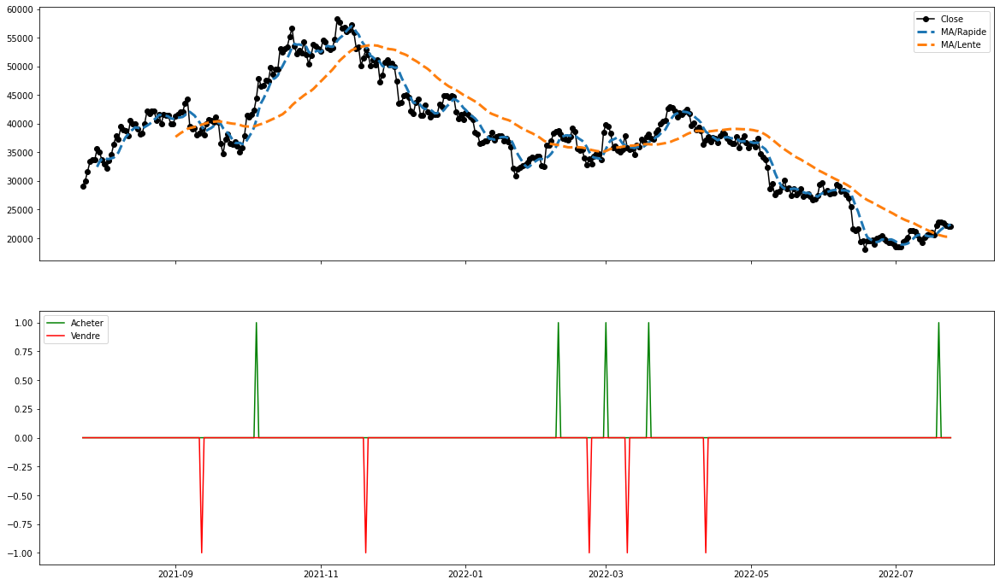

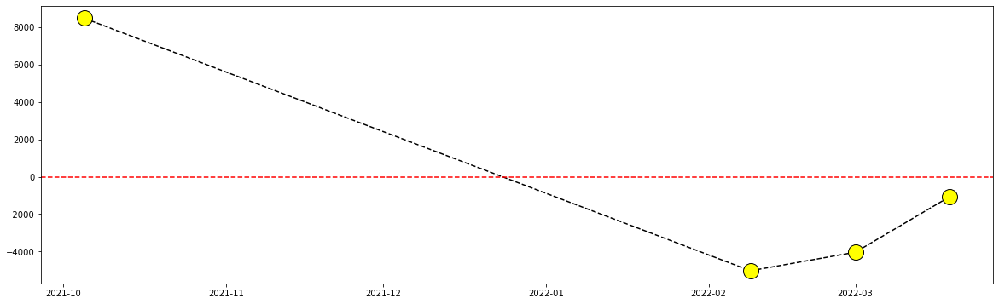

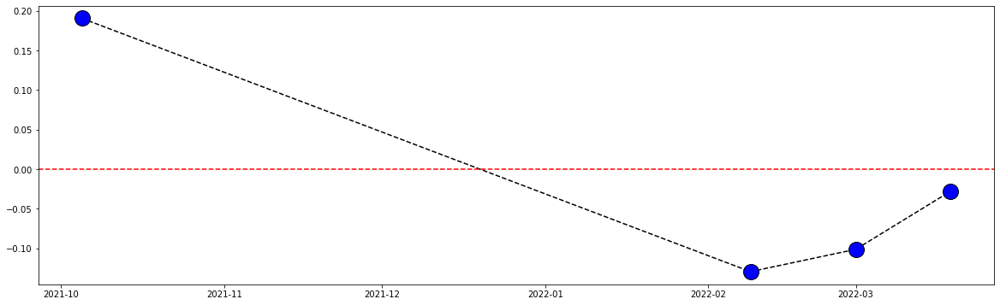

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[7,45]
Durant la période avec une MA lente à 45 jours
    et une MA rapide à 7 jours on enregistre :
    


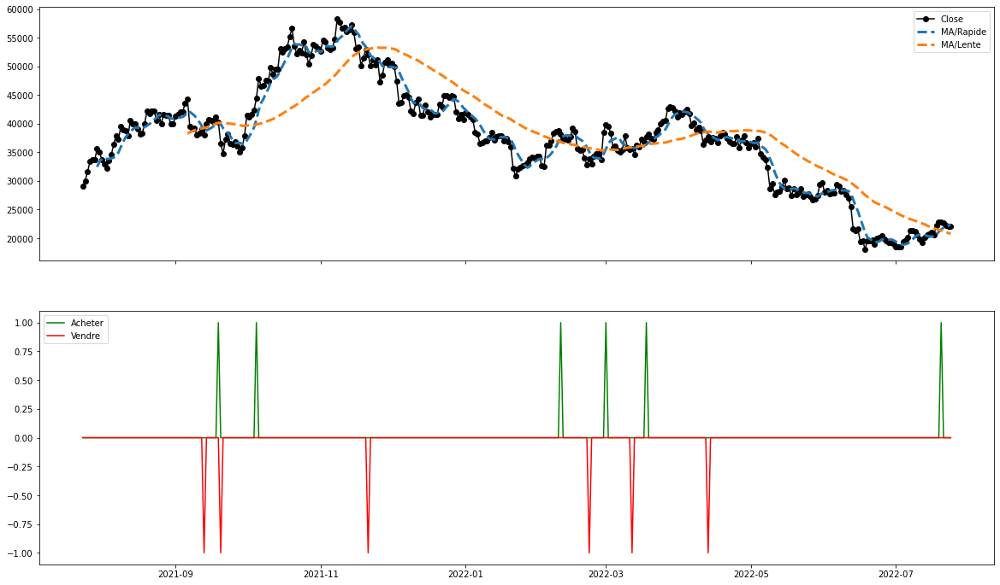

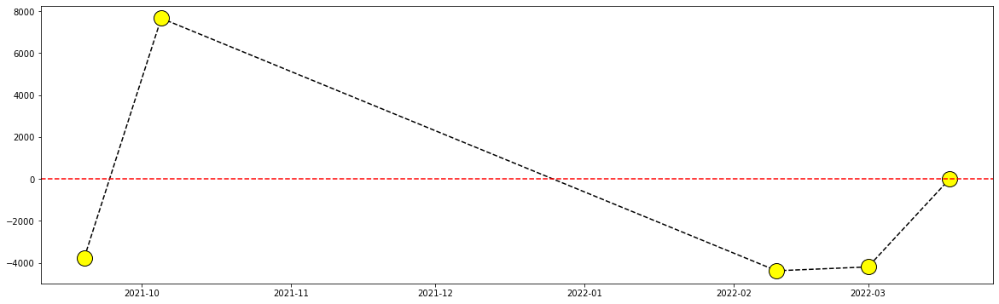

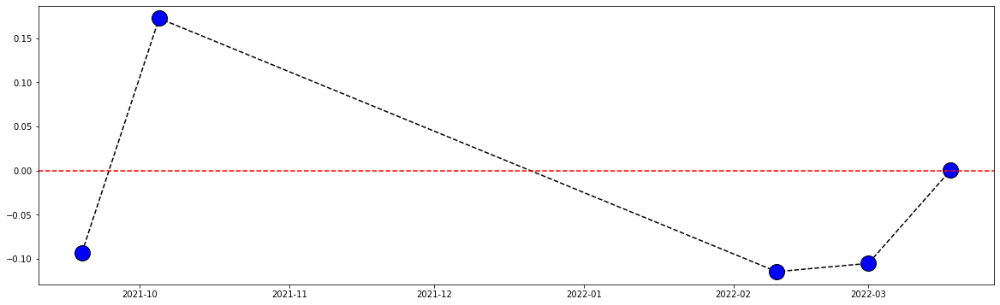

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[8,15]
Durant la période avec une MA lente à 15 jours
    et une MA rapide à 8 jours on enregistre :
    


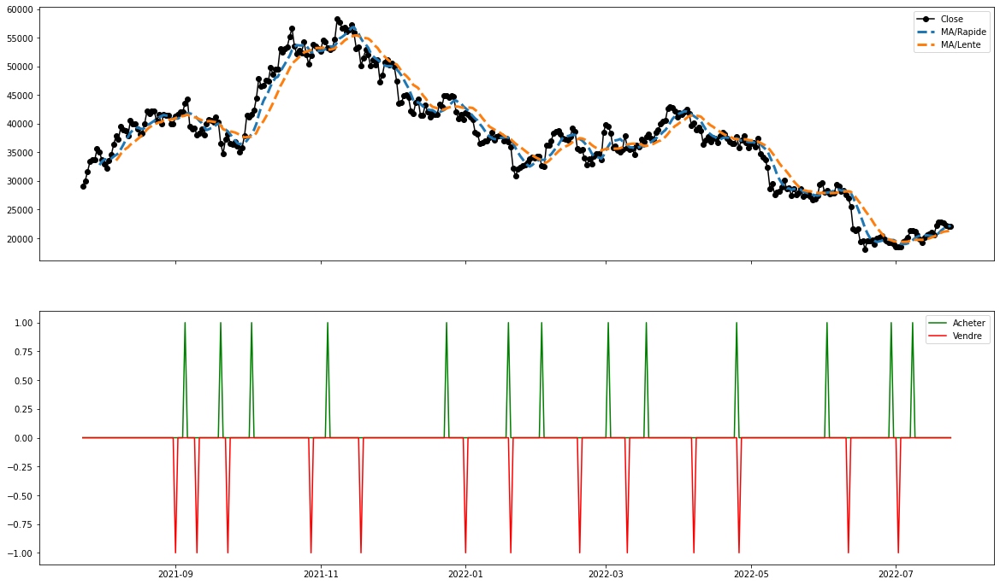

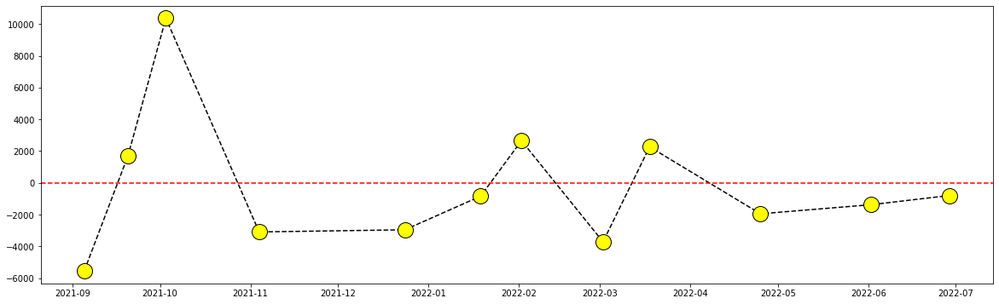

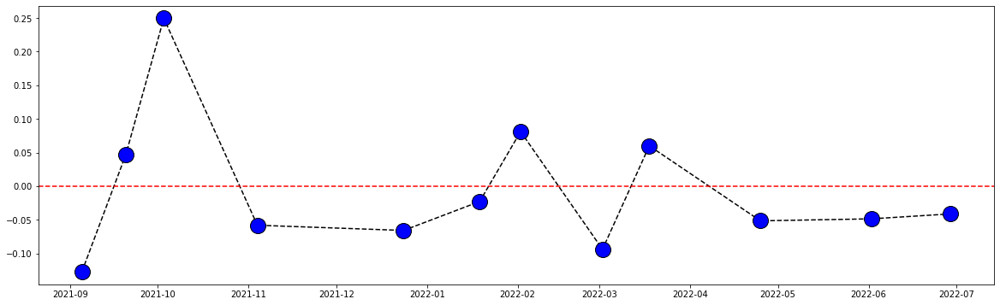

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[8,20]
Durant la période avec une MA lente à 20 jours
    et une MA rapide à 8 jours on enregistre :
    


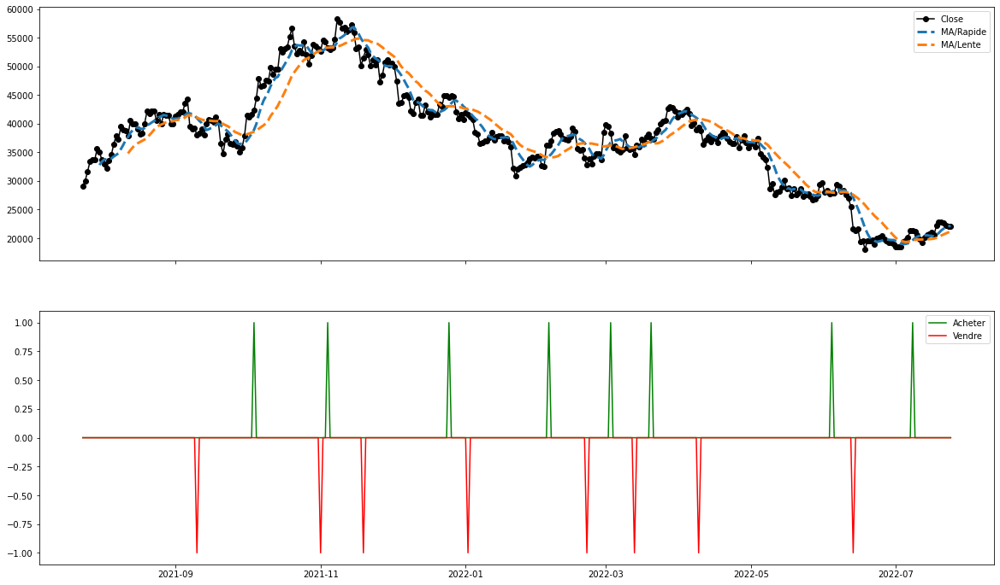

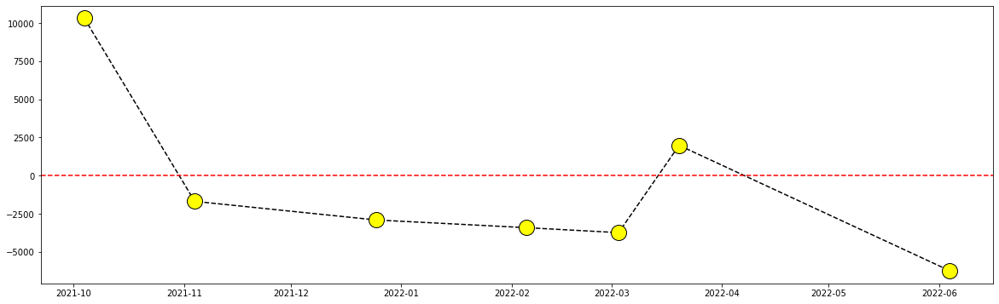

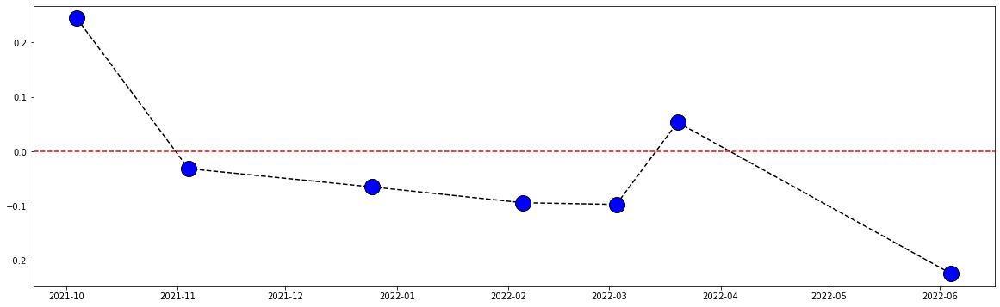

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[8,25]
Durant la période avec une MA lente à 25 jours
    et une MA rapide à 8 jours on enregistre :
    


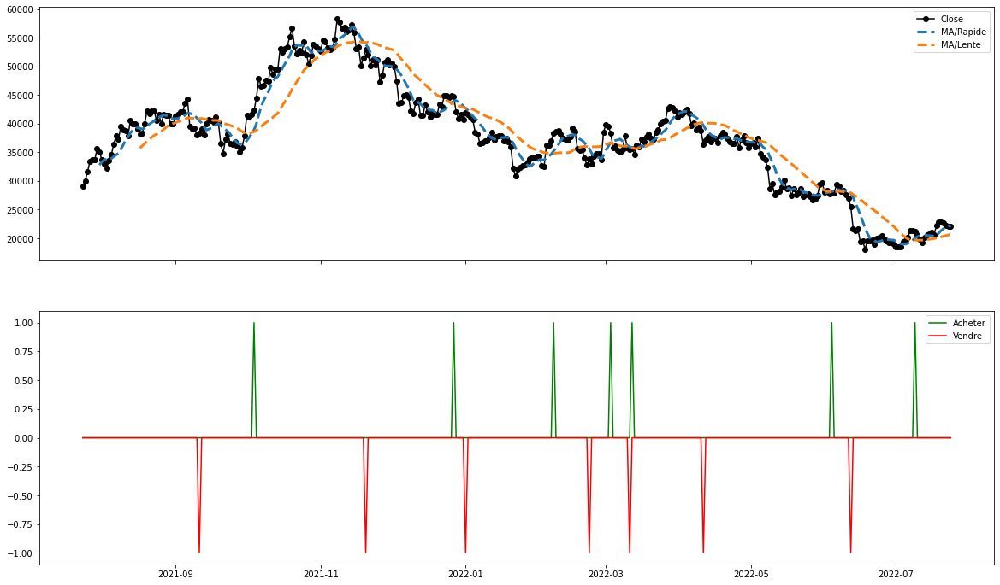

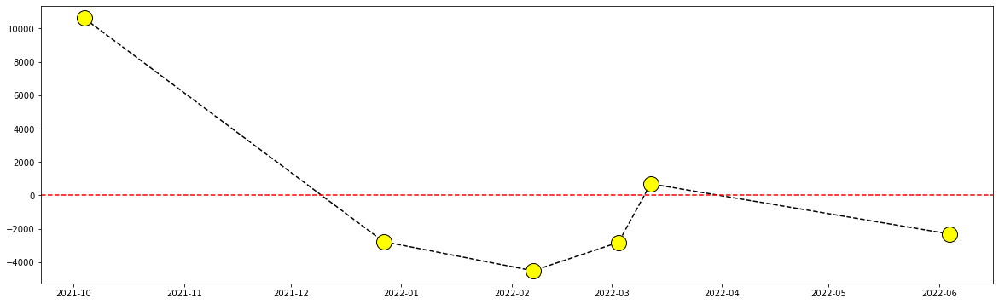

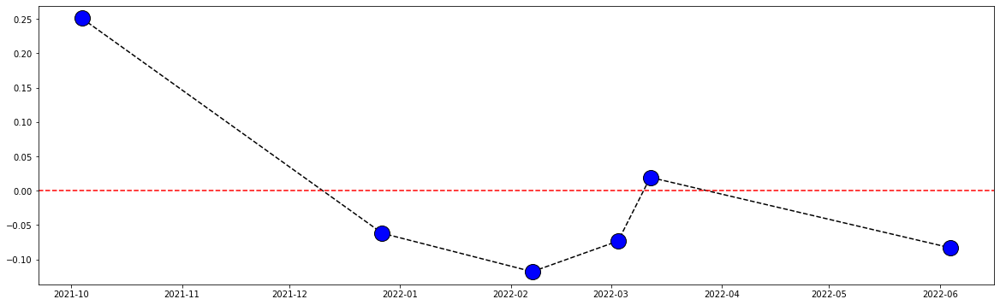

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[8,30]
Durant la période avec une MA lente à 30 jours
    et une MA rapide à 8 jours on enregistre :
    


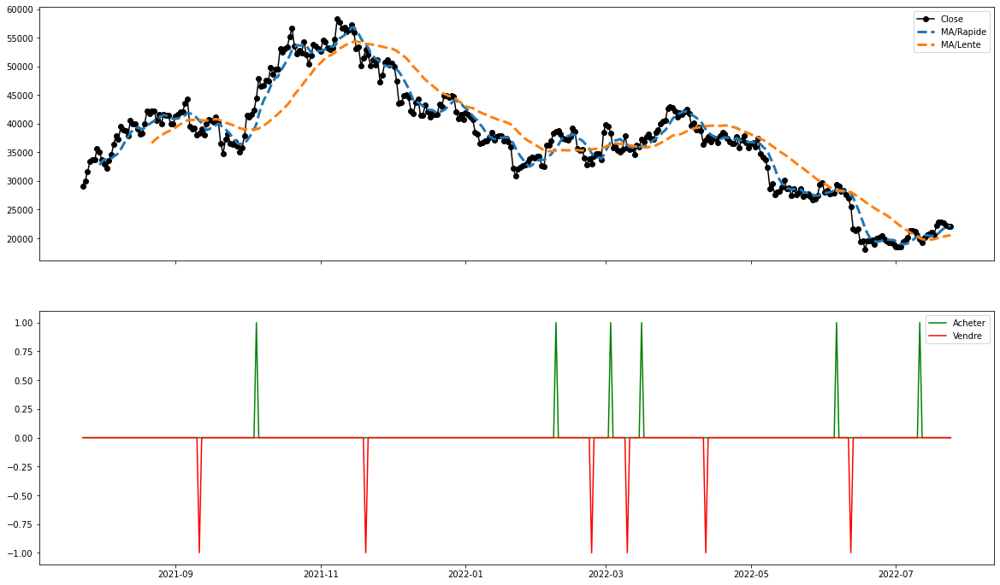

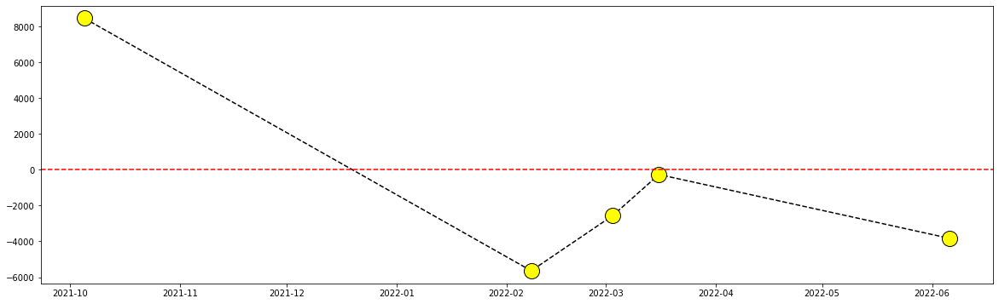

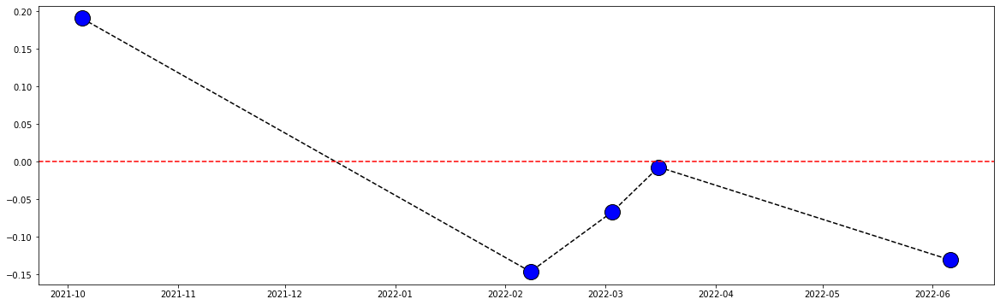

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[8,35]
Durant la période avec une MA lente à 35 jours
    et une MA rapide à 8 jours on enregistre :
    


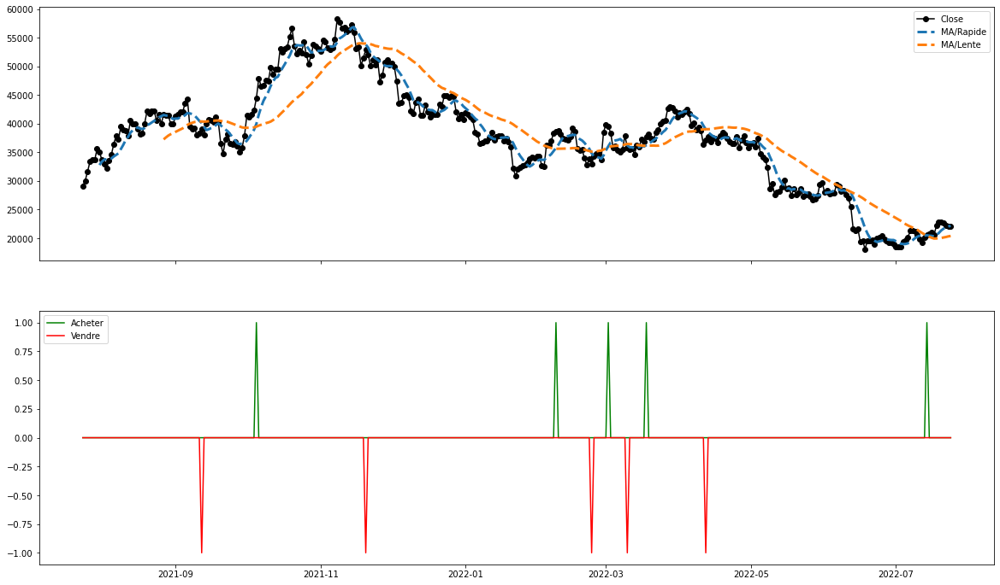

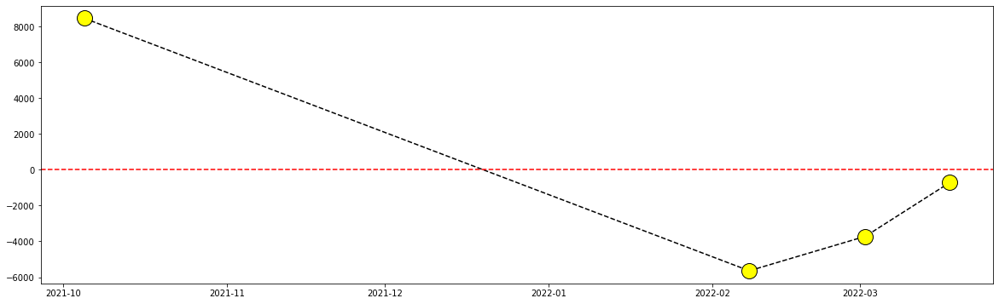

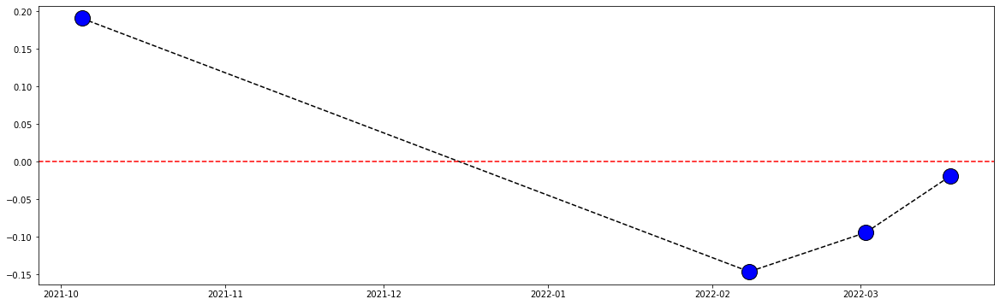

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[8,40]
Durant la période avec une MA lente à 40 jours
    et une MA rapide à 8 jours on enregistre :
    


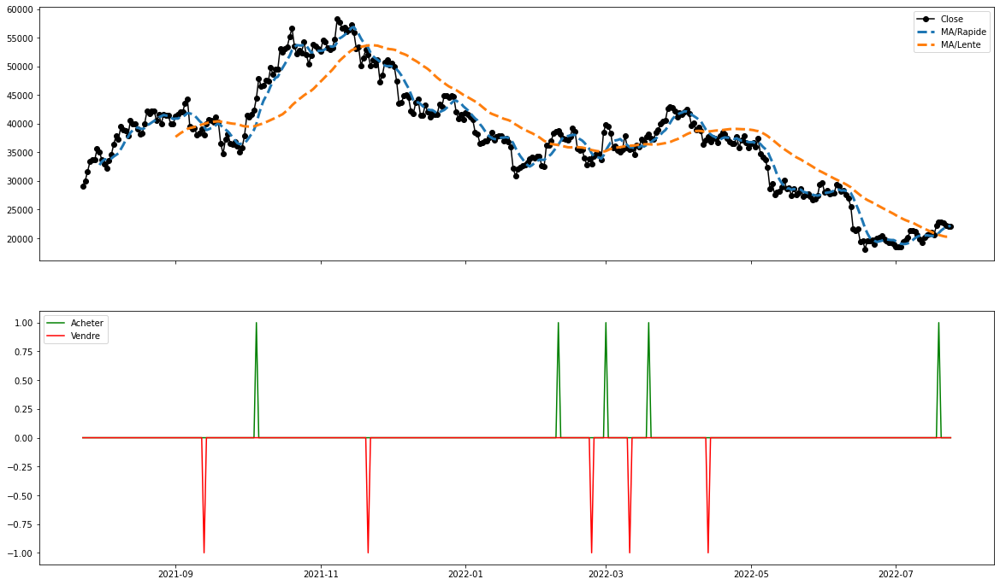

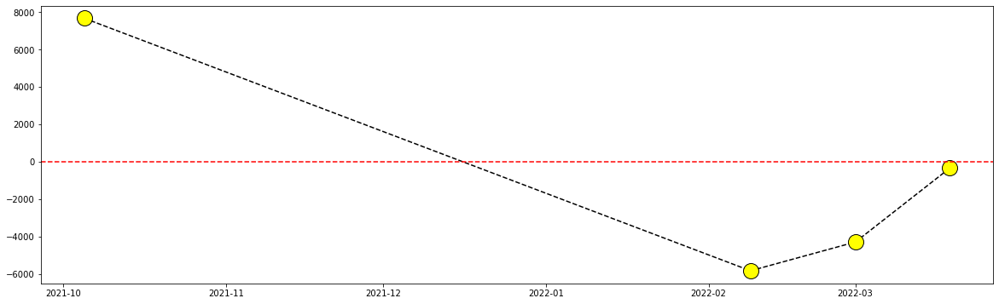

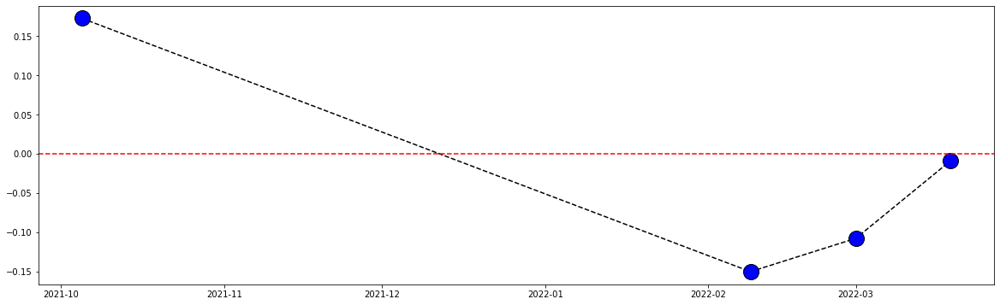

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[8,45]
Durant la période avec une MA lente à 45 jours
    et une MA rapide à 8 jours on enregistre :
    


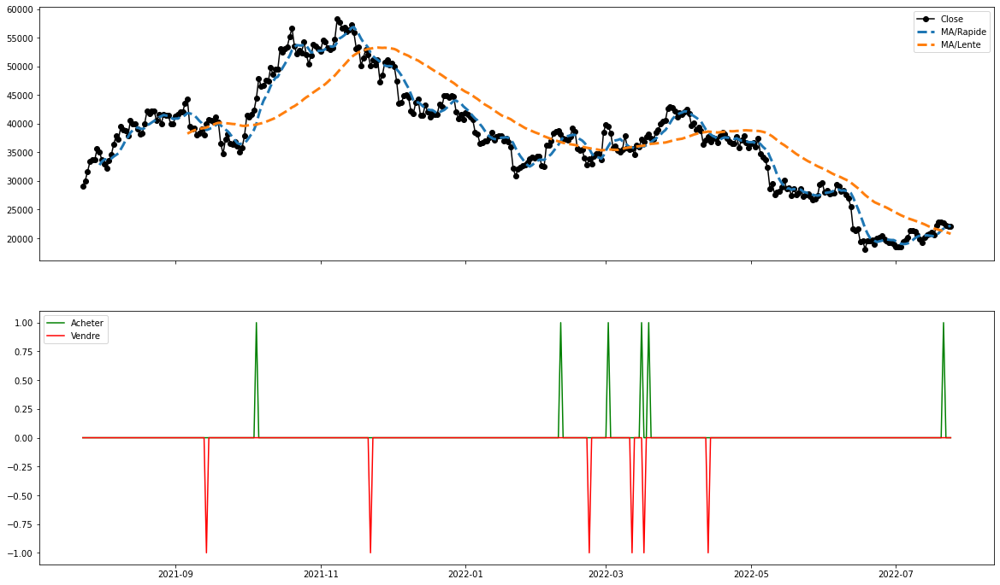

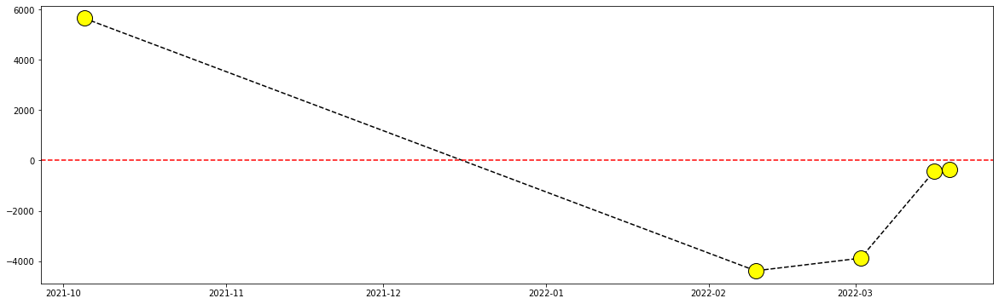

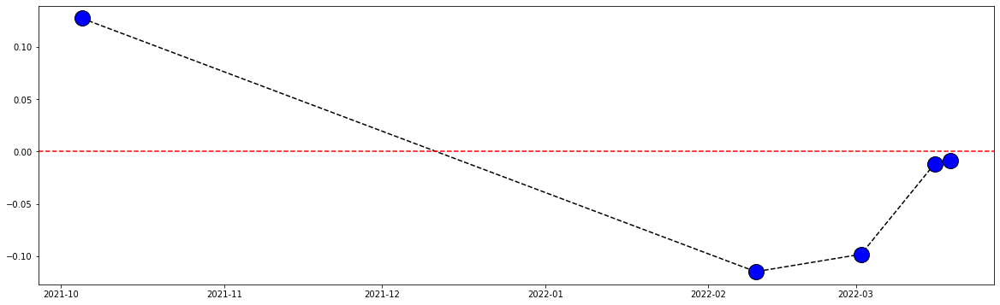

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[9,15]
Durant la période avec une MA lente à 15 jours
    et une MA rapide à 9 jours on enregistre :
    


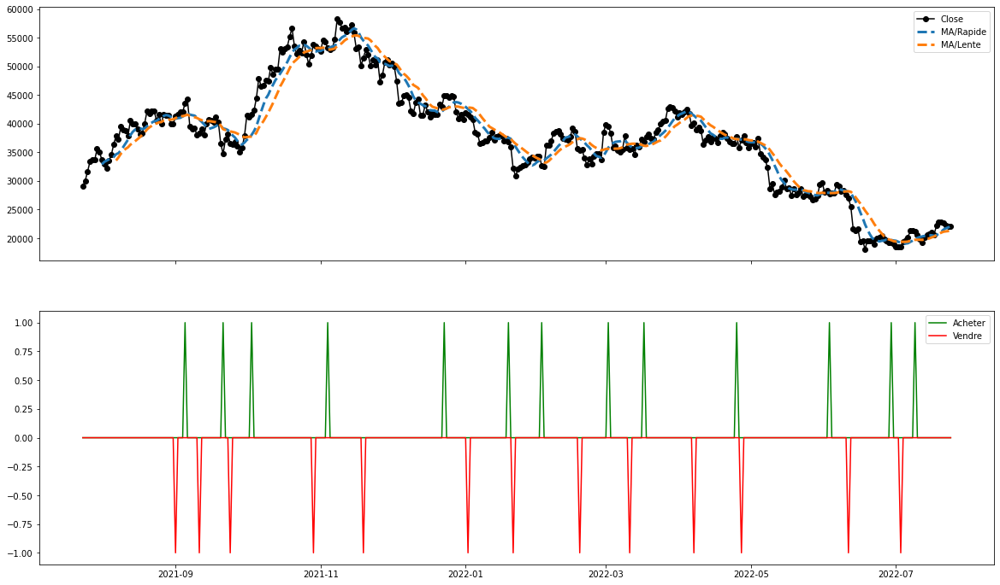

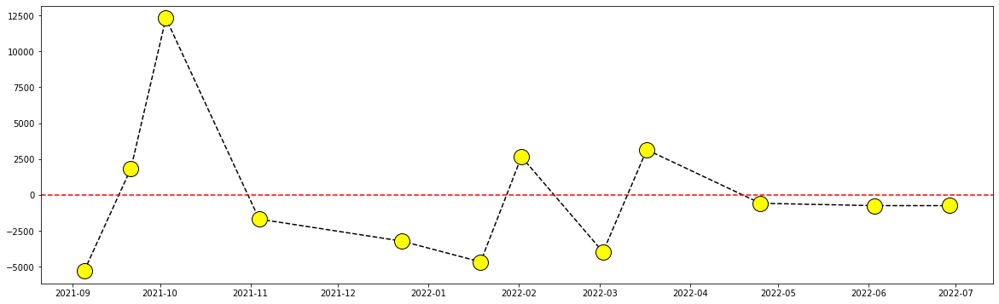

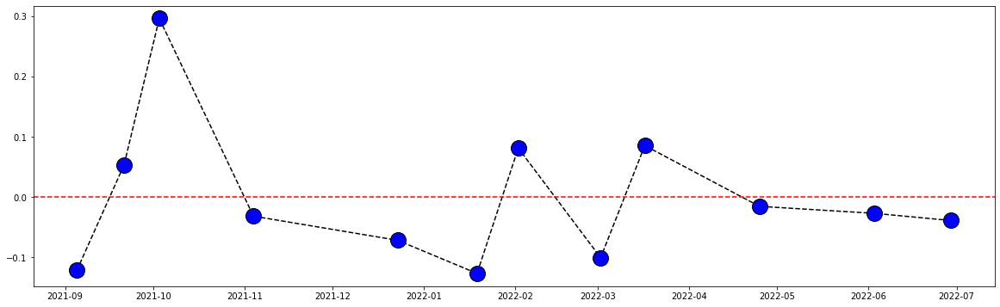

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[9,20]
Durant la période avec une MA lente à 20 jours
    et une MA rapide à 9 jours on enregistre :
    


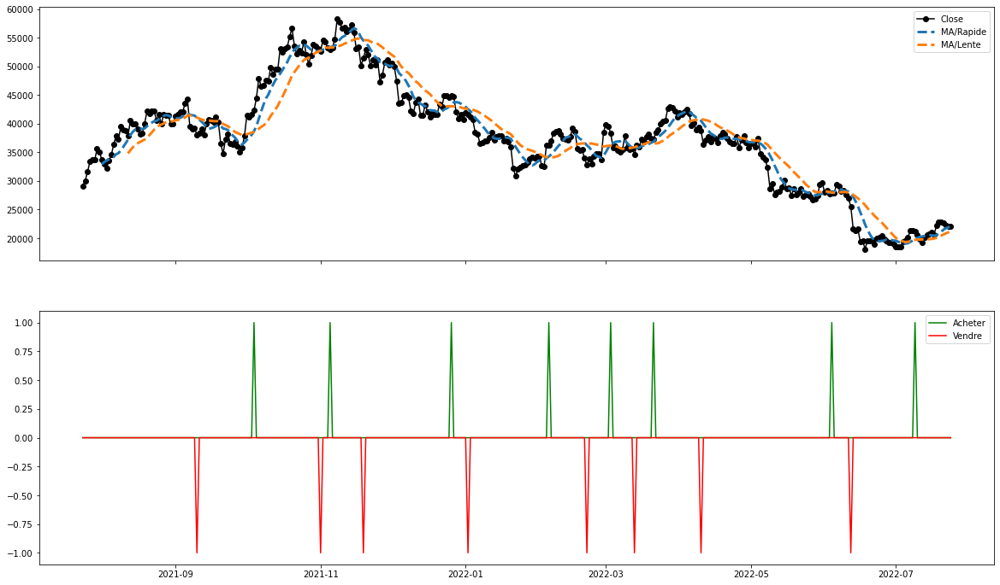

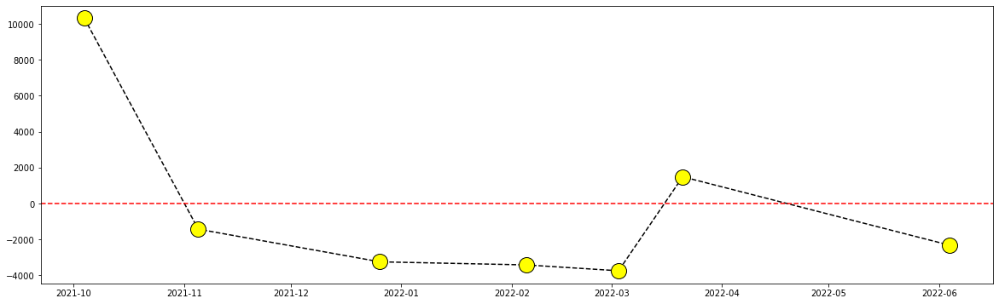

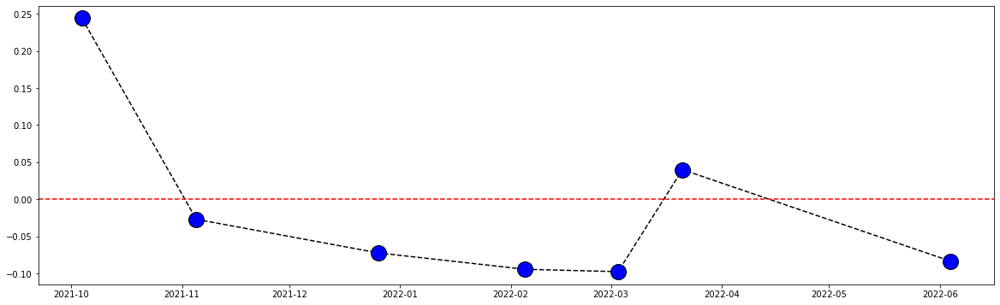

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[9,25]
Durant la période avec une MA lente à 25 jours
    et une MA rapide à 9 jours on enregistre :
    


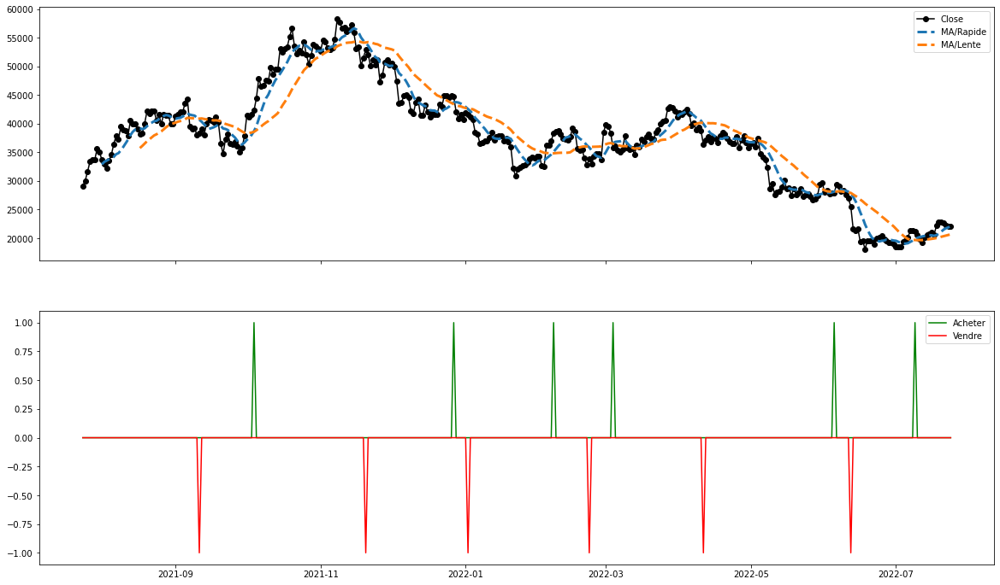

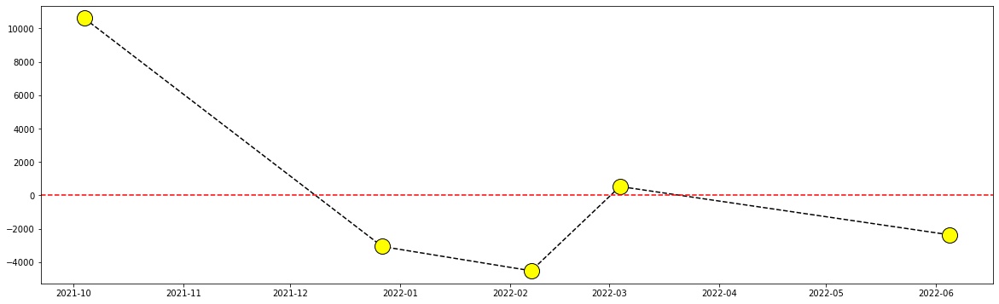

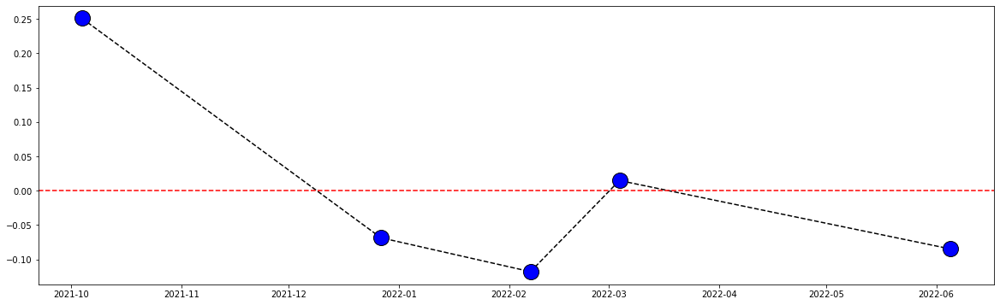

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[9,30]
Durant la période avec une MA lente à 30 jours
    et une MA rapide à 9 jours on enregistre :
    


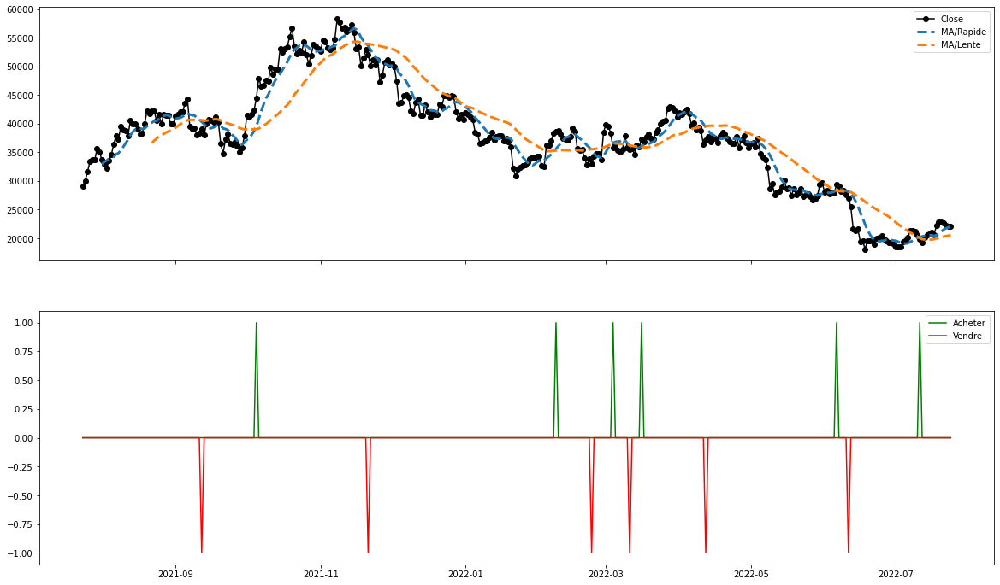

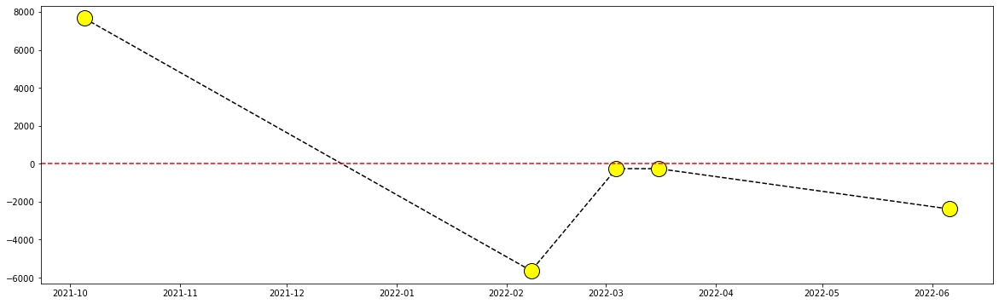

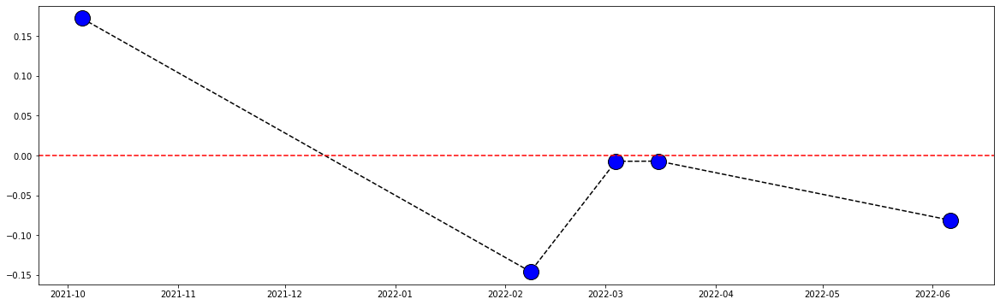

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[9,35]
Durant la période avec une MA lente à 35 jours
    et une MA rapide à 9 jours on enregistre :
    


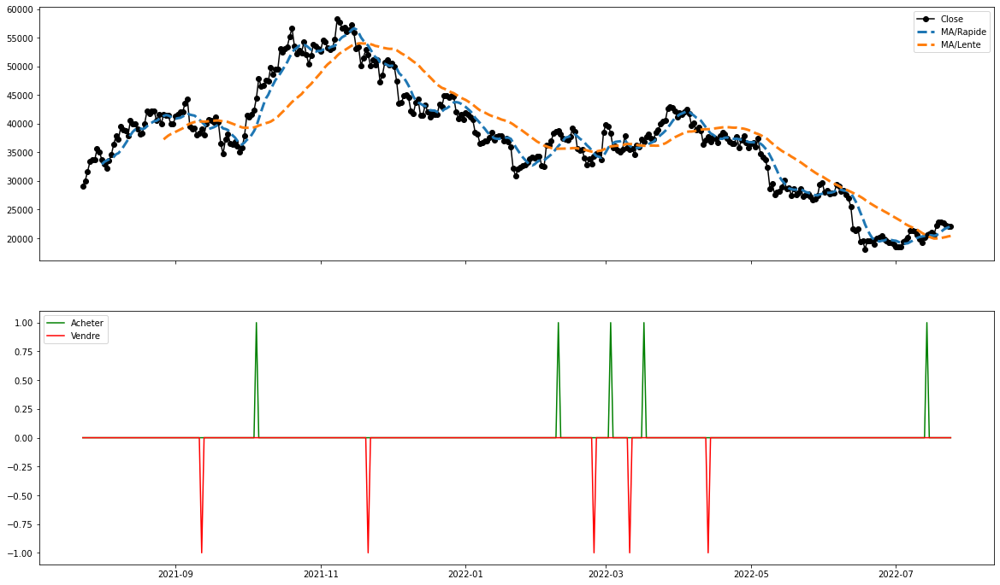

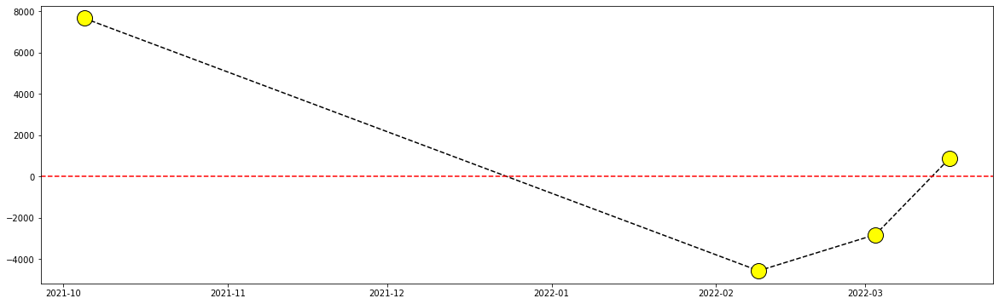

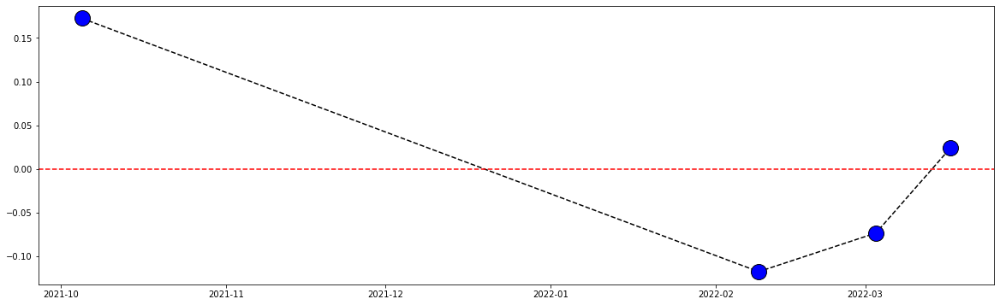

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[9,40]
Durant la période avec une MA lente à 40 jours
    et une MA rapide à 9 jours on enregistre :
    


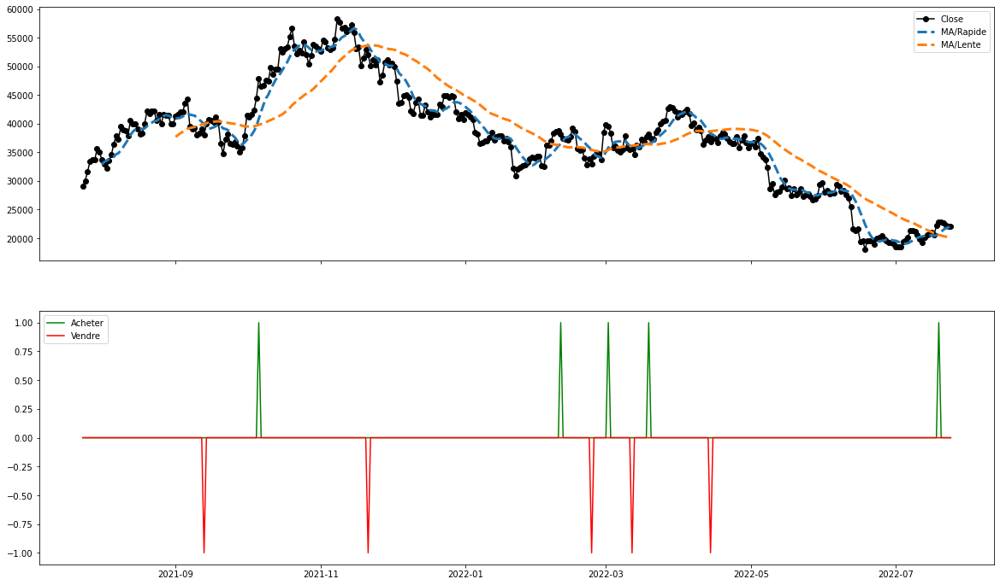

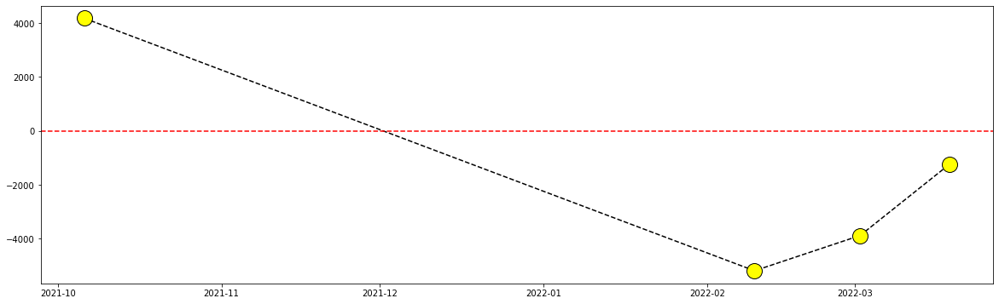

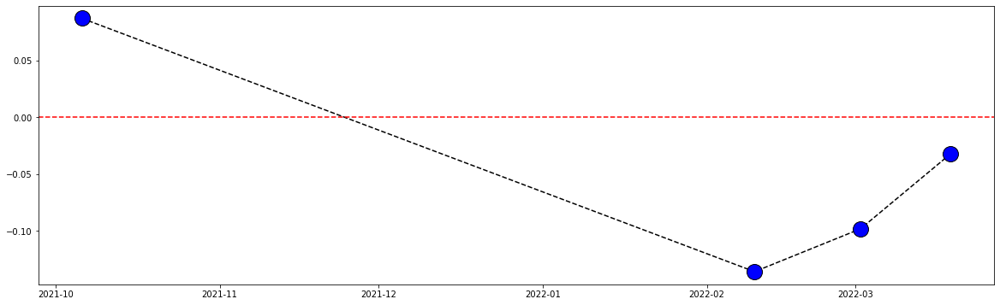

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------
[9,45]
Durant la période avec une MA lente à 45 jours
    et une MA rapide à 9 jours on enregistre :
    


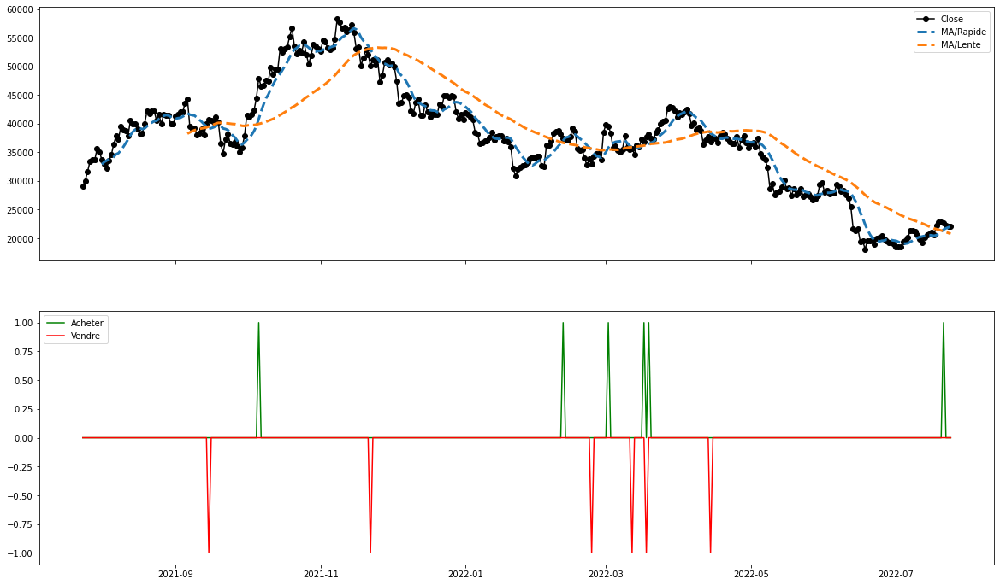

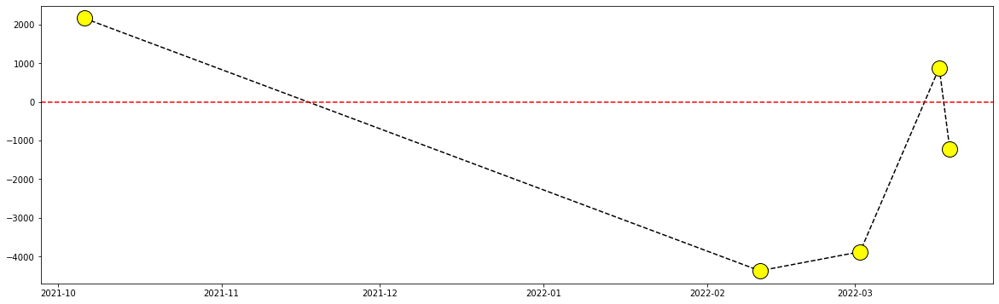

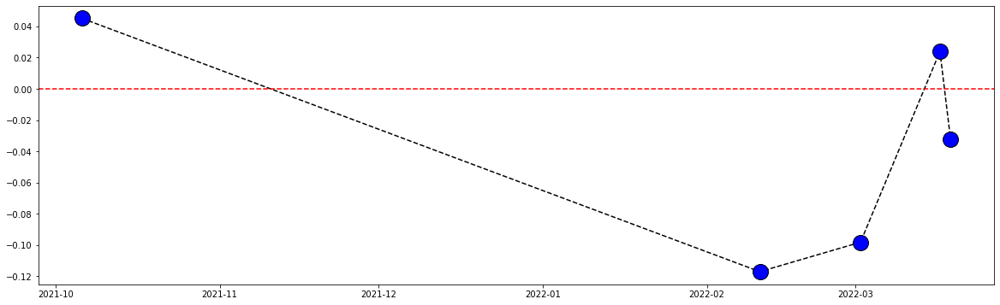

----------------------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------------


In [112]:
for j in windows.keys():
    f=j[1]
    s=j[3:5]
    
    print('--'*50)
    print('--'*50)
    print(j)
    print(f'''Durant la période avec une MA lente à {s} jours
    et une MA rapide à {f} jours on enregistre :
    ''')
    
    fig, ax = plt.subplots(2, figsize=(20,12), sharex=True)
    # plt.figure(figsize=(12, 8))
    # plt.subplot(211)
   
    # La donnée historique 
    data = history[j].copy()
    ax[0].plot(data['Close'],marker='o',color='black')
    ax[0].plot(data[f'MA{f}'],ls='--',lw=3)
    ax[0].plot(data[f'MA{s}'],ls='--',lw=3)
    ax[0].legend(['Close', 'MA/Rapide', 'MA/Lente'])

    ax[1].plot(data['Achat'], c='g')
    ax[1].plot(data['Vendre'], c='r')

    ax[1].legend(['Acheter', 'Vendre'])
    
    plt.figure(figsize = (20,6))
    plt.plot(windows[j]['Date_achat'],windows[j]['rendement'],marker='o',color='black',linestyle='--',markerfacecolor='yellow',markersize=18)
    plt.axhline(y=0,color='red',linestyle='--')
    plt.show()
    
    plt.figure(figsize = (20,6))
    plt.plot(windows[j]['Date_achat'],windows[j]['rendement%'],marker='o',color='black',linestyle='--',markerfacecolor='blue',markersize=18)
    plt.axhline(y=0,color='red',linestyle='--')
    plt.show()
    print('--'*50)
    print('--'*50)
    

### PONDERER L INDICATEUR STOCHASTIQUE 

- Pour le rendre mobile indication de fenêtre 

- Comparer la moyenne mobile simple 

- Vs la moyenne mobile rendement 


- Implémenter l'éxecution resultat net 

In [ ]:
plt.title('IS = Indicateur Stochastique')

btc.loc['2022','indicateur_stochastique'].plot(figsize=(18,9),label='IS')
btc.loc['2022','indicateur_stochastique'].ewm(alpha=0.6).mean().plot(figsize=(18,9),label='MA3 IS')

plt.legend()
plt.grid()

### Hypothèse pour déterminer potentiel profit / perte

> - **MA(%K(x))**
> - **MA(%K(y))**
> - **Diff[MA(%K(x)),MA(%K(y))]**

Potential profit (Diff >0)


In [ ]:
plt.title('IS = Indicateur Stochastique')

btc.loc[:,'indicateur_stochastique'].plot(figsize=(18,9),label='IS')


plt.legend()
plt.grid()

In [ ]:
# MA -> 'EMA'

start ='2022'
end='2022'

fig, ax = plt.subplots(2, figsize=(20,12), sharex=True)
# plt.figure(figsize=(12, 8))
# plt.subplot(211)


ax[0].plot(btc.loc['2022','Close'],marker='o',markerfacecolor='orange',color='black')
ax[0].plot(btc['Close'].rolling(window = 20).mean()['2022'],ls='--',lw=3)
ax[0].plot(btc['Close'].rolling(window = 50).mean()['2022'],ls='--',lw=3)

ax[0].legend(['Close','MA20','MA50'])

ax[1].plot(btc.loc['2022','indicateur_stochastique'])
ax[1].plot(btc.loc['2022','indicateur_stochastique'].rolling(window=3).mean())
ax[1].legend(['IS','MA IS'])



In [ ]:
plt.title('Return Veille')

btc['return']= btc['Close']/btc['Close'].shift(-1)

btc.loc['2022','return'].plot(figsize=(18,9),label='Actuel/Veille',marker='o',markerfacecolor='blue',ls='--',color='black',alpha=0.6)

plt.legend()
plt.grid()

In [ ]:
plt.figure(figsize=(12, 8))

times=btc.loc['2022', 'Close'].index

btc.loc['2022', 'Close'].plot()
btc.loc['2022', 'Close'].ewm(alpha=0.8, halflife='20 days', times=pd.DatetimeIndex(times)).mean().plot(label='ewm 0.8', lw=3, ls=':', alpha=0.8)
btc.loc['2022', 'Close'].ewm(alpha=0.8, halflife='50 days', times=pd.DatetimeIndex(times)).mean().plot(label='ewm 0.8', lw=3, ls=':', alpha=0.8)

plt.grid()
plt.legend()


In [ ]:
plt.figure(figsize=(12, 8))
btc.loc['2022', 'Close'].plot()
btc.loc['2022', 'Close'].rolling(window=5).mean().plot(label='MA5', lw=3, ls=':', alpha=0.8)
btc.loc['2022', 'Close'].rolling(window=18).mean().plot(label='MA18', lw=3, ls=':', alpha=0.8)
btc.loc['2022', 'Close'].ewm(alpha=0.6).mean().plot(label='ewm 0.6', lw=3, ls=':', alpha=0.8)

plt.grid()
plt.legend()

In [ ]:
plt.figure(figsize=(12, 8))
btc.loc['2022-04', 'Close'].plot(color='black')

for i in np.arange(0.2, 1, 0.2):
    btc.loc['2022-04', 'Close'].ewm(alpha=i).mean().plot(label=f'ewm {i}', ls='--', alpha=0.8)

plt.grid()
plt.legend()
plt.show()


In [ ]:
def lissage_expo(alpha,n):
    res = 0
    # pour savoir à quelle vitesse on converge vers 1 je stock chaque nouveau calcul 
    sum_cumulee=[]
    coeff=[]
    for i in range(n):
        res += alpha*(1-alpha)**i
        sum_cumulee.append(res)
        coeff.append(alpha*(1-alpha)**i) 

    
    return coeff, sum_cumulee,res 


coeff, sum_cumulee,res  = lissage_expo(0.8,3)

In [ ]:
import numpy as np
print(f"Sum------(coefficient des signaux)")
print(coeff)

print("\n")
print(f"L'évolution des sum_cumulee f")
print(sum_cumulee)


print("\n")
print(f"L'évolution des résidus selon l'ancienneté")
print(np.round(1-np.array(sum_cumulee),3))

print("\n")
print(res)